This notebook is constructs visualizations for the social demographics data, presented on this link: https://docs.google.com/presentation/d/15msmlmLKZbCi_RMv_Xn0YG0P0XEJDT1hZftUJFrhIzM/edit#slide=id.g22d08920b94_0_198.

In [10]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.io import gbq
from google.cloud import bigquery
from scipy.stats import t

In [2]:
### EXAMPLE QUERY
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.outputs.final_non_interval`
'''

In [3]:
project_id = 'berkeley-data-discovery-2023'
final_non_interval = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)

In [4]:
final_non_interval.sort_values(by=['per_id_proxy'])

,per_id_proxy,income_range,p_city,p_zip,cur_esp,enduse,care,fera,medallot,payplan_cd,...,BuildingArea,LotSize,Stories,Rooms,Beds,Baths,ces_score,dac_flag,low_income_flag,opportunity_flag
0,1,middle income,CASTRO VALLEY,94546,EBCE,B,False,None,<NA>,False,...,1176.000000,6237.000000,1.0,6.0,3.000000,2.000000,28.32,False,False,High Resource
1,2,low income,OAKLAND,94605,EBCE,B,True,None,<NA>,False,...,1146.000000,4429.000000,1.0,6.0,3.000000,1.000000,21.77,False,True,Low Resource
2,3,None,OAKLAND,94610,EBCE,H,False,None,<NA>,False,...,936.514286,431.428571,4.0,0.0,1.142857,1.114286,25.58,False,False,Moderate Resource
3,4,middle income,HAYWARD,94541,EBCE,B,True,None,<NA>,True,...,1663.000000,5250.000000,1.0,7.0,3.000000,2.500000,32.15,False,False,Low Resource
4,5,indeterminate,DUBLIN,94568,EBCE,B,False,None,<NA>,False,...,1638.000000,6600.000000,1.0,7.0,3.000000,2.000000,16.65,False,False,High Resource
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478200,478201,low income,HAYWARD,94541,EBCE,M,True,None,1,False,...,1196.000000,6600.000000,1.0,5.0,3.000000,1.500000,36.65,False,True,Low Resource
478201,478202,None,SAN LEANDRO,94578,EBCE,H,False,None,<NA>,False,...,300.000000,3850.000000,1.0,3.0,1.000000,1.000000,28.8,False,True,Moderate Resource
478202,478203,low income,OAKLAND,94601,EBCE,B,True,None,<NA>,False,...,770.000000,1750.000000,1.0,4.0,1.000000,1.000000,35.42,False,True,Low Resource
478203,478204,high income,LIVERMORE,94551,EBCE,B,False,None,<NA>,False,...,1789.000000,0.000000,3.0,5.0,3.000000,3.500000,11.91,False,False,Moderate Resource


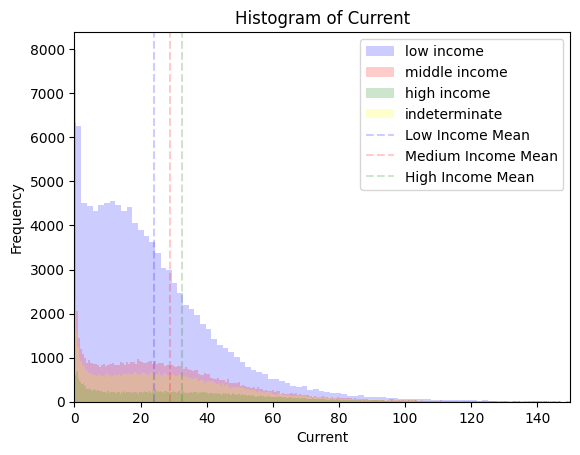

Low income mean: 23.950252581976205
Low income median: 17.847804878048777
Low income std. dev: 46.52079463966083
Medium income mean: 28.97631989205907
Medium income median: 23.491951219512192
Medium income std. dev: 37.93367358114221
High income mean: 32.638186690820895
High income median: 26.75658536585366
High income std. dev: 33.73992515979138


In [5]:
#slide 23 (Current)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['current'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['current'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['current'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['current'])

plt.hist(x1, bins = 5000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 5000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 5000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 5000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Current')
plt.ylabel('Frequency')
plt.title('Histogram of Current')
plt.xlim(0, 150)

plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

In [11]:
group1 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['current'])
group2 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['current'])

# calculate observed difference in means
observed_diff = np.mean(group1) - np.mean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 1000

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.var(bootstrap_sample1) / len(bootstrap_sample1)) + (np.var(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > t_crit:
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is not statistically significant (p >= 0.05).


[Text(0.5, 0, 'current'),
 Text(0, 0.5, 'Income'),
 Text(0.5, 1.0, 'Violin Plot of Current')]

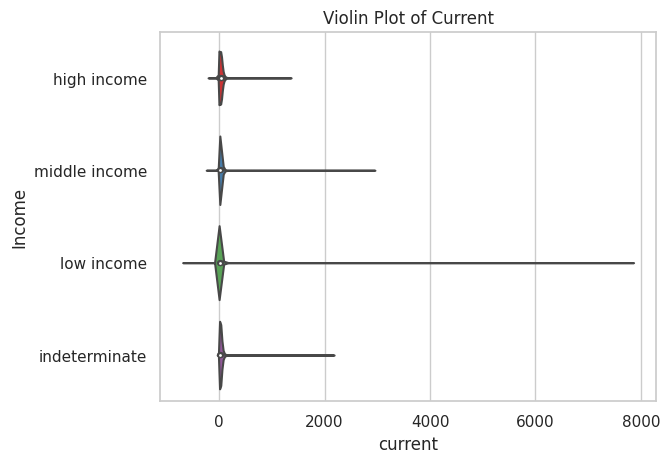

In [12]:
sns.set(style="whitegrid")
violin = sns.violinplot(x="current",y="income_range", data=final_non_interval, palette="Set1", inner="box", cut=2, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="current", ylabel = "Income", title ='Violin Plot of Current')


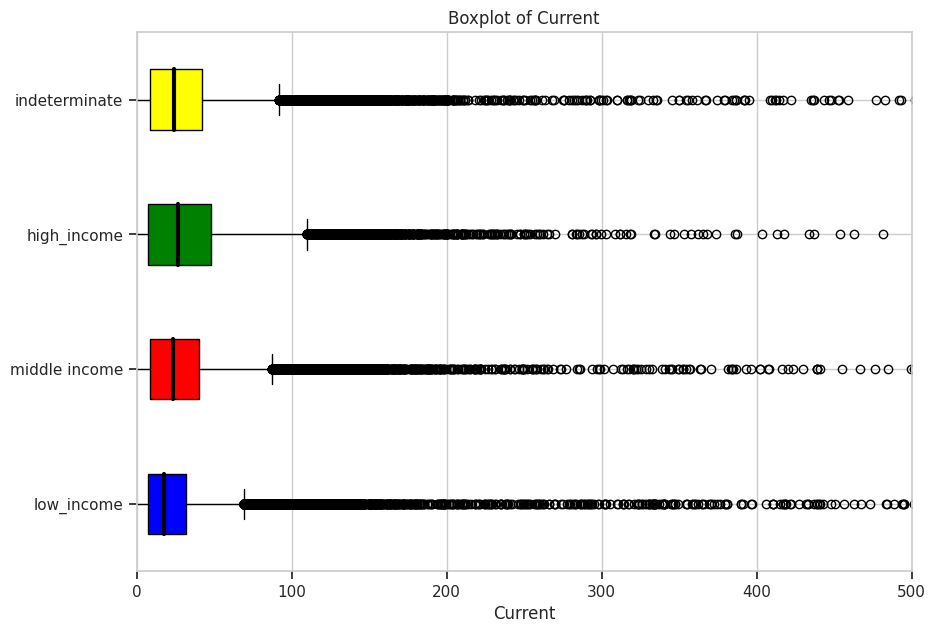

In [13]:
#slide 23 (Current)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['current'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['current'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['current'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['current'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Current')
# Adding title
plt.title("Boxplot of Current")
plt.xlim(0, 500)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

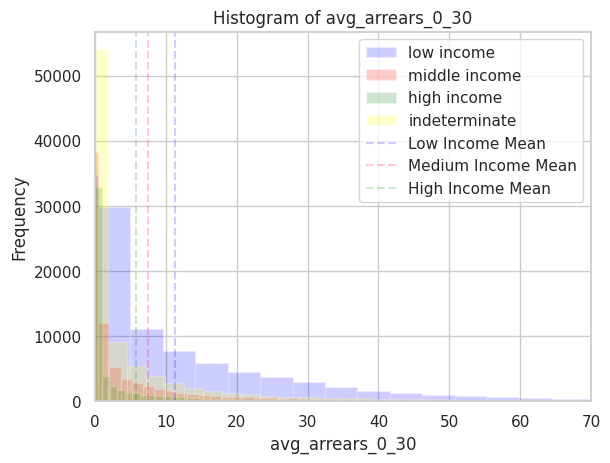

Low income mean: 11.239056963175772
Low income median: 2.6717073170731696
Low income std. dev: 33.9095545406363
Medium income mean: 7.457705181671741
Medium income median: 0.66
Medium income std. dev: 22.66559933080436
High income mean: 5.741100028925427
High income median: 0.17543292682926823
High income std. dev: 16.13745667779481


In [14]:
#slide 24 (Avg_arrears_0_30)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_0_30'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_0_30'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_0_30'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_0_30'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_0_30')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_0_30')
plt.xlim(0, 70)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

In [15]:
group1 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_0_30'])
group2 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_0_30'])

# calculate observed difference in means
observed_diff = np.mean(group1) - np.mean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 1000

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.var(bootstrap_sample1) / len(bootstrap_sample1)) + (np.var(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > t_crit:
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is not statistically significant (p >= 0.05).


[Text(0.5, 0, 'avg_arrears_0_30'),
 Text(0, 0.5, 'Income'),
 Text(0.5, 1.0, 'Violin Plot of avg_arrears_0_30')]

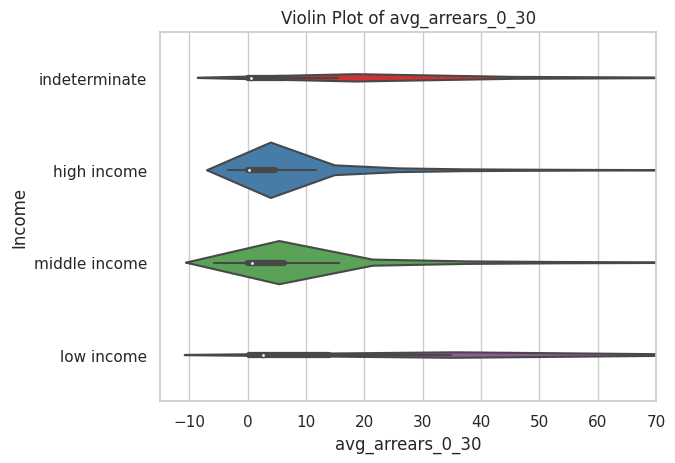

In [16]:
sns.set(style="whitegrid")
violin = sns.violinplot(x="avg_arrears_0_30",y="income_range", data=final_non_interval, palette="Set1", width=0.6, inner="box", cut=2, order = ["indeterminate", "high income", "middle income", "low income"])
violin.set_xlim(-15, 70)
violin.set(xlabel ="avg_arrears_0_30", ylabel = "Income", title ='Violin Plot of avg_arrears_0_30')


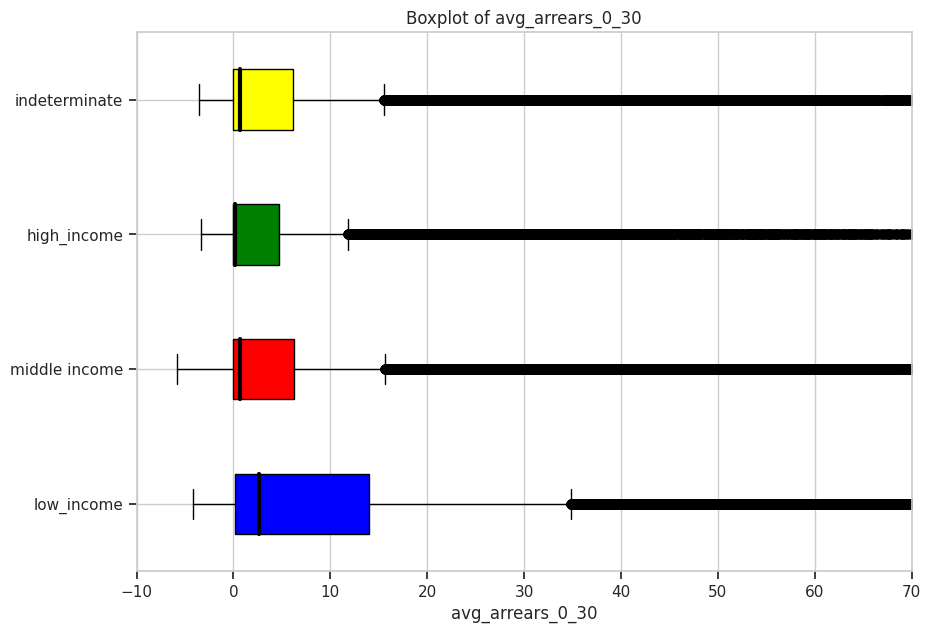

In [17]:
#slide 24 (Avg_arrears_0_30)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_0_30'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_0_30'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_0_30'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_0_30'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_0_30')
# Adding title
plt.title("Boxplot of avg_arrears_0_30")
plt.xlim(-10, 70)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

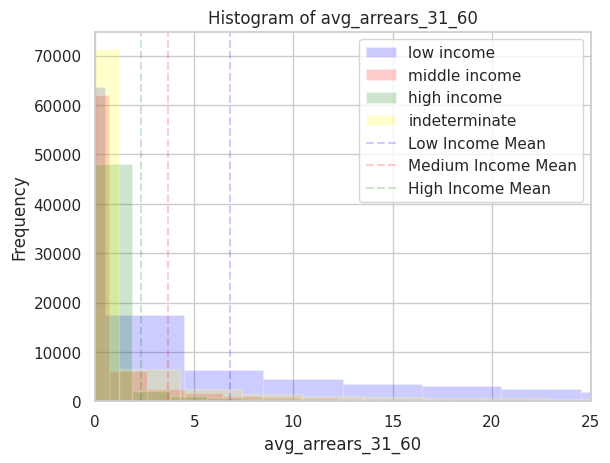

Low income mean: 6.8167500440348645
Low income median: 0.026206896551724135
Low income std. dev: 22.010329822775933
Medium income mean: 3.703499111281055
Medium income median: 0.0
Medium income std. dev: 15.999502413893431
High income mean: 2.306984986486692
High income median: 0.0
High income std. dev: 11.777810403185219


In [18]:
#slide 26 (Avg_arrears_31_60)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_31_60'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_31_60'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_31_60'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_31_60'])

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_31_60')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_31_60')
plt.xlim(0, 25)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

In [19]:
group1 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_31_60'])
group2 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_31_60'])

# calculate observed difference in means
observed_diff = np.mean(group1) - np.mean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 1000

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.var(bootstrap_sample1) / len(bootstrap_sample1)) + (np.var(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > t_crit:
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is not statistically significant (p >= 0.05).


In [20]:
# calculate observed difference in means
observed_diff = np.mean(group1) - np.mean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 1000

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.var(bootstrap_sample1) / len(bootstrap_sample1)) + (np.var(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > t_crit:
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is not statistically significant (p >= 0.05).


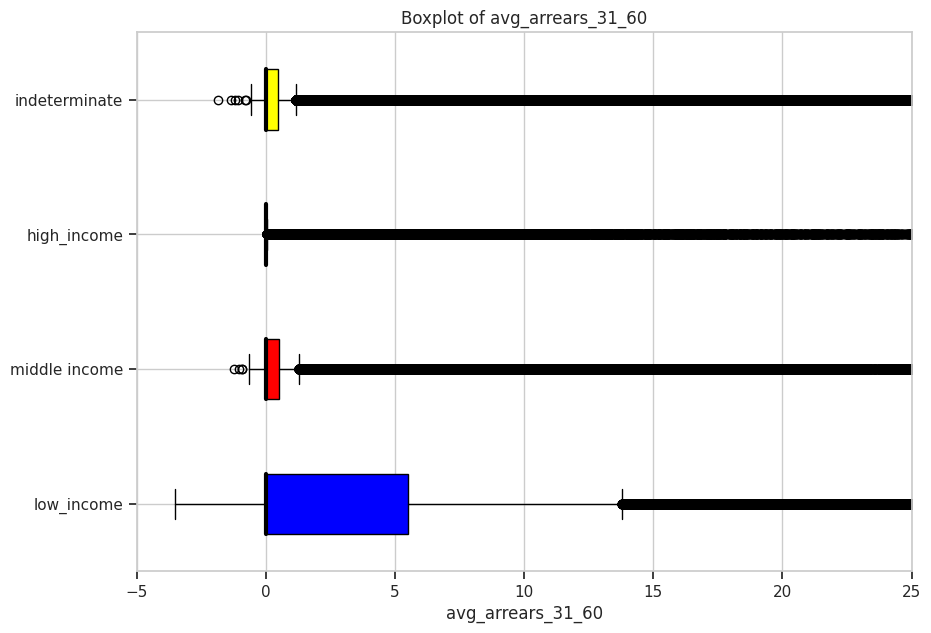

In [21]:
#slide 26 (Avg_arrears_31_60)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_31_60'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_31_60'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_31_60'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_31_60'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_31_60')
# Adding title
plt.title("Boxplot of avg_arrears_31_60")
plt.xlim(-5, 25)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

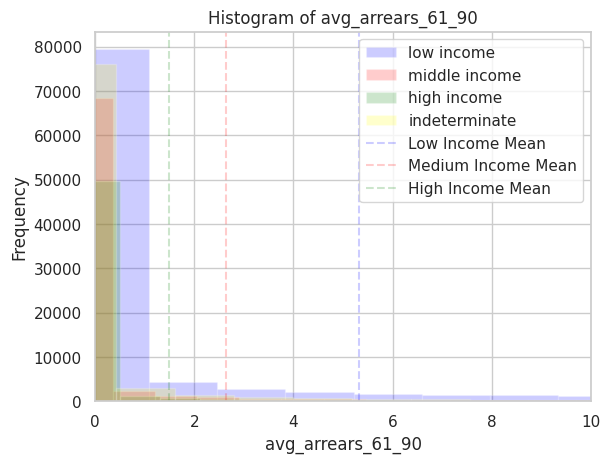

Low income mean: 5.328801951256666
Low income median: 0.0
Low income std. dev: 19.561021195508555
Medium income mean: 2.634466584177901
Medium income median: 0.0
Medium income std. dev: 13.662230731794574
High income mean: 1.5014546713663937
High income median: 0.0
High income std. dev: 10.080604690366949


In [22]:
#slide 28 (Avg_arrears_61_90)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_61_90'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_61_90'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_61_90'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_61_90'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_61_90')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_61_90')
plt.xlim(0, 10)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

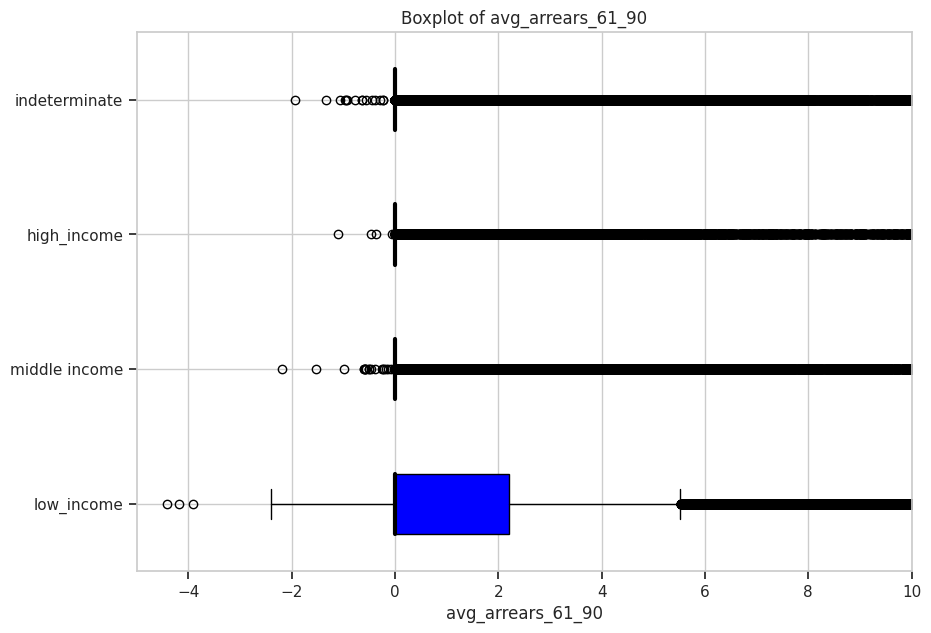

In [23]:
#slide 28 (Avg_arrears_61_90)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_61_90'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_61_90'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_61_90'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_61_90'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_61_90')
# Adding title
plt.title("Boxplot of avg_arrears_61_90")
plt.xlim(-5, 10)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

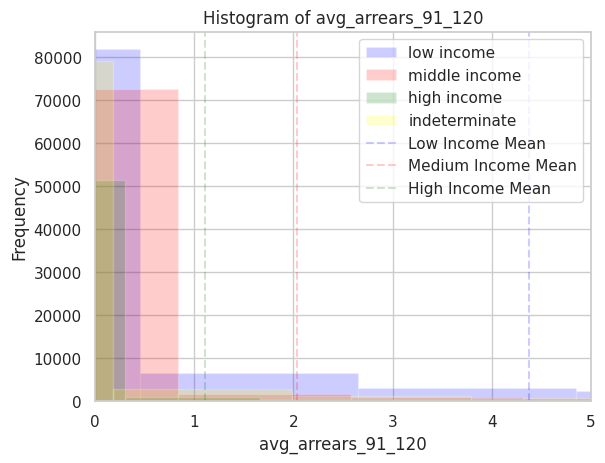

Low income mean: 4.372158749438106
Low income median: 0.0
Low income std. dev: 16.929496871146455
Medium income mean: 2.0392429956661404
Medium income median: 0.0
Medium income std. dev: 11.832307768480876
High income mean: 1.1095631726492658
High income median: 0.0
High income std. dev: 8.742737763128135


In [24]:
#slide 30 (Avg_arrears_91_120)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_91_120'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_91_120'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_91_120'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_91_120'])

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_91_120')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_91_120')
plt.xlim(0, 5)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

In [25]:
group1 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_91_120'])
group2 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_91_120'])

# calculate observed difference in means
observed_diff = np.mean(group1) - np.mean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 1000

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.var(bootstrap_sample1) / len(bootstrap_sample1)) + (np.var(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > t_crit:
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is not statistically significant (p >= 0.05).


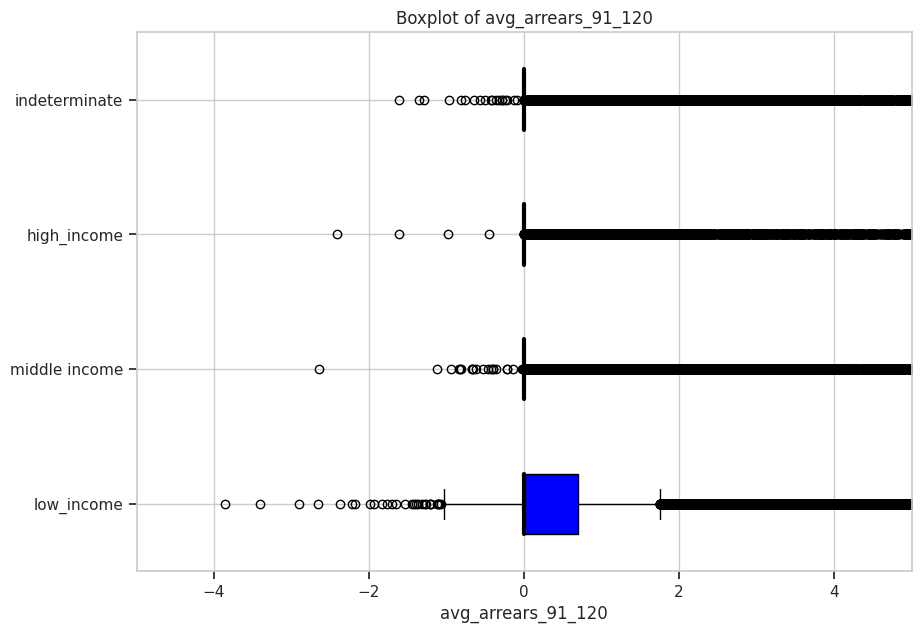

In [26]:
#slide 30 (Avg_arrears_91_120)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_91_120'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_91_120'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_91_120'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_91_120'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_91_120')
# Adding title
plt.title("Boxplot of avg_arrears_91_120")
plt.xlim(-5, 5)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

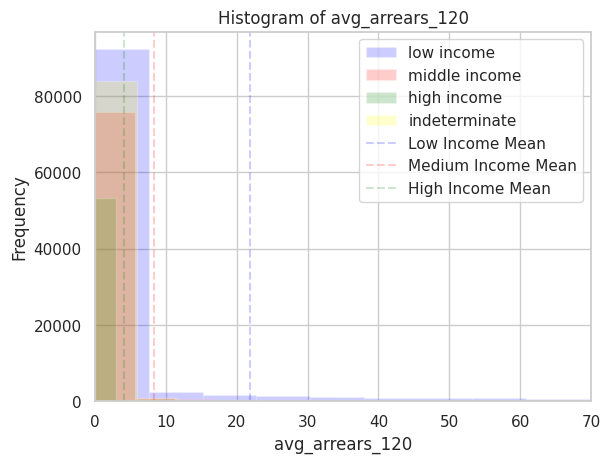

Low income mean: 21.942420567764795
Low income median: 0.0
Low income std. dev: 100.49633698707146
Medium income mean: 8.376638123545947
Medium income median: 0.0
Medium income std. dev: 68.13744790059972
High income mean: 4.023448657933438
High income median: 0.0
High income std. dev: 45.46418108688235


In [27]:
#slide 32 (Avg_arrears_120)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_120'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_120'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_120'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_120'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_120')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_120')
plt.xlim(0, 70)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

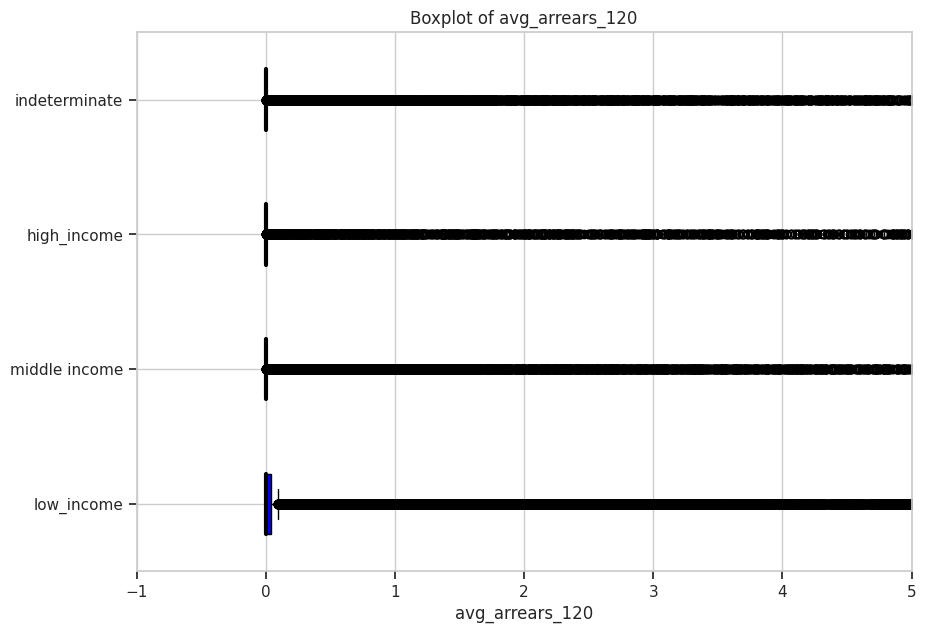

In [28]:
#slide 32 (Avg_arrears_120)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_120'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_120'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_120'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_120'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_120')
# Adding title
plt.title("Boxplot of avg_arrears_120")
plt.xlim(-1, 5)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

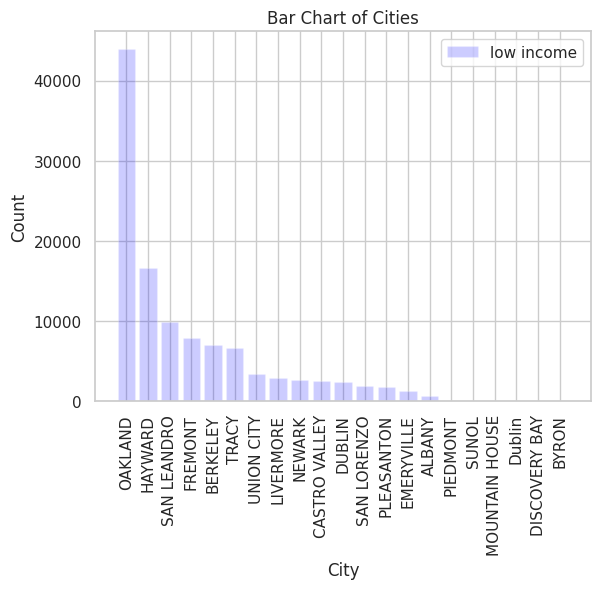

In [29]:
#slide 4 (p_city)

x1 = final_non_interval[final_non_interval['income_range'] == "low income"]
x2 = final_non_interval[final_non_interval['income_range'] == "middle income"]
x3 = final_non_interval[final_non_interval['income_range'] == "high income"]
x4 = final_non_interval[final_non_interval['income_range'] == "indeterminate"]

city_counts = x1.groupby('p_city').count()
city_counts = city_counts.sort_values(by='per_id_proxy', ascending=False)
city_counts_2 = x2.groupby('p_city').count()
#city_counts_2 = city_counts_2.sort_values(by='per_id_proxy', ascending=False)
city_counts_3 = x3.groupby('p_city').count()
#city_counts_3 = city_counts_3.sort_values(by='per_id_proxy', ascending=False)
city_counts_4 = x4.groupby('p_city').count()
#city_counts_4 = city_counts_4.sort_values(by='per_id_proxy', ascending=False)

plt.bar(city_counts.index, city_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')
#plt.bar(city_counts_2.index, city_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')
#plt.bar(city_counts_3.index, city_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')
#plt.bar(city_counts_4.index, city_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('City')
plt.ylabel('Count')
plt.title('Bar Chart of Cities')
plt.xticks(rotation=90)
plt.legend()
plt.show()


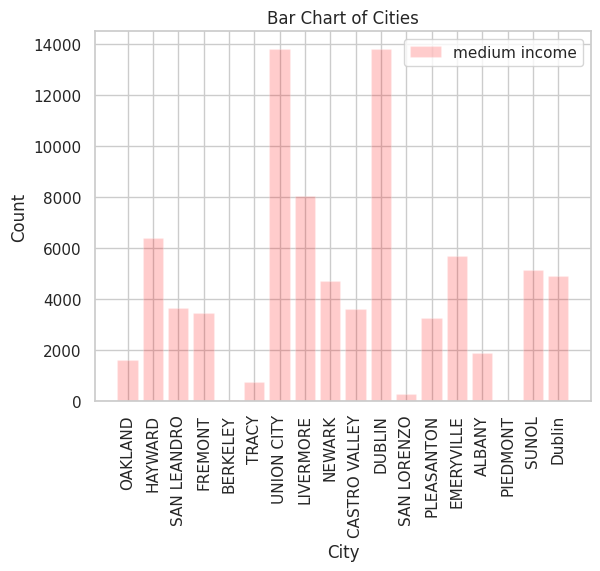

In [30]:
#slide 4 (p_city)

plt.bar(city_counts_2.index, city_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')
xtick_labels = ['OAKLAND', "HAYWARD", "SAN LEANDRO", "FREMONT", "BERKELEY", 'TRACY', 'UNION CITY', 'LIVERMORE', "NEWARK", "CASTRO VALLEY", "DUBLIN", 'SAN LORENZO', 'PLEASANTON', 'EMERYVILLE', 'ALBANY', "PIEDMONT", "SUNOL", "Dublin"]
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Bar Chart of Cities')
plt.xticks(city_counts_2.index, xtick_labels, rotation=90)
plt.legend()
plt.show()


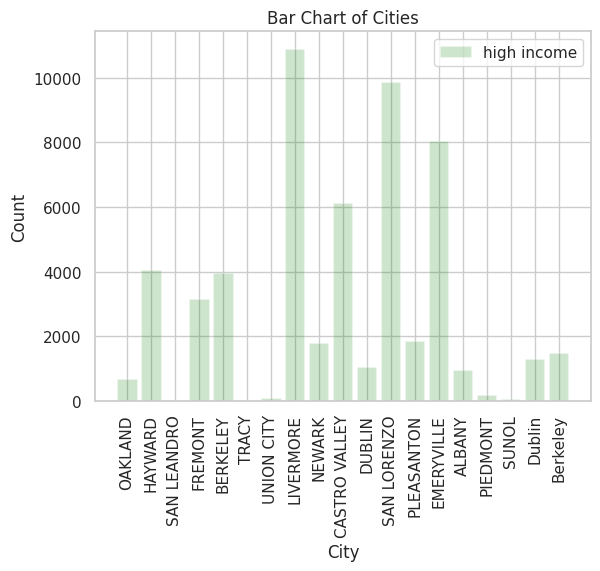

In [31]:
#slide 5 (p_city)

plt.bar(city_counts_3.index, city_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')
xtick_labels = ['OAKLAND', "HAYWARD", "SAN LEANDRO", "FREMONT", "BERKELEY", 'TRACY', 'UNION CITY', 'LIVERMORE', "NEWARK", "CASTRO VALLEY", "DUBLIN", 'SAN LORENZO', 'PLEASANTON', 'EMERYVILLE', 'ALBANY', "PIEDMONT", "SUNOL", "Dublin", 'Berkeley']
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Bar Chart of Cities')
plt.xticks(city_counts_3.index, xtick_labels, rotation=90)
plt.legend()
plt.show()



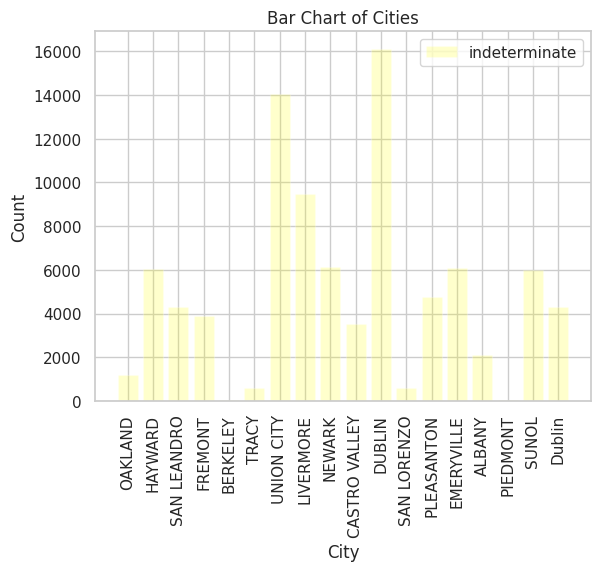

In [32]:
#slide 5 (p_city)

plt.bar(city_counts_4.index, city_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')
xtick_labels = ['OAKLAND', "HAYWARD", "SAN LEANDRO", "FREMONT", "BERKELEY", 'TRACY', 'UNION CITY', 'LIVERMORE', "NEWARK", "CASTRO VALLEY", "DUBLIN", 'SAN LORENZO', 'PLEASANTON', 'EMERYVILLE', 'ALBANY', "PIEDMONT", "SUNOL", "Dublin"]
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Bar Chart of Cities')
plt.xticks(city_counts_4.index, xtick_labels, rotation=90)
plt.legend()
plt.show()


In [33]:
final_non_interval['enduse'].value_counts()

B    397574
H     62929
M     16170
S      1393
P        87
Name: enduse, dtype: int64

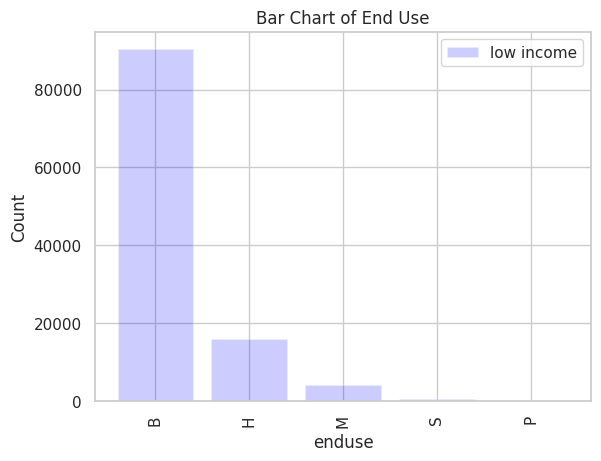

In [34]:
#slide 6 (enduse)

x1 = final_non_interval[final_non_interval['income_range'] == "low income"]
x2 = final_non_interval[final_non_interval['income_range'] == "middle income"]
x3 = final_non_interval[final_non_interval['income_range'] == "high income"]
x4 = final_non_interval[final_non_interval['income_range'] == "indeterminate"]

enduse_counts = x1.groupby('enduse').count()
enduse_counts = enduse_counts.sort_values(by='per_id_proxy', ascending=False)
enduse_counts_2 = x2.groupby('enduse').count()
enduse_counts_3 = x3.groupby('enduse').count()
enduse_counts_4 = x4.groupby('enduse').count()

plt.bar(enduse_counts.index, enduse_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('enduse')
plt.ylabel('Count')
plt.title('Bar Chart of End Use')
plt.xticks(rotation=90)
plt.legend()
plt.show()


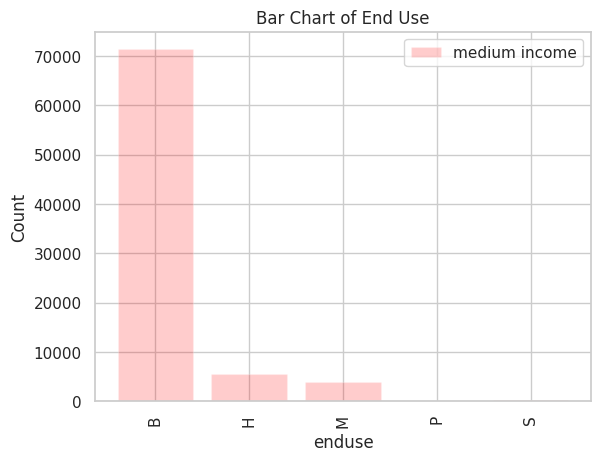

In [35]:
#slide 6 (enduse)

plt.bar(enduse_counts_2.index, enduse_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('enduse')
plt.ylabel('Count')
plt.title('Bar Chart of End Use')
plt.xticks(rotation=90)
plt.legend()
plt.show()


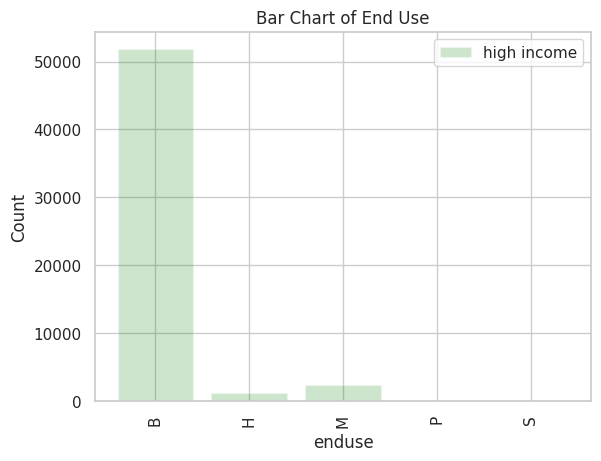

In [36]:
#slide 6 (enduse)

plt.bar(enduse_counts_3.index, enduse_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('enduse')
plt.ylabel('Count')
plt.title('Bar Chart of End Use')
plt.xticks(rotation=90)
plt.legend()
plt.show()


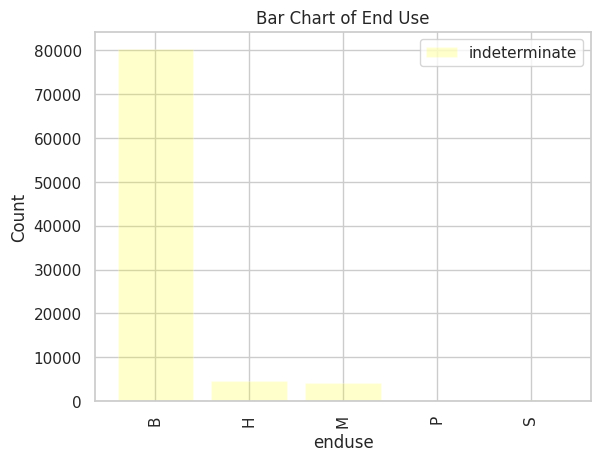

In [37]:
#slide 6 (enduse)

plt.bar(enduse_counts_4.index, enduse_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('enduse')
plt.ylabel('Count')
plt.title('Bar Chart of End Use')
plt.xticks(rotation=90)
plt.legend()
plt.show()


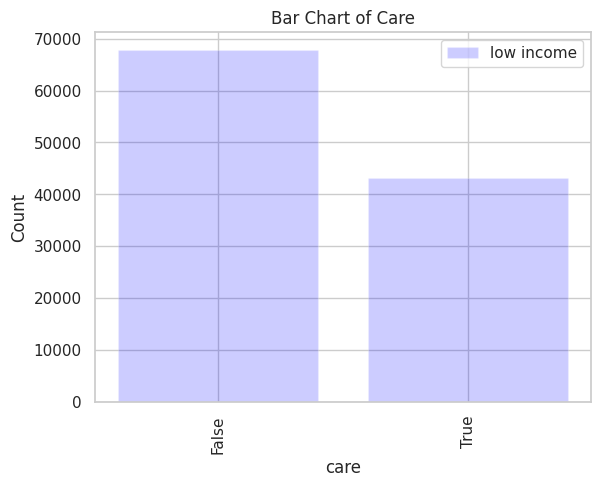

In [38]:
#slide 7 (care)

care_counts = x1.groupby('care').count()
care_counts_2 = x2.groupby('care').count()
care_counts_3 = x3.groupby('care').count()
care_counts_4 = x4.groupby('care').count()

plt.bar(['False', 'True'], care_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('care')
plt.ylabel('Count')
plt.title('Bar Chart of Care')
plt.xticks(rotation=90)
plt.legend()
plt.show()

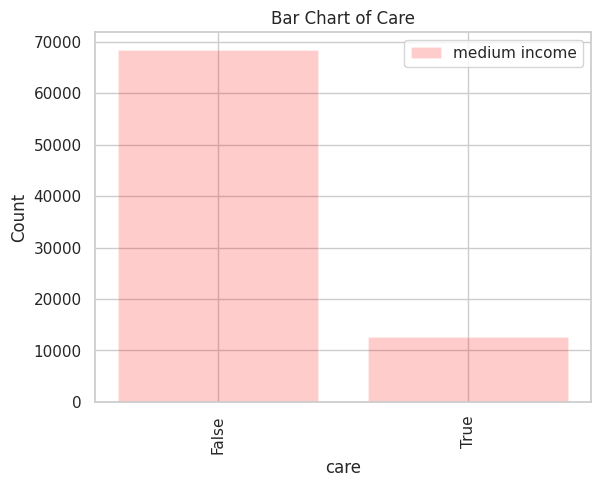

In [39]:
#slide 7 (care)

plt.bar(['False', 'True'], care_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('care')
plt.ylabel('Count')
plt.title('Bar Chart of Care')
plt.xticks(rotation=90)
plt.legend()
plt.show()

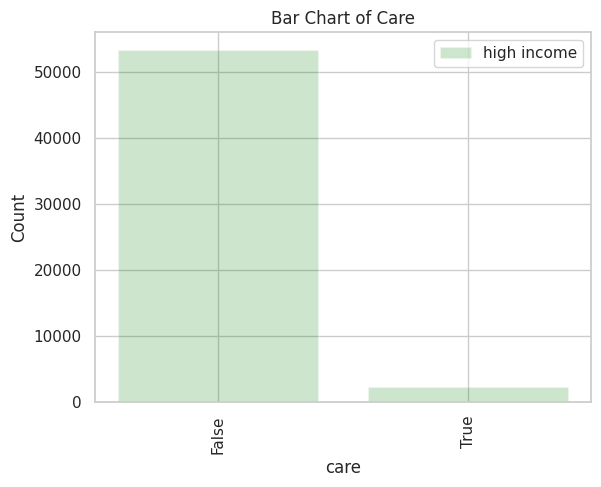

In [40]:
#slide 7 (care)

plt.bar(['False', 'True'], care_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('care')
plt.ylabel('Count')
plt.title('Bar Chart of Care')
plt.xticks(rotation=90)
plt.legend()
plt.show()

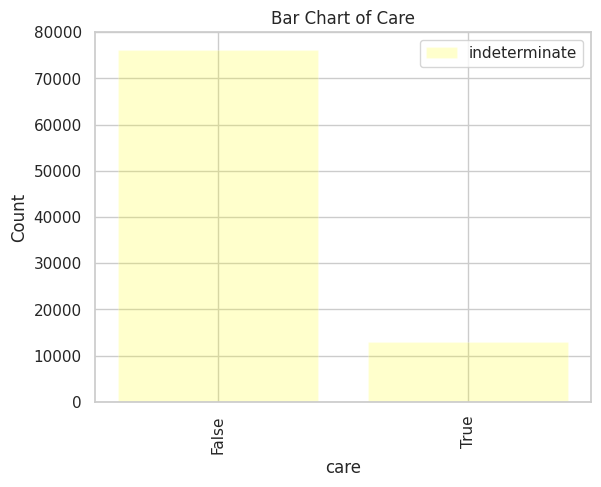

In [41]:
#slide 7 (care)

plt.bar(['False', 'True'], care_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('care')
plt.ylabel('Count')
plt.title('Bar Chart of Care')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [42]:
final_non_interval['fera'].value_counts()

NO     7857
YES    3235
          4
Name: fera, dtype: int64

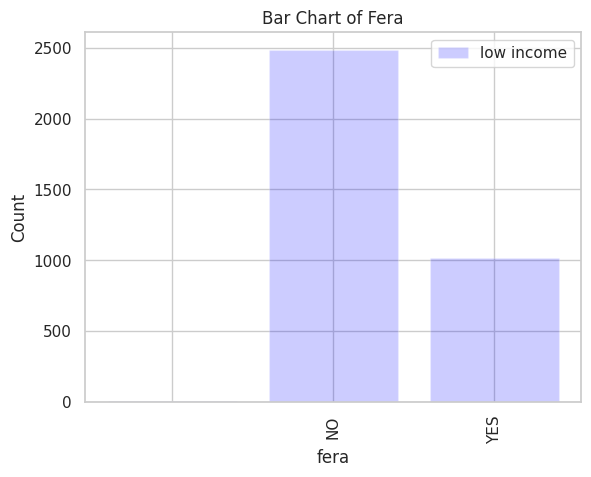

In [43]:
#slide 8 (fera)

fera_counts = x1.groupby('fera').count()
fera_counts_2 = x2.groupby('fera').count()
fera_counts_3 = x3.groupby('fera').count()
fera_counts_4 = x4.groupby('fera').count()

plt.bar(fera_counts.index, fera_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('fera')
plt.ylabel('Count')
plt.title('Bar Chart of Fera')
plt.xticks(rotation=90)
plt.legend()
plt.show()

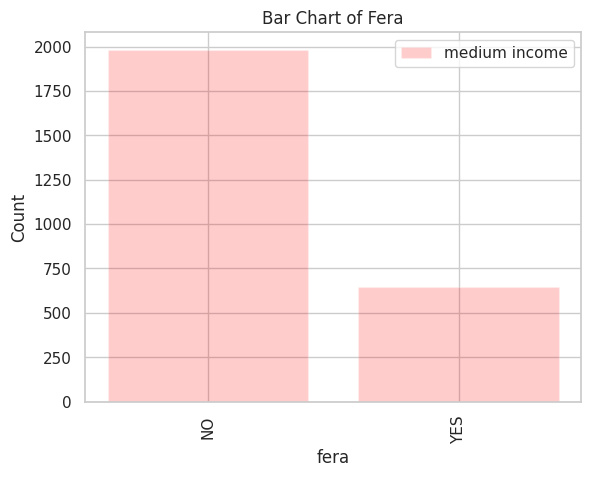

In [44]:
#slide 8 (fera)

plt.bar(fera_counts_2.index, fera_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('fera')
plt.ylabel('Count')
plt.title('Bar Chart of Fera')
plt.xticks(rotation=90)
plt.legend()
plt.show()

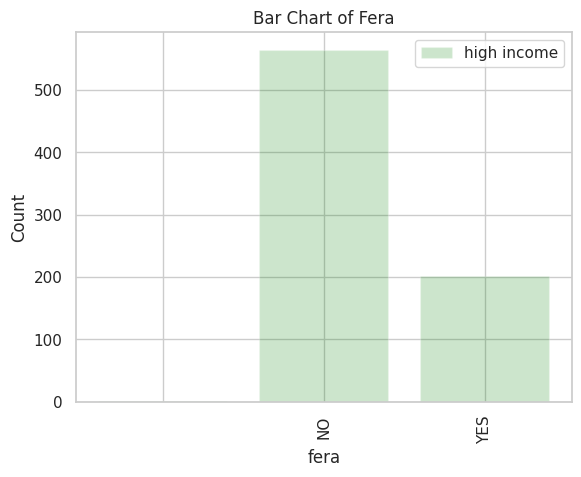

In [45]:
#slide 8 (fera)

plt.bar(fera_counts_3.index, fera_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('fera')
plt.ylabel('Count')
plt.title('Bar Chart of Fera')
plt.xticks(rotation=90)
plt.legend()
plt.show()

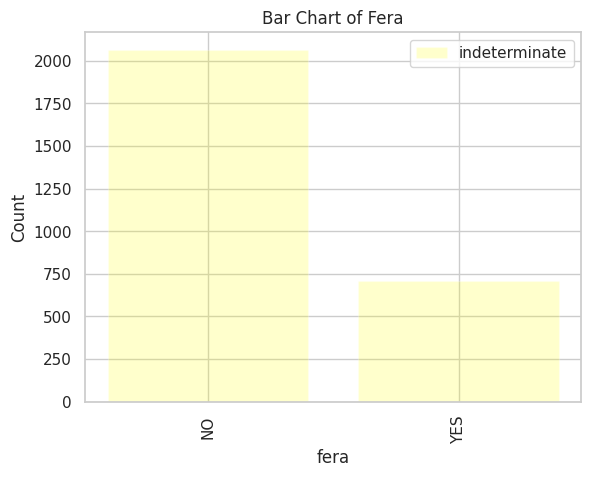

In [46]:
#slide 8 (fera)

plt.bar(fera_counts_4.index, fera_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('fera')
plt.ylabel('Count')
plt.title('Bar Chart of Fera')
plt.xticks(rotation=90)
plt.legend()
plt.show()

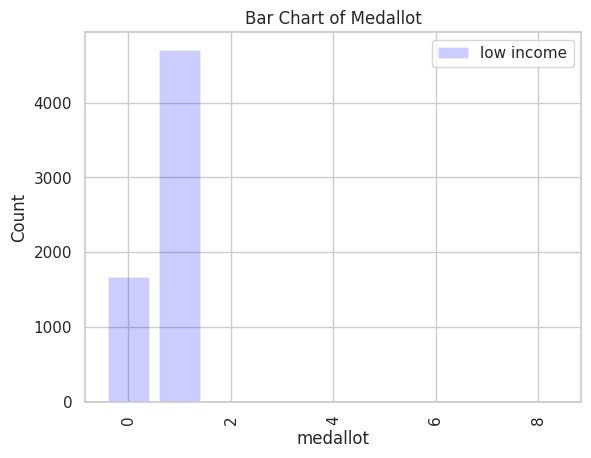

In [47]:
#slide 9 (medallot)

medallot_counts = x1.groupby('medallot').count()
medallot_counts = medallot_counts.sort_values(by='per_id_proxy', ascending=False)
medallot_counts_2 = x2.groupby('medallot').count()
medallot_counts_3 = x3.groupby('medallot').count()
medallot_counts_4 = x4.groupby('medallot').count()

plt.bar(medallot_counts.index, medallot_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('medallot')
plt.ylabel('Count')
plt.title('Bar Chart of Medallot')
plt.xticks(rotation=90)
plt.legend()
plt.show()

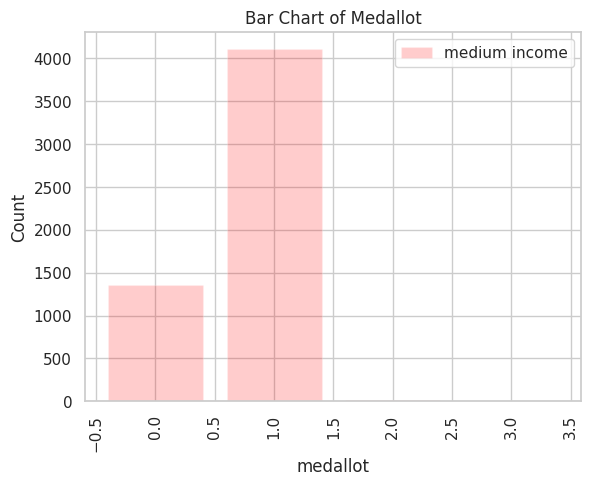

In [48]:
#slide 9 (medallot)

plt.bar(medallot_counts_2.index, medallot_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('medallot')
plt.ylabel('Count')
plt.title('Bar Chart of Medallot')
plt.xticks(rotation=90)
plt.legend()
plt.show()

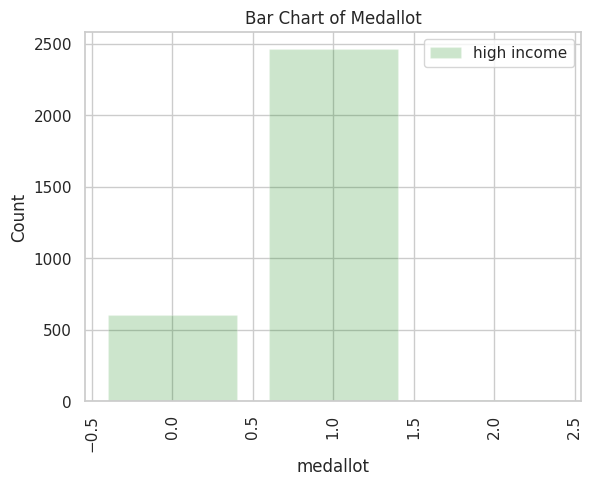

In [49]:
#slide 9 (medallot)

plt.bar(medallot_counts_3.index, medallot_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('medallot')
plt.ylabel('Count')
plt.title('Bar Chart of Medallot')
plt.xticks(rotation=90)
plt.legend()
plt.show()

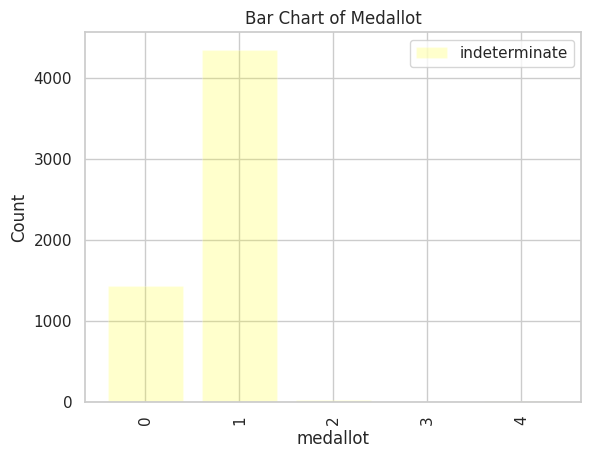

In [50]:
#slide 9 (medallot)

plt.bar(medallot_counts_4.index, medallot_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('medallot')
plt.ylabel('Count')
plt.title('Bar Chart of Medallot')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [51]:
final_non_interval['payplan_cd'].value_counts()

False    446896
True      31305
Name: payplan_cd, dtype: Int64

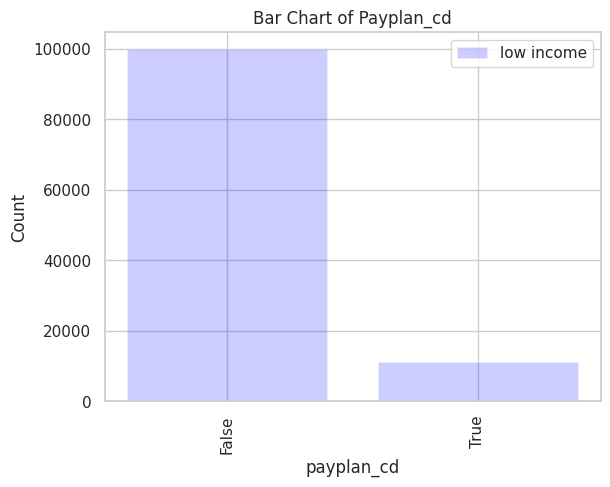

In [52]:
#slide 10 (payplan_cd)

payplan_cd_counts = x1.groupby('payplan_cd').count()
payplan_cd_counts_2 = x2.groupby('payplan_cd').count()
payplan_cd_counts_3 = x3.groupby('payplan_cd').count()
payplan_cd_counts_4 = x4.groupby('payplan_cd').count()

plt.bar(['False', 'True'], payplan_cd_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('payplan_cd')
plt.ylabel('Count')
plt.title('Bar Chart of Payplan_cd')
plt.xticks(rotation=90)
plt.legend()
plt.show()

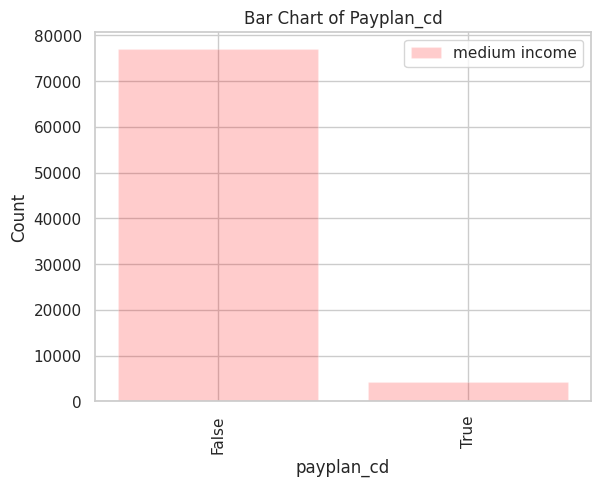

In [53]:
#slide 10 (payplan_cd)

plt.bar(['False', 'True'], payplan_cd_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('payplan_cd')
plt.ylabel('Count')
plt.title('Bar Chart of Payplan_cd')
plt.xticks(rotation=90)
plt.legend()
plt.show()

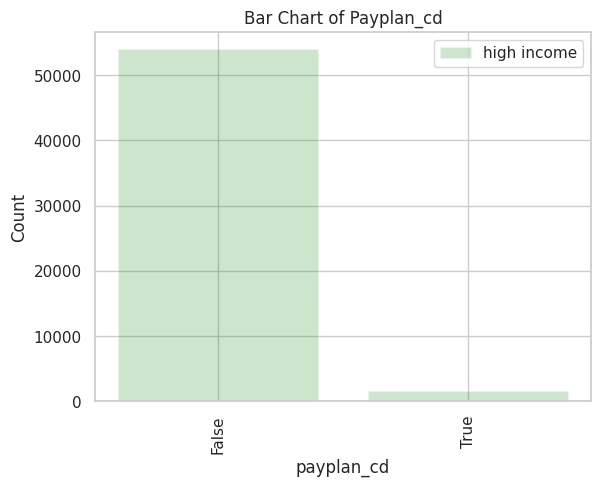

In [54]:
#slide 10 (payplan_cd)

plt.bar(['False', 'True'], payplan_cd_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('payplan_cd')
plt.ylabel('Count')
plt.title('Bar Chart of Payplan_cd')
plt.xticks(rotation=90)
plt.legend()
plt.show()

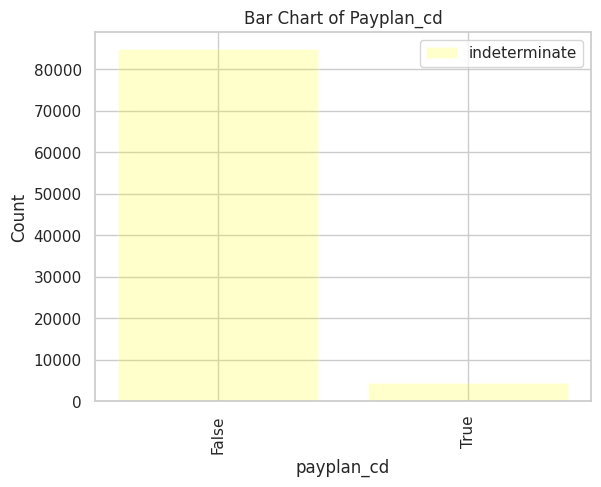

In [55]:
#slide 10 (payplan_cd)

plt.bar(['False', 'True'], payplan_cd_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('payplan_cd')
plt.ylabel('Count')
plt.title('Bar Chart of Payplan_cd')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [56]:
final_non_interval['lang_pref'].value_counts()

ENGLISH           25783
SPANISH           13306
CHIN_CANTONESE     2142
CHIN_MANDARIN      1406
VIETNAMESE          301
KOREAN              176
RUSSIAN              66
JAPANESE             31
FARSI                28
TAGALOG              24
PORTUGUESE           24
ARABIC               20
PUNJABI              17
HINDI                 7
THAI                  4
HMONG                 2
KHMER                 1
Name: lang_pref, dtype: int64

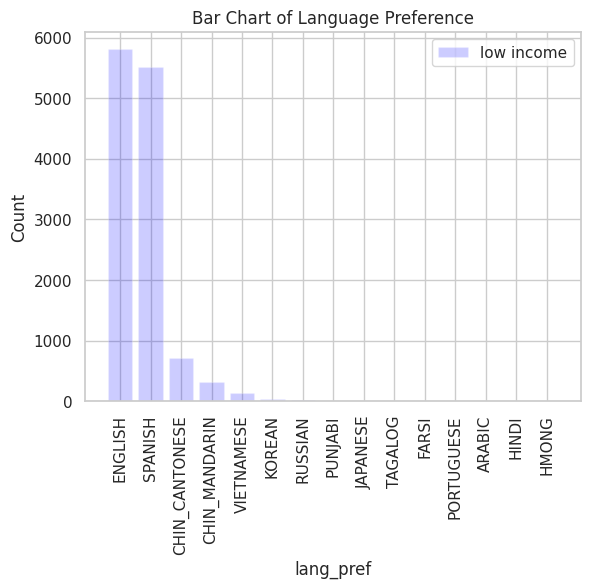

In [57]:
#slide 11 (lang_pref)

lang_pref_counts = x1.groupby('lang_pref').count()
lang_pref_counts = lang_pref_counts.sort_values(by='per_id_proxy', ascending=False)
lang_pref_counts_2 = x2.groupby('lang_pref').count()
lang_pref_counts_3 = x3.groupby('lang_pref').count()
lang_pref_counts_4 = x4.groupby('lang_pref').count()

plt.bar(lang_pref_counts.index, lang_pref_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('lang_pref')
plt.ylabel('Count')
plt.title('Bar Chart of Language Preference')
plt.xticks(rotation=90)
plt.legend()
plt.show()

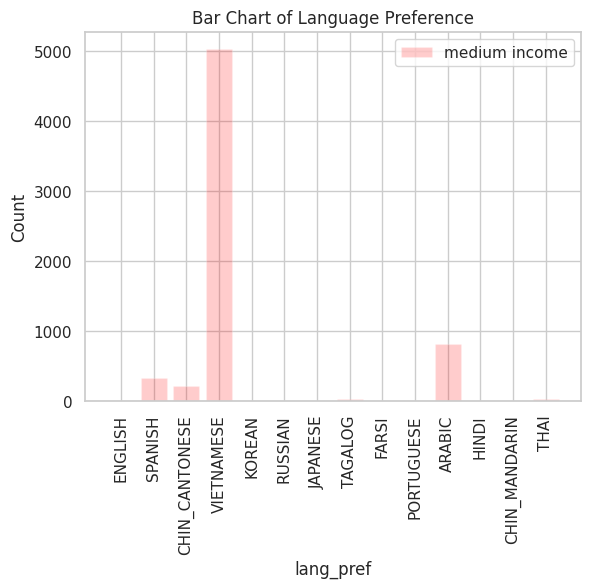

In [58]:
#slide 11 (lang_pref)

plt.bar(lang_pref_counts_2.index, lang_pref_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')
xtick_labels = ['ENGLISH', 'SPANISH', 'CHIN_CANTONESE', 'VIETNAMESE', 'KOREAN', 'RUSSIAN', 'JAPANESE', 'TAGALOG', 'FARSI', 'PORTUGUESE', 'ARABIC', 'HINDI', 'CHIN_MANDARIN', 'THAI']

plt.xlabel('lang_pref')
plt.ylabel('Count')
plt.title('Bar Chart of Language Preference')
plt.xticks(lang_pref_counts_2.index, xtick_labels, rotation=90)
plt.legend()
plt.show()


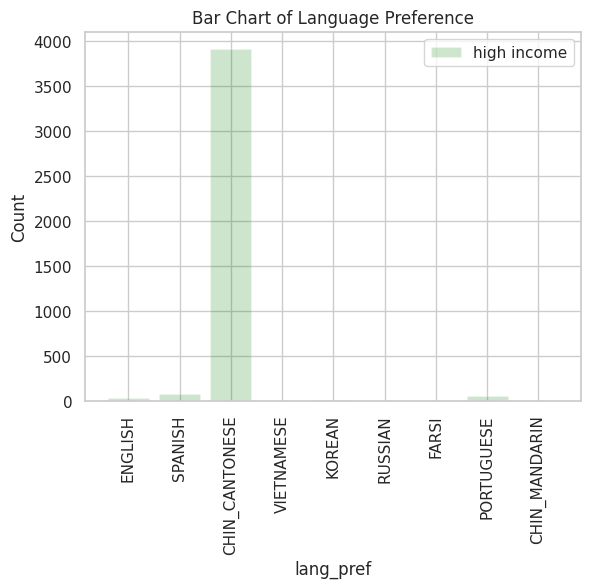

In [59]:
#slide 12 (lang_pref)

plt.bar(lang_pref_counts_3.index, lang_pref_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')
xtick_labels = ['ENGLISH', 'SPANISH', 'CHIN_CANTONESE', 'VIETNAMESE', 'KOREAN', 'RUSSIAN', 'FARSI', 'PORTUGUESE', 'CHIN_MANDARIN']

plt.xlabel('lang_pref')
plt.ylabel('Count')
plt.title('Bar Chart of Language Preference')
plt.xticks(lang_pref_counts_3.index, xtick_labels, rotation=90)
plt.legend()
plt.show()

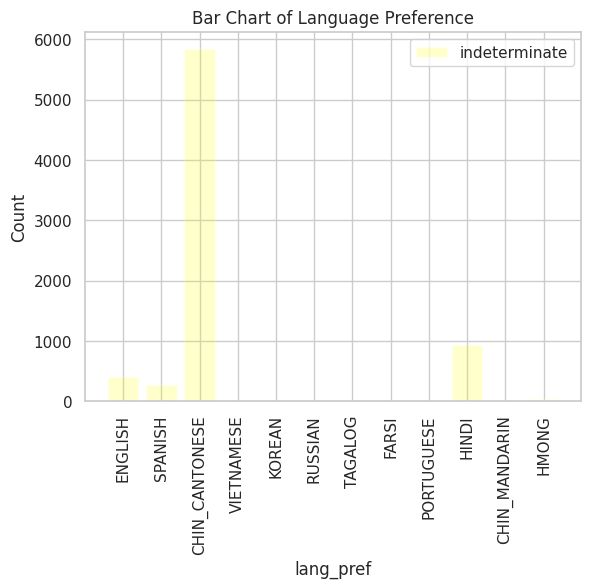

In [60]:
#slide 12 (lang_pref)

plt.bar(lang_pref_counts_4.index, lang_pref_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')
xtick_labels = ['ENGLISH', 'SPANISH', 'CHIN_CANTONESE', 'VIETNAMESE', 'KOREAN', 'RUSSIAN', 'TAGALOG', 'FARSI', 'PORTUGUESE', 'HINDI', 'CHIN_MANDARIN', 'HMONG']

plt.xlabel('lang_pref')
plt.ylabel('Count')
plt.title('Bar Chart of Language Preference')
plt.xticks(lang_pref_counts_4.index, xtick_labels, rotation=90)
plt.legend()
plt.show()

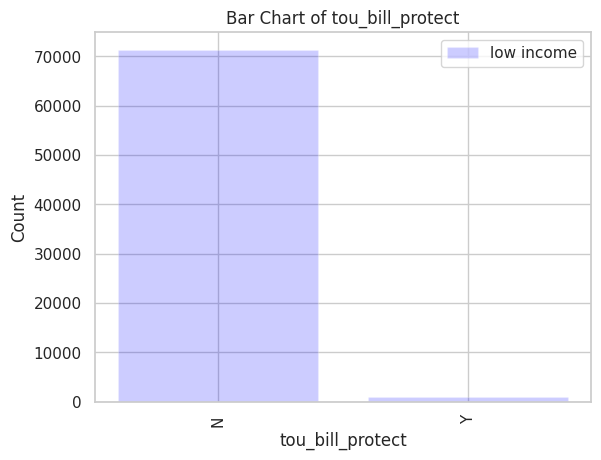

In [61]:
#slide 13 (tou_bill_protect)

tou_bill_protect_counts = x1.groupby('tou_bill_protect').count()
tou_bill_protect_counts_2 = x2.groupby('tou_bill_protect').count()
tou_bill_protect_counts_3 = x3.groupby('tou_bill_protect').count()
tou_bill_protect_counts_4 = x4.groupby('tou_bill_protect').count()

plt.bar(tou_bill_protect_counts.index, tou_bill_protect_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('tou_bill_protect')
plt.ylabel('Count')
plt.title('Bar Chart of tou_bill_protect')
plt.xticks(rotation=90)
plt.legend()
plt.show()


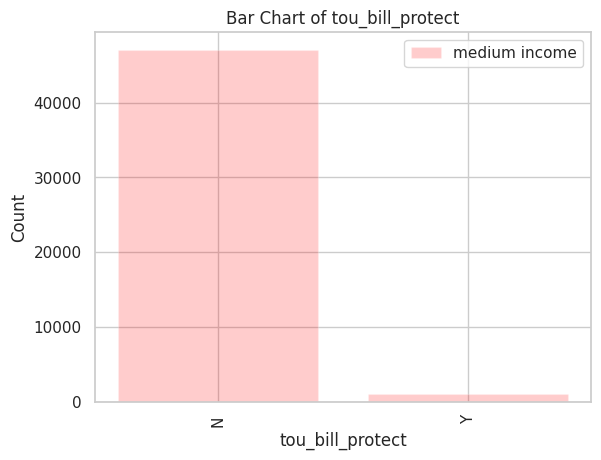

In [62]:
#slide 13 (tou_bill_protect)

plt.bar(tou_bill_protect_counts_2.index, tou_bill_protect_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('tou_bill_protect')
plt.ylabel('Count')
plt.title('Bar Chart of tou_bill_protect')
plt.xticks(rotation=90)
plt.legend()
plt.show()

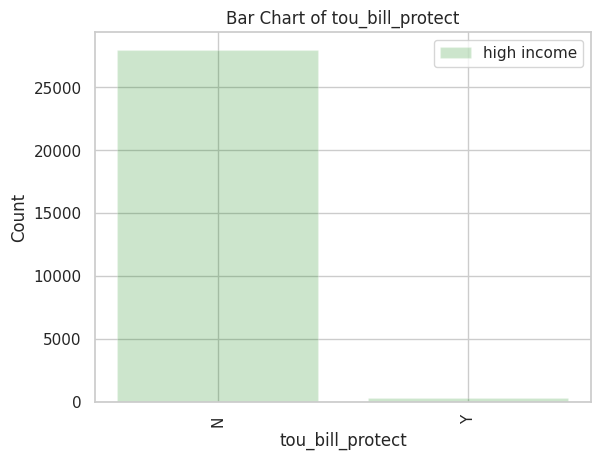

In [63]:
#slide 13 (tou_bill_protect)

plt.bar(tou_bill_protect_counts_3.index, tou_bill_protect_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('tou_bill_protect')
plt.ylabel('Count')
plt.title('Bar Chart of tou_bill_protect')
plt.xticks(rotation=90)
plt.legend()
plt.show()


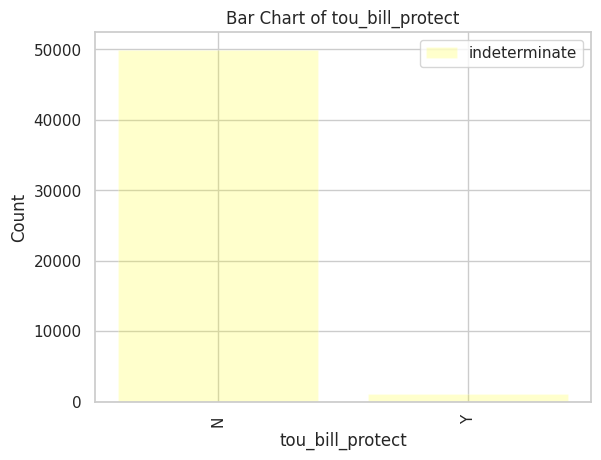

In [64]:
#slide 13 (tou_bill_protect)

plt.bar(tou_bill_protect_counts_4.index, tou_bill_protect_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('tou_bill_protect')
plt.ylabel('Count')
plt.title('Bar Chart of tou_bill_protect')
plt.xticks(rotation=90)
plt.legend()
plt.show()


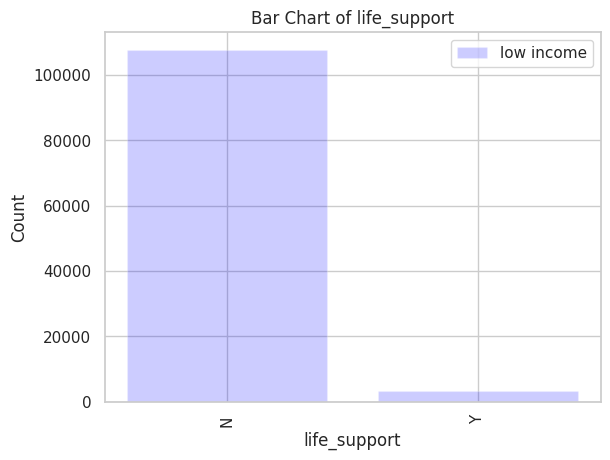

In [65]:
#slide 14 (life_support)

life_support_counts = x1.groupby('life_support').count()
life_support_counts_2 = x2.groupby('life_support').count()
life_support_counts_3 = x3.groupby('life_support').count()
life_support_counts_4 = x4.groupby('life_support').count()

plt.bar(life_support_counts.index, life_support_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('life_support')
plt.ylabel('Count')
plt.title('Bar Chart of life_support')
plt.xticks(rotation=90)
plt.legend()
plt.show()

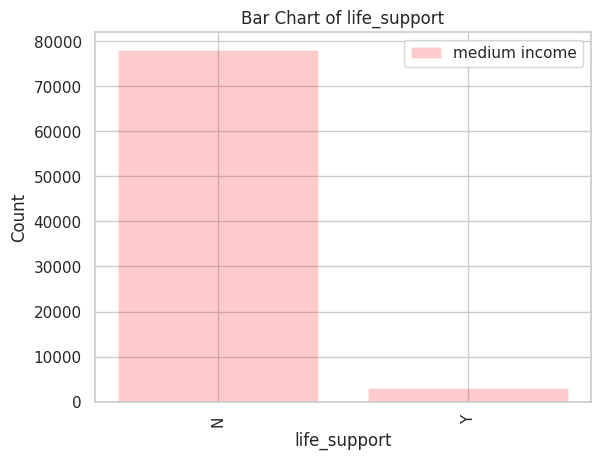

In [66]:
#slide 14 (life_support)

plt.bar(life_support_counts_2.index, life_support_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('life_support')
plt.ylabel('Count')
plt.title('Bar Chart of life_support')
plt.xticks(rotation=90)
plt.legend()
plt.show()


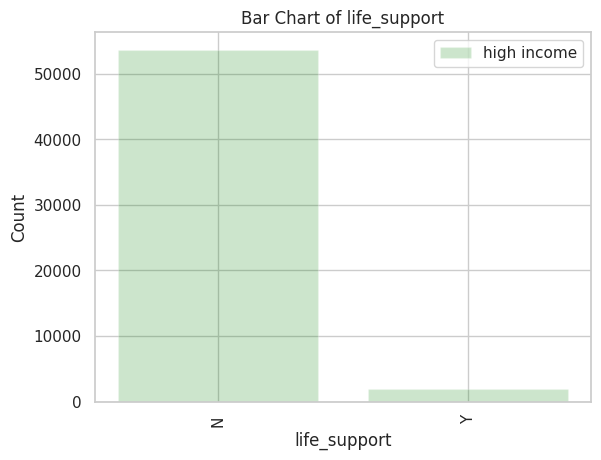

In [67]:
#slide 14 (life_support)

plt.bar(life_support_counts_3.index, life_support_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('life_support')
plt.ylabel('Count')
plt.title('Bar Chart of life_support')
plt.xticks(rotation=90)
plt.legend()
plt.show()


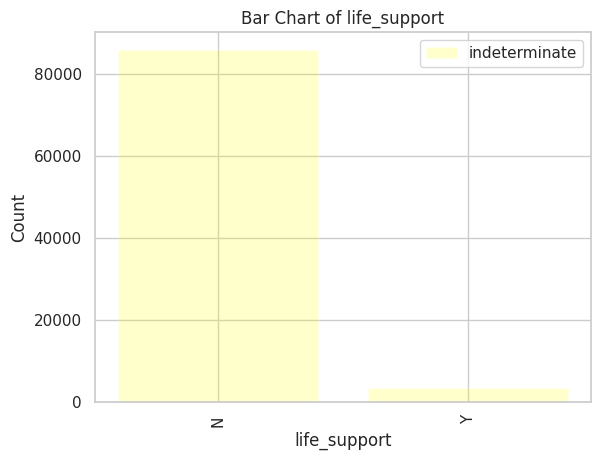

In [68]:
#slide 14 (life_support)

plt.bar(life_support_counts_4.index, life_support_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('life_support')
plt.ylabel('Count')
plt.title('Bar Chart of life_support')
plt.xticks(rotation=90)
plt.legend()
plt.show()


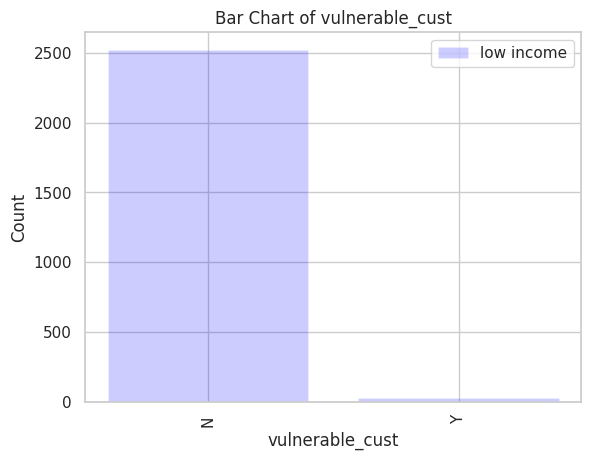

In [69]:
#slide 15 (vulnerable_cust)

vulnerable_cust_counts = x1.groupby('vulnerable_cust').count()
vulnerable_cust_counts_2 = x2.groupby('vulnerable_cust').count()
vulnerable_cust_counts_3 = x3.groupby('vulnerable_cust').count()
vulnerable_cust_counts_4 = x4.groupby('vulnerable_cust').count()

plt.bar(vulnerable_cust_counts.index, vulnerable_cust_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('vulnerable_cust')
plt.ylabel('Count')
plt.title('Bar Chart of vulnerable_cust')
plt.xticks(rotation=90)
plt.legend()
plt.show()


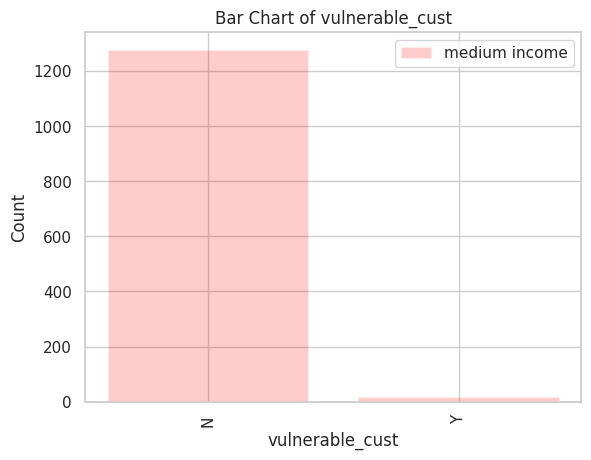

In [70]:
#slide 15 (vulnerable_cust)

plt.bar(vulnerable_cust_counts_2.index, vulnerable_cust_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('vulnerable_cust')
plt.ylabel('Count')
plt.title('Bar Chart of vulnerable_cust')
plt.xticks(rotation=90)
plt.legend()
plt.show()


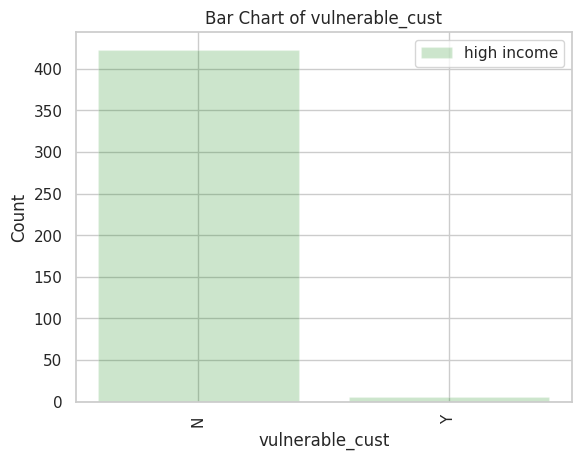

In [71]:
#slide 15 (vulnerable_cust)

plt.bar(vulnerable_cust_counts_3.index, vulnerable_cust_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('vulnerable_cust')
plt.ylabel('Count')
plt.title('Bar Chart of vulnerable_cust')
plt.xticks(rotation=90)
plt.legend()
plt.show()

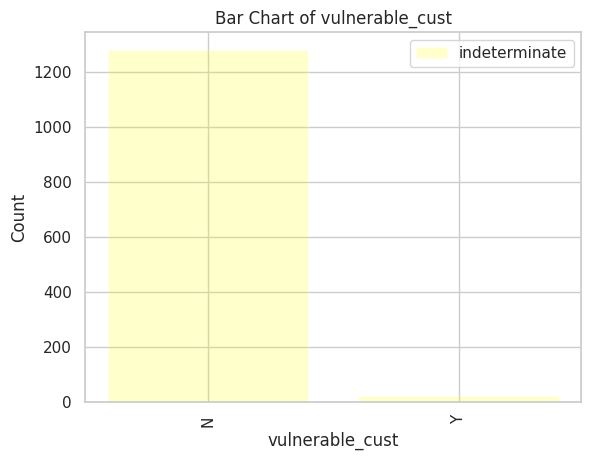

In [72]:
#slide 15 (vulnerable_cust)

plt.bar(vulnerable_cust_counts_4.index, vulnerable_cust_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('vulnerable_cust')
plt.ylabel('Count')
plt.title('Bar Chart of vulnerable_cust')
plt.xticks(rotation=90)
plt.legend()
plt.show()

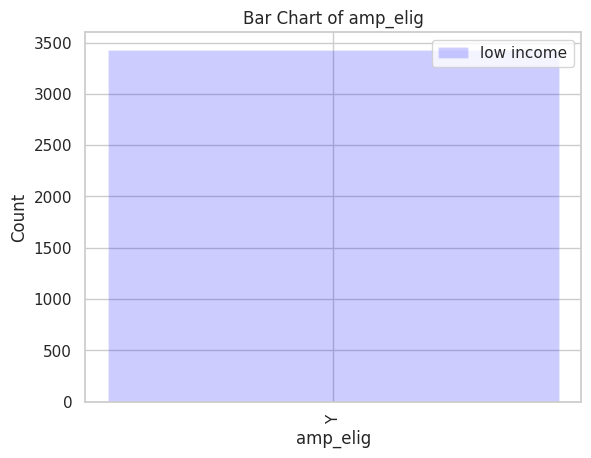

In [73]:
#slide 16 (amp_elig)

amp_elig_counts = x1.groupby('amp_elig').count()
amp_elig_counts_2 = x2.groupby('amp_elig').count()
amp_elig_counts_3 = x3.groupby('amp_elig').count()
amp_elig_counts_4 = x4.groupby('amp_elig').count()

plt.bar(amp_elig_counts.index, amp_elig_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('amp_elig')
plt.ylabel('Count')
plt.title('Bar Chart of amp_elig')
plt.xticks(rotation=90)
plt.legend()
plt.show()

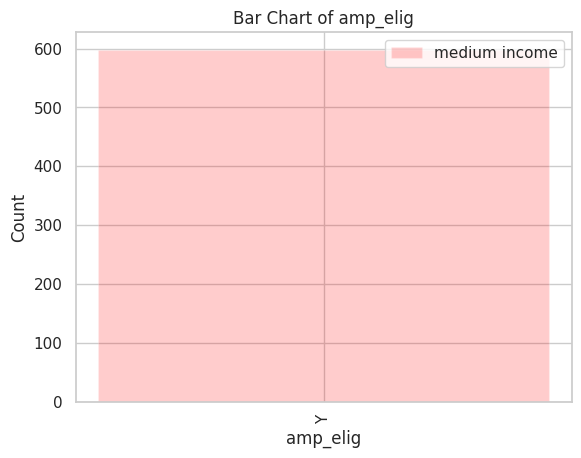

In [74]:
#slide 16 (amp_elig)

plt.bar(amp_elig_counts_2.index, amp_elig_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('amp_elig')
plt.ylabel('Count')
plt.title('Bar Chart of amp_elig')
plt.xticks(rotation=90)
plt.legend()
plt.show()

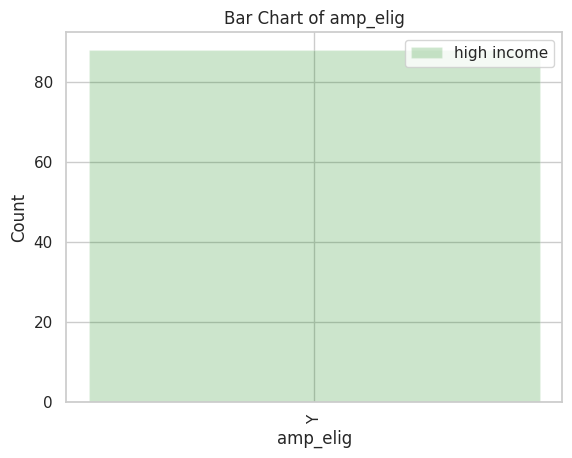

In [75]:
#slide 16 (amp_elig)

plt.bar(amp_elig_counts_3.index, amp_elig_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('amp_elig')
plt.ylabel('Count')
plt.title('Bar Chart of amp_elig')
plt.xticks(rotation=90)
plt.legend()
plt.show()

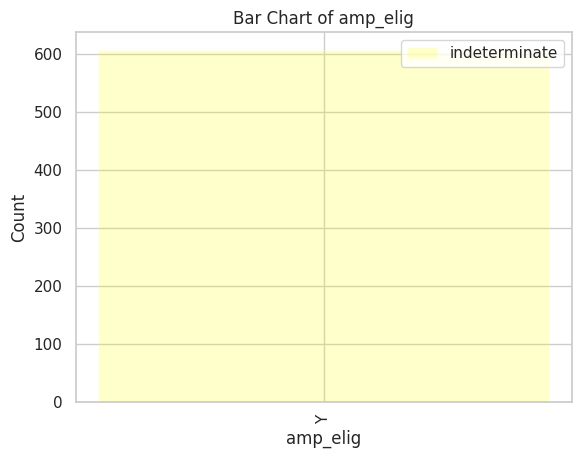

In [76]:
#slide 16 (amp_elig)

plt.bar(amp_elig_counts_4.index, amp_elig_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('amp_elig')
plt.ylabel('Count')
plt.title('Bar Chart of amp_elig')
plt.xticks(rotation=90)
plt.legend()
plt.show()

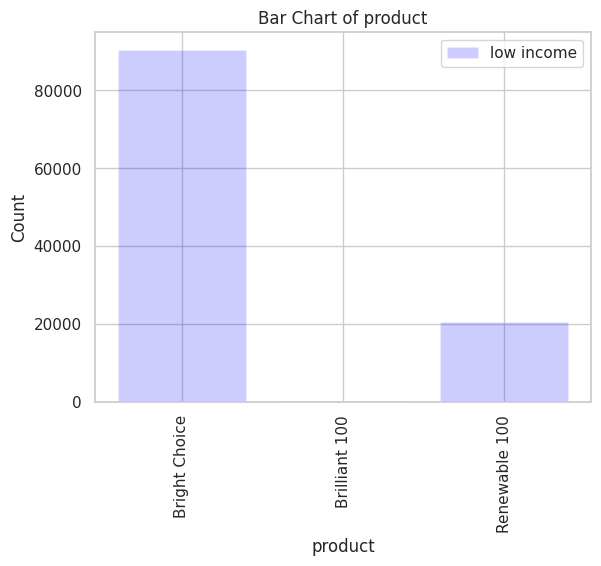

In [77]:
#slide 17 (product)

product_counts = x1.groupby('product').count()
product_counts_2 = x2.groupby('product').count()
product_counts_3 = x3.groupby('product').count()
product_counts_4 = x4.groupby('product').count()

plt.bar(product_counts.index, product_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('product')
plt.ylabel('Count')
plt.title('Bar Chart of product')
plt.xticks(rotation=90)
plt.legend()
plt.show()

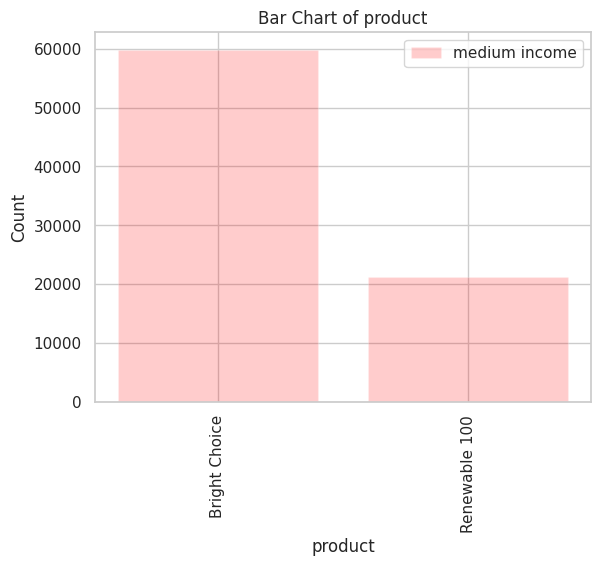

In [78]:
#slide 17 (product)

plt.bar(product_counts_2.index, product_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('product')
plt.ylabel('Count')
plt.title('Bar Chart of product')
plt.xticks(rotation=90)
plt.legend()
plt.show()

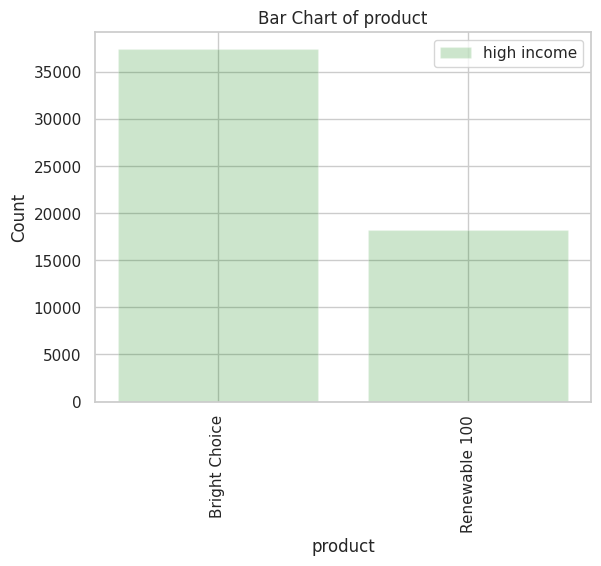

In [79]:
#slide 17 (product)

plt.bar(product_counts_3.index, product_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('product')
plt.ylabel('Count')
plt.title('Bar Chart of product')
plt.xticks(rotation=90)
plt.legend()
plt.show()

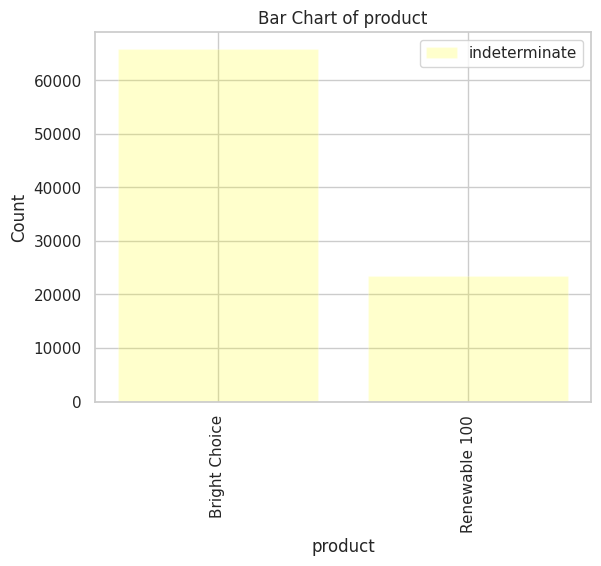

In [80]:
#slide 17 (product)

plt.bar(product_counts_4.index, product_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('product')
plt.ylabel('Count')
plt.title('Bar Chart of product')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [81]:
final_non_interval['nem'].value_counts()

No     428084
Yes     50117
NA          4
Name: nem, dtype: int64

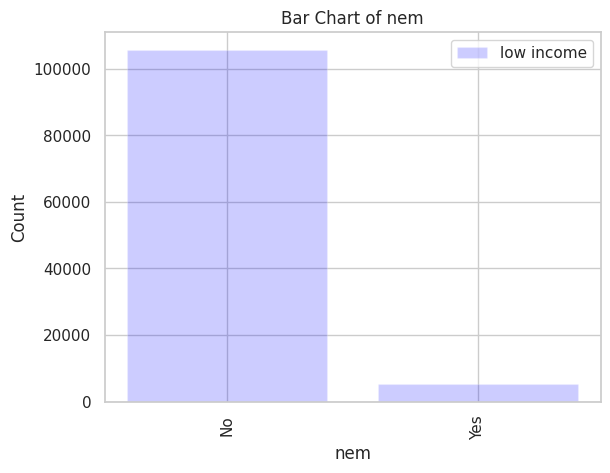

In [82]:
#slide 19 (nem)

nem_counts = x1.groupby('nem').count()
nem_counts_2 = x2.groupby('nem').count()
nem_counts_3 = x3.groupby('nem').count()
nem_counts_4 = x4.groupby('nem').count()

plt.bar(nem_counts.index, nem_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('nem')
plt.ylabel('Count')
plt.title('Bar Chart of nem')
plt.xticks(rotation=90)
plt.legend()
plt.show()

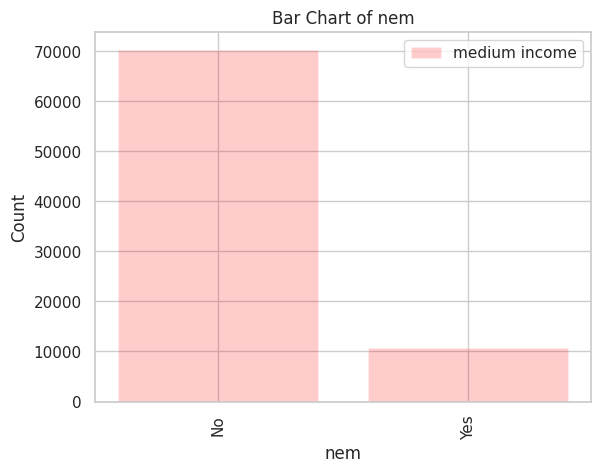

In [83]:
#slide 19 (nem)

plt.bar(nem_counts_2.index, nem_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('nem')
plt.ylabel('Count')
plt.title('Bar Chart of nem')
plt.xticks(rotation=90)
plt.legend()
plt.show()

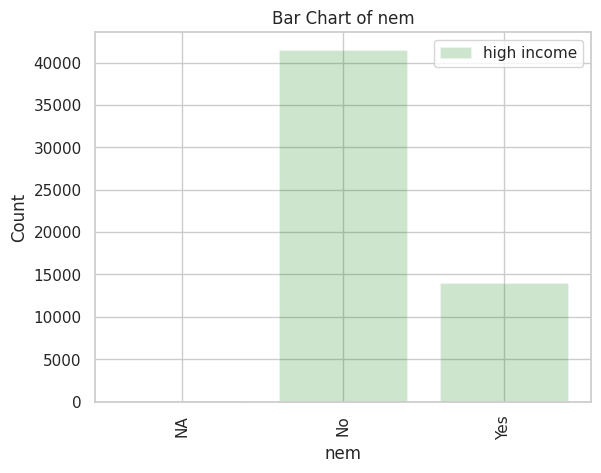

In [84]:
#slide 19 (nem)

plt.bar(nem_counts_3.index, nem_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('nem')
plt.ylabel('Count')
plt.title('Bar Chart of nem')
plt.xticks(rotation=90)
plt.legend()
plt.show()

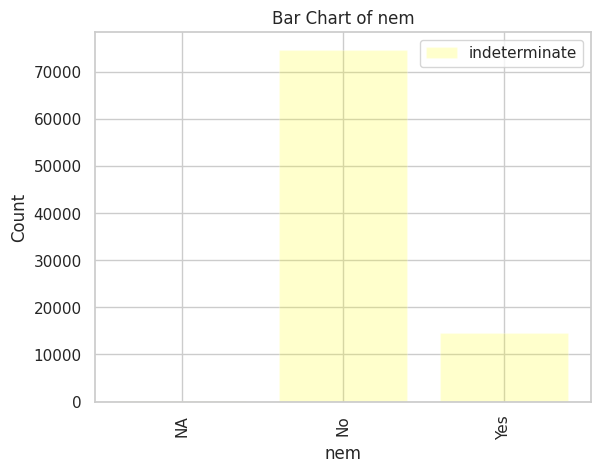

In [85]:
#slide 19 (nem)

plt.bar(nem_counts_4.index, nem_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('nem')
plt.ylabel('Count')
plt.title('Bar Chart of nem')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [86]:
final_non_interval['ebce_summary_rate'].value_counts()

RES TOU        297026
RES            131011
RES TOU NEM     44486
RES NEM          5624
A1 TOU             37
A1 TOU NEM          7
LS                  6
NO_RATE             4
AGR                 2
A1                  1
E19                 1
Name: ebce_summary_rate, dtype: int64

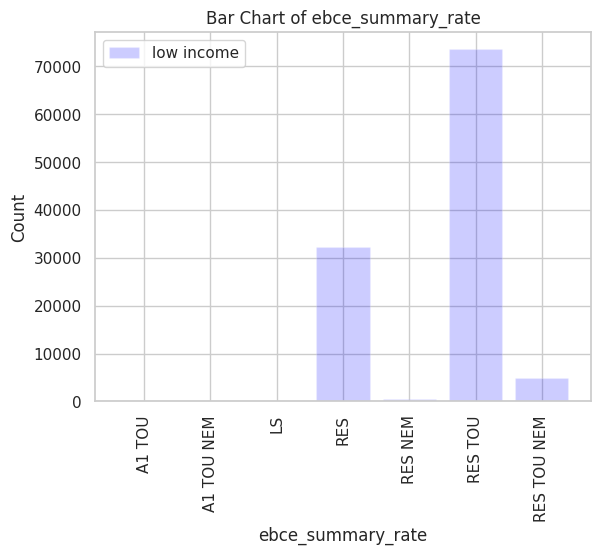

In [87]:
#slide 20 (ebce_summary_rate)

ebce_summary_rate_counts = x1.groupby('ebce_summary_rate').count()
ebce_summary_rate_counts_2 = x2.groupby('ebce_summary_rate').count()
ebce_summary_rate_counts_3 = x3.groupby('ebce_summary_rate').count()
ebce_summary_rate_counts_4 = x4.groupby('ebce_summary_rate').count()

plt.bar(ebce_summary_rate_counts.index, ebce_summary_rate_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('ebce_summary_rate')
plt.ylabel('Count')
plt.title('Bar Chart of ebce_summary_rate')
plt.xticks(rotation=90)
plt.legend()
plt.show()

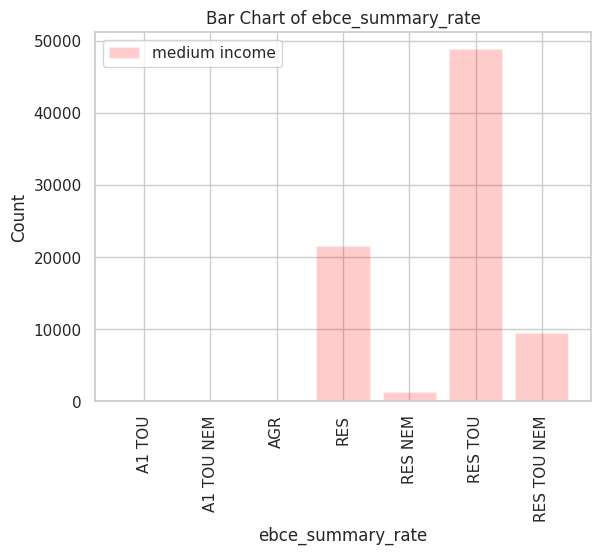

In [88]:
#slide 20 (ebce_summary_rate)

plt.bar(ebce_summary_rate_counts_2.index, ebce_summary_rate_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('ebce_summary_rate')
plt.ylabel('Count')
plt.title('Bar Chart of ebce_summary_rate')
plt.xticks(rotation=90)
plt.legend()
plt.show()


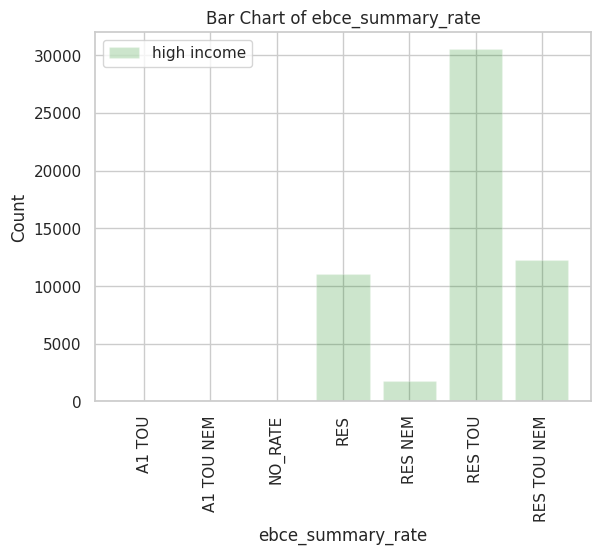

In [89]:
#slide 20 (ebce_summary_rate)

plt.bar(ebce_summary_rate_counts_3.index, ebce_summary_rate_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('ebce_summary_rate')
plt.ylabel('Count')
plt.title('Bar Chart of ebce_summary_rate')
plt.xticks(rotation=90)
plt.legend()
plt.show()

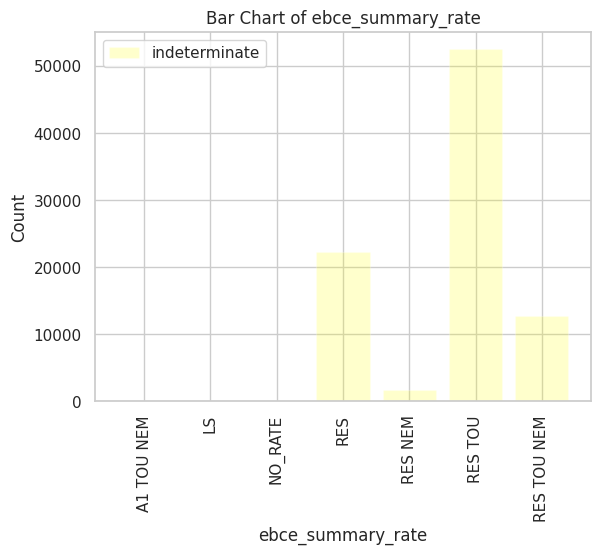

In [90]:
#slide 20 (ebce_summary_rate)

plt.bar(ebce_summary_rate_counts_4.index, ebce_summary_rate_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('ebce_summary_rate')
plt.ylabel('Count')
plt.title('Bar Chart of ebce_summary_rate')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [91]:
final_non_interval['voltage_level'].value_counts()

S    478194
P        11
Name: voltage_level, dtype: int64

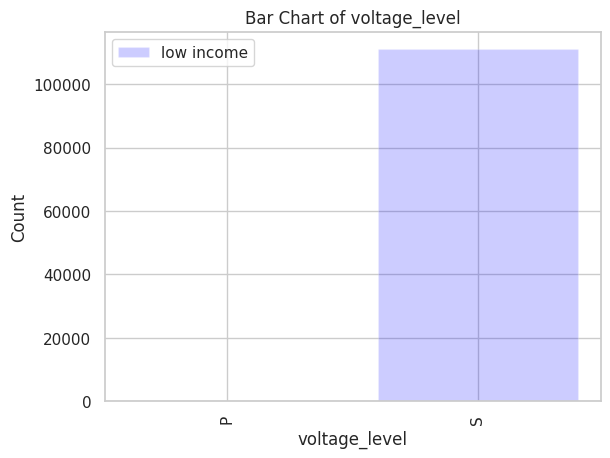

In [92]:
#slide 21 (voltage_level)

voltage_level_counts = x1.groupby('voltage_level').count()
voltage_level_counts_2 = x2.groupby('voltage_level').count()
voltage_level_counts_3 = x3.groupby('voltage_level').count()
voltage_level_counts_4 = x4.groupby('voltage_level').count()

plt.bar(voltage_level_counts.index, voltage_level_counts['per_id_proxy'], color='blue', alpha = 0.2, label = 'low income')

plt.xlabel('voltage_level')
plt.ylabel('Count')
plt.title('Bar Chart of voltage_level')
plt.xticks(rotation=90)
plt.legend()
plt.show()

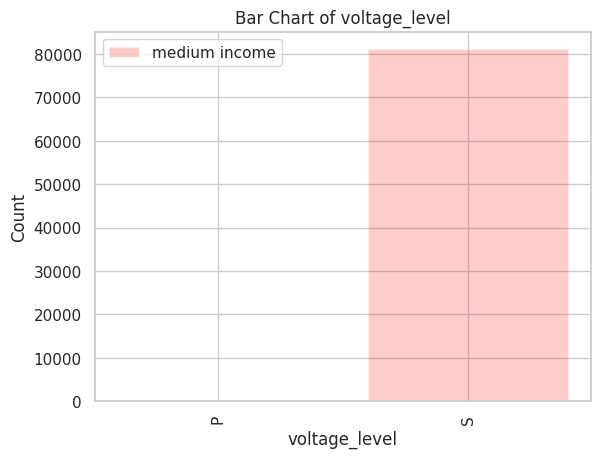

In [93]:
#slide 21 (voltage_level)

plt.bar(voltage_level_counts_2.index, voltage_level_counts_2['per_id_proxy'], color='red', alpha = 0.2, label = 'medium income')

plt.xlabel('voltage_level')
plt.ylabel('Count')
plt.title('Bar Chart of voltage_level')
plt.xticks(rotation=90)
plt.legend()
plt.show()

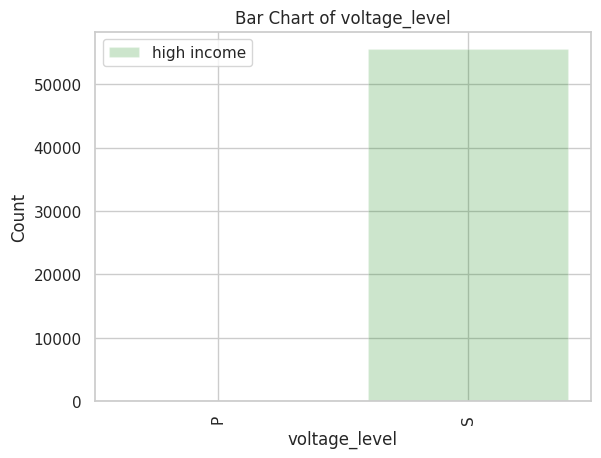

In [94]:
#slide 21 (voltage_level)

plt.bar(voltage_level_counts_3.index, voltage_level_counts_3['per_id_proxy'], color='green', alpha = 0.2, label = 'high income')

plt.xlabel('voltage_level')
plt.ylabel('Count')
plt.title('Bar Chart of voltage_level')
plt.xticks(rotation=90)
plt.legend()
plt.show()

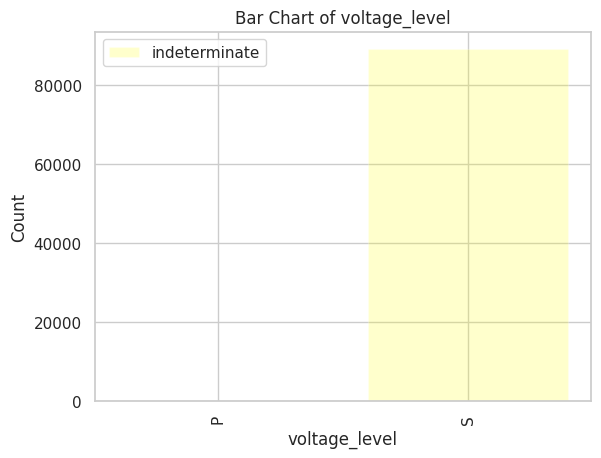

In [95]:
#slide 21 (voltage_level)

plt.bar(voltage_level_counts_4.index, voltage_level_counts_4['per_id_proxy'], color='yellow', alpha = 0.2, label = 'indeterminate')

plt.xlabel('voltage_level')
plt.ylabel('Count')
plt.title('Bar Chart of voltage_level')
plt.xticks(rotation=90)
plt.legend()
plt.show()

This part of the notebook constructs visualizations for participation scores and other variables in the aging_reports_processed_proxy category. It includes only data where the arrears are > 0.

In [96]:
project_id = 'berkeley-data-discovery-2023'
final_non_interval = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)

In [97]:
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.outputs.FINAL_SOCIAL_DEMOGRAPHICS`
'''
project_id = 'berkeley-data-discovery-2023'
dfg = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)
dfg.head()

,per_id_proxy,income_range,p_city,care,fera,nem,avg_arrears,avg_monthly_kwh,max_monthly_kwh,avg_month_bill,max_month_bill,num_vehicles_owner_total,TotalNetValue,ces_score,opportunity_flag
0,2082,high income,SUNOL,False,None,No,88.269610,785.195194,1575.0000,87.406863,239.51,1,NaN,6.12,High Resource
1,2112,None,SUNOL,False,None,No,2.929220,702.983473,1301.9604,78.671765,172.71,4,773636.0,6.56,High Resource
2,2730,None,Dublin,False,None,No,9.352710,412.676471,595.0000,51.529412,82.43,0,616198.0,11.58,Highest Resource
3,5504,None,SUNOL,False,None,No,4.207366,734.058824,1383.0000,81.862549,169.71,1,792373.0,6.56,High Resource
4,6228,indeterminate,Dublin,False,None,No,0.000000,212.305486,375.0000,22.754706,35.01,2,0.0,11.58,Highest Resource


In [98]:
final_arrears = final_non_interval[['avg_arrears_0_30', 'avg_arrears_31_60', 'avg_arrears_61_90',
       'avg_arrears_91_120', 'avg_arrears_120', 'participation_score_0_30',
       'participation_score_31_60', 'participation_score_61_90',
       'participation_score_91_120', 'participation_score_120']]
final_arrears 


,avg_arrears_0_30,avg_arrears_31_60,avg_arrears_61_90,avg_arrears_91_120,avg_arrears_120,participation_score_0_30,participation_score_31_60,participation_score_61_90,participation_score_91_120,participation_score_120
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1.428537,0.000000,0.000000,0.000000,0.000000,0.048780,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,6.205366,0.321951,0.461220,0.000000,0.000000,0.341463,0.073171,0.048780,0.000000,0.000000
4,2.249286,0.000000,0.000000,0.000000,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
478200,38.610488,30.109512,17.418780,12.237561,6.546585,0.560976,0.512195,0.317073,0.243902,0.146341
478201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
478202,4.320732,0.880488,0.000000,0.000000,0.000000,0.487805,0.365854,0.000000,0.000000,0.000000
478203,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [99]:
final_non_interval[final_non_interval['avg_arrears_0_30'] > 0]

,per_id_proxy,income_range,p_city,p_zip,cur_esp,enduse,care,fera,medallot,payplan_cd,...,BuildingArea,LotSize,Stories,Rooms,Beds,Baths,ces_score,dac_flag,low_income_flag,opportunity_flag
1,2,low income,OAKLAND,94605,EBCE,B,True,None,<NA>,False,...,1146.000000,4429.0,1.0,6.0,3.0,1.0,21.77,False,True,Low Resource
3,4,middle income,HAYWARD,94541,EBCE,B,True,None,<NA>,True,...,1663.000000,5250.0,1.0,7.0,3.0,2.5,32.15,False,False,Low Resource
4,5,indeterminate,DUBLIN,94568,EBCE,B,False,None,<NA>,False,...,1638.000000,6600.0,1.0,7.0,3.0,2.0,16.65,False,False,High Resource
5,6,low income,OAKLAND,94621,EBCE,M,False,None,1,False,...,1320.000000,3500.0,1.0,4.0,2.0,1.0,52.21,True,True,Low Resource
6,7,indeterminate,LIVERMORE,94551,EBCE,B,False,None,<NA>,True,...,1182.000000,1391.0,2.0,5.0,3.0,1.5,13.26,False,False,Moderate Resource
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478198,478199,None,OAKLAND,94611,EBCE,B,False,None,<NA>,False,...,710.000000,1718.0,2.0,4.0,1.0,1.0,6.27,False,False,Highest Resource
478199,478200,low income,HAYWARD,94544,EBCE,B,False,None,<NA>,False,...,NaN,NaN,NaN,NaN,NaN,NaN,28.51,True,True,Low Resource
478200,478201,low income,HAYWARD,94541,EBCE,M,True,None,1,False,...,1196.000000,6600.0,1.0,5.0,3.0,1.5,36.65,False,True,Low Resource
478202,478203,low income,OAKLAND,94601,EBCE,B,True,None,<NA>,False,...,770.000000,1750.0,1.0,4.0,1.0,1.0,35.42,False,True,Low Resource


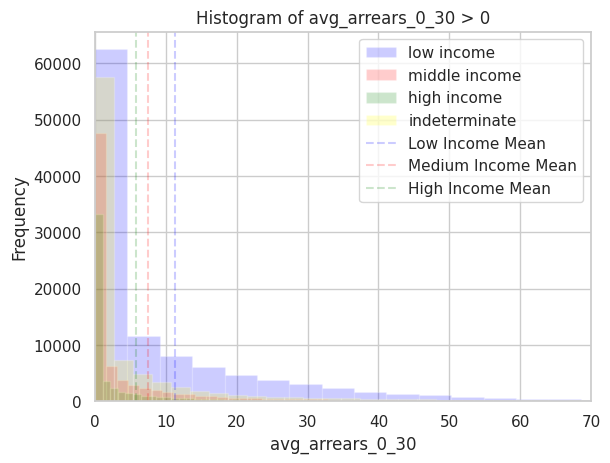

Low income mean: 11.314449066137467
Low income median: 2.7433739837398377
Low income std. dev: 34.00527004462926
Medium income mean: 7.477270863843648
Medium income median: 0.6708581752484188
Medium income std. dev: 22.689998946146755
High income mean: 5.747070771111449
High income median: 0.1765
High income std. dev: 16.143483777618165


In [100]:
#slide 25 (Avg_arrears_0_30 > 0)
filtered = final_non_interval[final_non_interval['avg_arrears_0_30'] >= 0]
x1 = list(filtered[filtered['income_range'] == "low income"]['avg_arrears_0_30'])
x2 = list(filtered[filtered['income_range'] == "middle income"]['avg_arrears_0_30'])
x3 = list(filtered[filtered['income_range'] == "high income"]['avg_arrears_0_30'])
x4 = list(filtered[filtered['income_range'] == "indeterminate"]['avg_arrears_0_30'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_0_30')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_0_30 > 0')
plt.xlim(0, 70)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

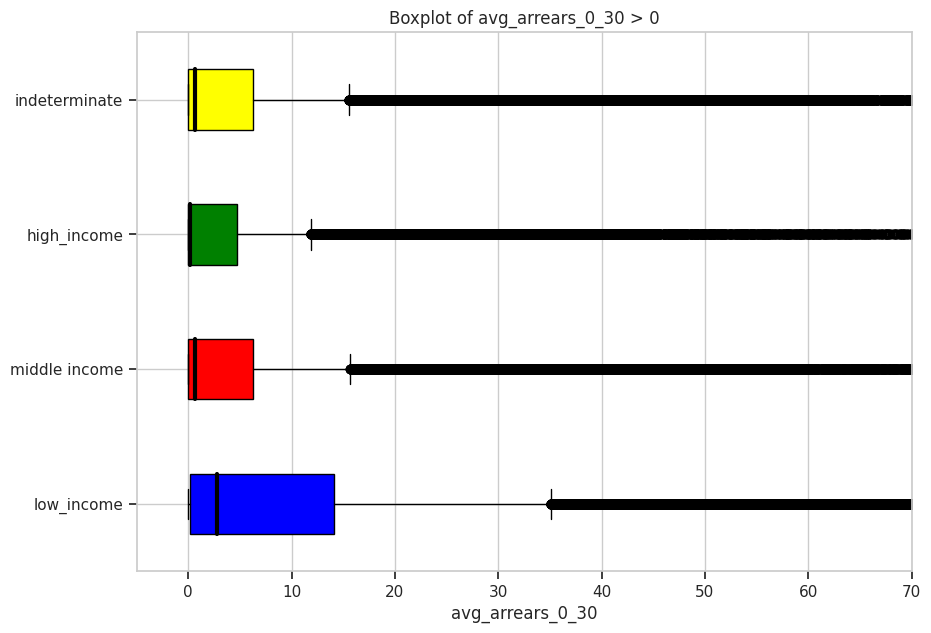

Low income coefficient of variation: 0.33272634069037343
Medium income coefficient of variation: 0.21988564872533914
High income coefficient of variation: 0.16900529722507326


In [101]:
#slide 25 (Avg_arrears_0_30 > 0)
x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_0_30')
# Adding title
plt.title("Boxplot of avg_arrears_0_30 > 0")
plt.xlim(-5, 70)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

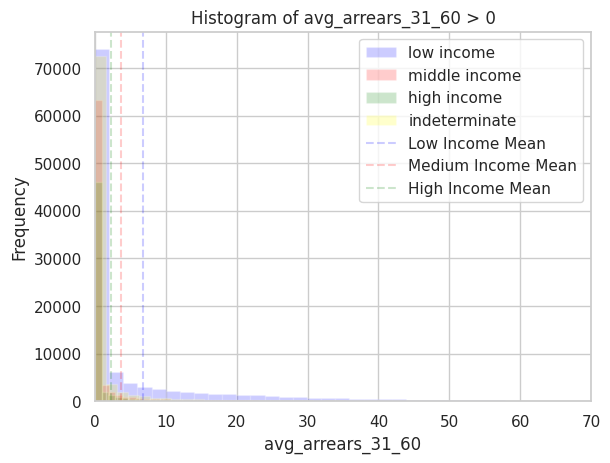

Low income mean: 6.8266309966410805
Low income median: 0.02804878048780488
Low income std. dev: 22.023456721177492
Medium income mean: 3.704617651922327
Medium income median: 0.0
Medium income std. dev: 16.001527588193404
High income mean: 2.306984986486692
High income median: 0.0
High income std. dev: 11.777810403185219


In [102]:
#slide 27 (Avg_arrears_31_60 > 0)
filtered = final_non_interval[final_non_interval['avg_arrears_31_60'] >= 0]
x1 = list(filtered[filtered['income_range'] == "low income"]['avg_arrears_31_60'])
x2 = list(filtered[filtered['income_range'] == "middle income"]['avg_arrears_31_60'])
x3 = list(filtered[filtered['income_range'] == "high income"]['avg_arrears_31_60'])
x4 = list(filtered[filtered['income_range'] == "indeterminate"]['avg_arrears_31_60'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_31_60')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_31_60 > 0')
plt.xlim(0, 70)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

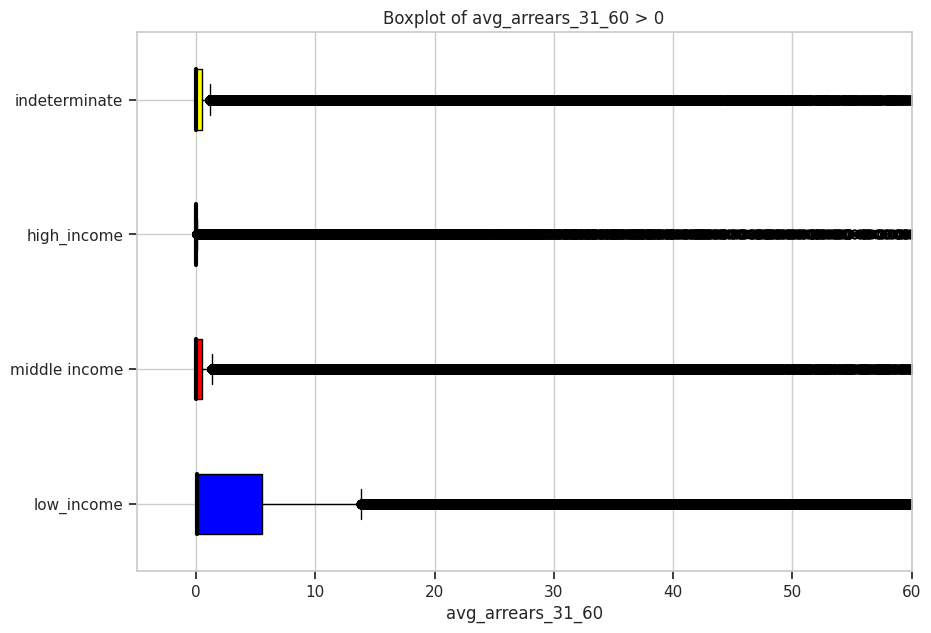

Low income coefficient of variation: 0.3099709134250789
Medium income coefficient of variation: 0.16821236097601386
High income coefficient of variation: 0.10475126660150141


In [103]:
#slide 27 (Avg_arrears_31_60 > 0)
x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_31_60')
# Adding title
plt.title("Boxplot of avg_arrears_31_60 > 0")
plt.xlim(-5, 60)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

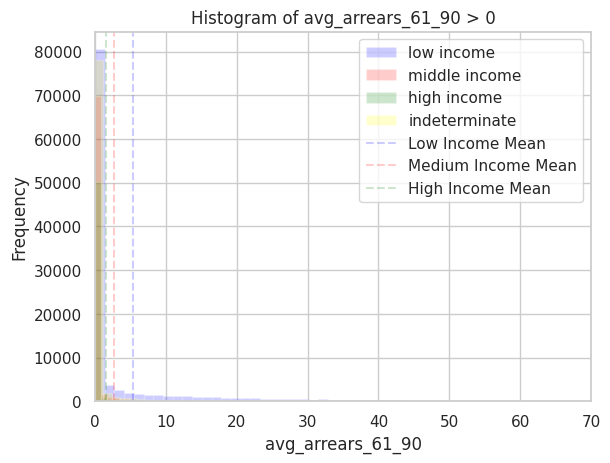

Low income mean: 5.336199332912099
Low income median: 0.0
Low income std. dev: 19.572051133027283
Medium income mean: 2.6352139481636687
Medium income median: 0.0
Medium income std. dev: 13.663741677657445
High income mean: 1.501598615380781
High income median: 0.0
High income std. dev: 10.080952913554514


In [104]:
#slide 29 (Avg_arrears_61_90 > 0)

filtered = final_non_interval[final_non_interval['avg_arrears_61_90'] >= 0]
x1 = list(filtered[filtered['income_range'] == "low income"]['avg_arrears_61_90'])
x2 = list(filtered[filtered['income_range'] == "middle income"]['avg_arrears_61_90'])
x3 = list(filtered[filtered['income_range'] == "high income"]['avg_arrears_61_90'])
x4 = list(filtered[filtered['income_range'] == "indeterminate"]['avg_arrears_61_90'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_61_90')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_61_90 > 0')
plt.xlim(0, 70)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

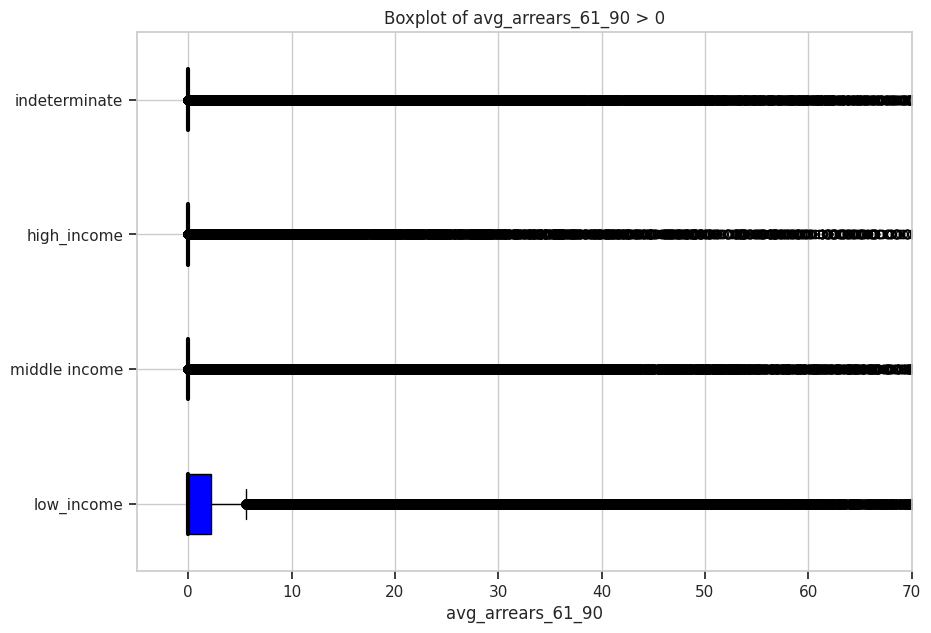

Low income coefficient of variation: 0.2726438479361733
Medium income coefficient of variation: 0.1346416852404815
High income coefficient of variation: 0.0767215763526632


In [105]:
#slide 29 (Avg_arrears_61_90 > 0)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_61_90')
# Adding title
plt.title("Boxplot of avg_arrears_61_90 > 0")
plt.xlim(-5, 70)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

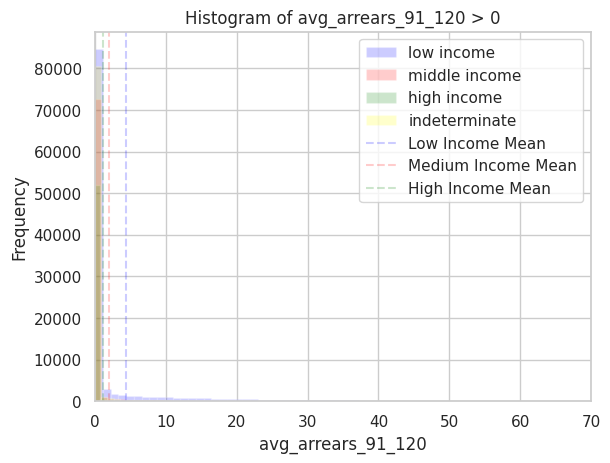

Low income mean: 4.380299360700986
Low income median: 0.0
Low income std. dev: 16.942006523635033
Medium income mean: 2.0399320408761503
Medium income median: 0.0
Medium income std. dev: 11.833759127117121
High income mean: 1.109741689401447
High income median: 0.0
High income std. dev: 8.743025098371035


In [106]:
#slide 31 (Avg_arrears_91_120 > 0)

filtered = final_non_interval[final_non_interval['avg_arrears_91_120'] >= 0]
x1 = list(filtered[filtered['income_range'] == "low income"]['avg_arrears_91_120'])
x2 = list(filtered[filtered['income_range'] == "middle income"]['avg_arrears_91_120'])
x3 = list(filtered[filtered['income_range'] == "high income"]['avg_arrears_91_120'])
x4 = list(filtered[filtered['income_range'] == "indeterminate"]['avg_arrears_91_120'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_91_120')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_91_120 > 0')
plt.xlim(0, 70)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

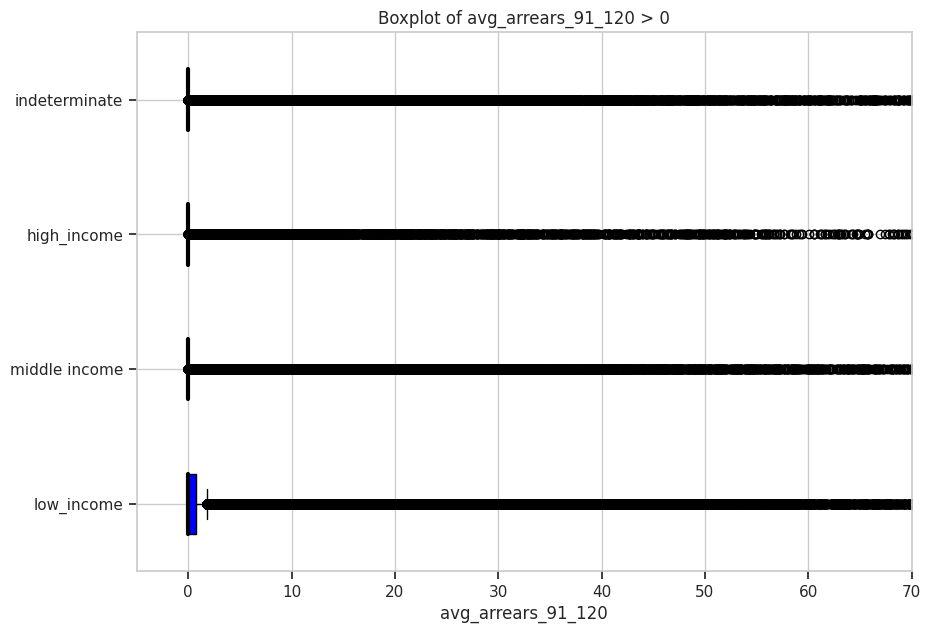

Low income coefficient of variation: 0.25854666946268895
Medium income coefficient of variation: 0.12040675571871211
High income coefficient of variation: 0.06550237646605177


In [107]:
#slide 31 (Avg_arrears_91_120 > 0)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_91_120')
# Adding title
plt.title("Boxplot of avg_arrears_91_120 > 0")
plt.xlim(-5, 70)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

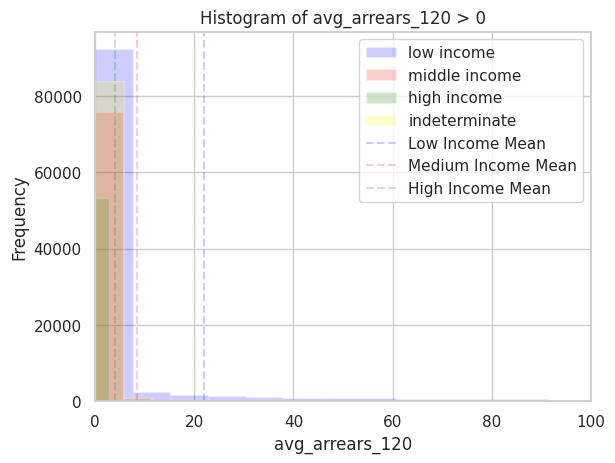

Low income mean: 21.942420567764792
Low income median: 0.0
Low income std. dev: 100.49633698707144
Medium income mean: 8.376638123545947
Medium income median: 0.0
Medium income std. dev: 68.13744790059974
High income mean: 4.023448657933438
High income median: 0.0
High income std. dev: 45.46418108688235


In [108]:
#slide 33 (Avg_arrears_120 > 0)

filtered = final_non_interval[final_non_interval['avg_arrears_120'] >= 0]
x1 = list(filtered[filtered['income_range'] == "low income"]['avg_arrears_120'])
x2 = list(filtered[filtered['income_range'] == "middle income"]['avg_arrears_120'])
x3 = list(filtered[filtered['income_range'] == "high income"]['avg_arrears_120'])
x4 = list(filtered[filtered['income_range'] == "indeterminate"]['avg_arrears_120'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears_120')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears_120 > 0')
plt.xlim(0, 100)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

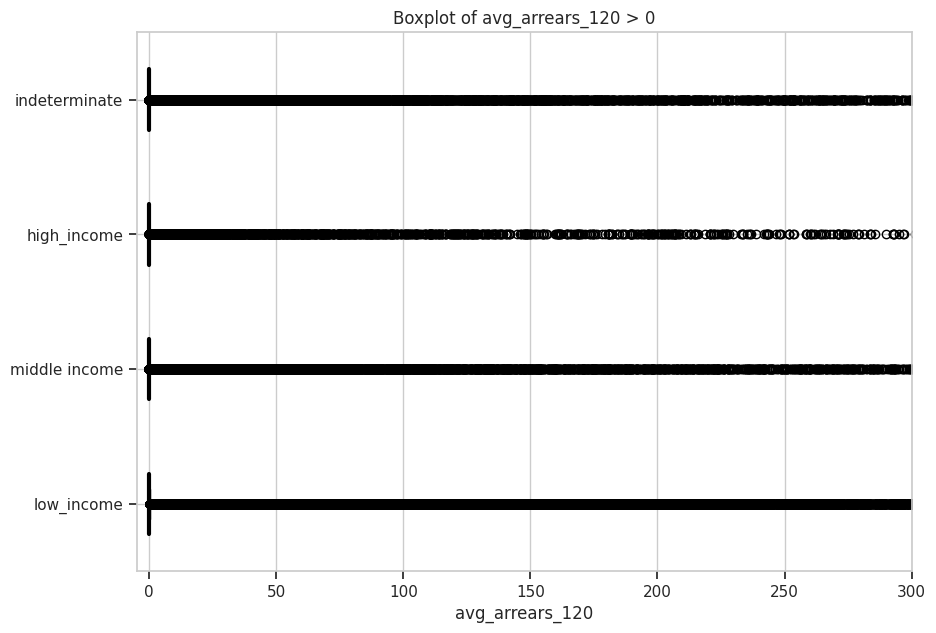

Low income coefficient of variation: 0.2183405010133615
Medium income coefficient of variation: 0.0833526710990827
High income coefficient of variation: 0.04003577422380124


In [109]:
#slide 33 (Avg_arrears_120 > 0)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears_120')
# Adding title
plt.title("Boxplot of avg_arrears_120 > 0")
plt.xlim(-5, 300)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

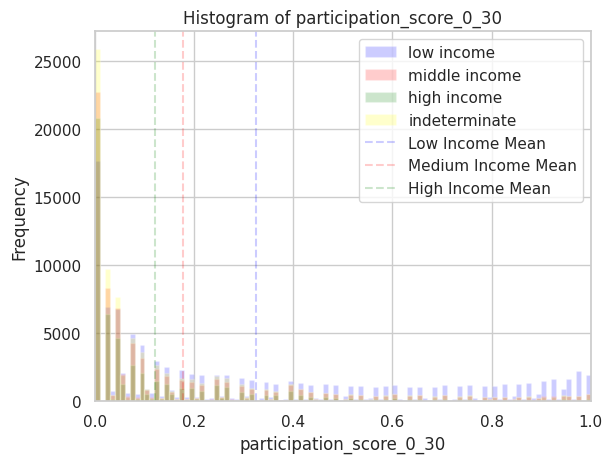

Low income mean: 0.32398394892604565
Low income median: 0.19512195121951217
Low income std. dev: 0.32788077011148936
Medium income mean: 0.17855281907358656
Medium income median: 0.06666666666666668
Medium income std. dev: 0.24848995092344628
High income mean: 0.12143372717438539
High income median: 0.048780487804878044
High income std. dev: 0.19343867874679951


In [110]:
#slide 35 (participation_score_0_30)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['participation_score_0_30'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['participation_score_0_30'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['participation_score_0_30'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['participation_score_0_30'])

plt.hist(x1, bins = 100, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 100, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 100, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 100, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('participation_score_0_30')
plt.ylabel('Frequency')
plt.title('Histogram of participation_score_0_30')
plt.xlim(0, 1)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

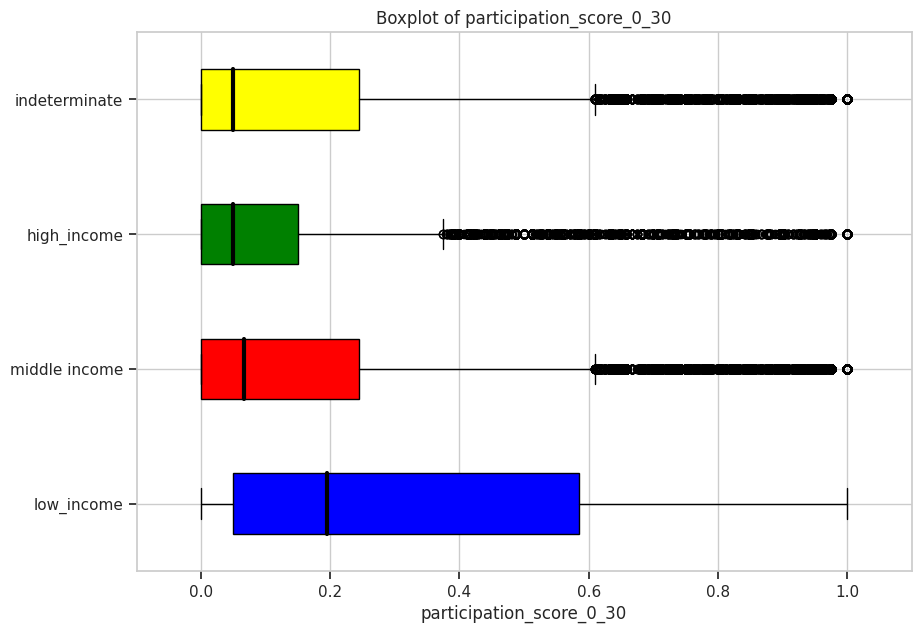

Low income coefficient of variation: 0.9881151273857308
Medium income coefficient of variation: 0.5445663038209689
High income coefficient of variation: 0.37035940574707776


In [111]:
#slide 35 (participation_score_0_30)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('participation_score_0_30')
# Adding title
plt.title("Boxplot of participation_score_0_30")
plt.xlim(-0.1, 1.1)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

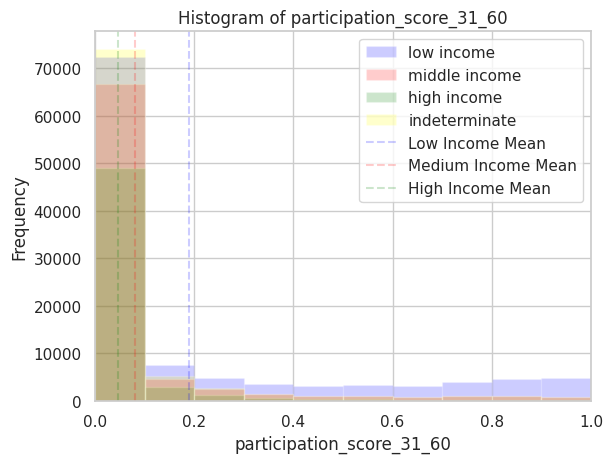

Low income mean: 0.19018628133789472
Low income median: 0.024390243902439022
Low income std. dev: 0.2959786484404493
Medium income mean: 0.08006718487574105
Medium income median: 0.0
Medium income std. dev: 0.1918021624300229
High income mean: 0.04584357844456701
High income median: 0.0
High income std. dev: 0.13259037872466745


In [112]:
#slide 36 (participation_score_31_60)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['participation_score_31_60'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['participation_score_31_60'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['participation_score_31_60'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['participation_score_31_60'])

plt.hist(x1, bins = 10, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 10, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 10, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 10, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('participation_score_31_60')
plt.ylabel('Frequency')
plt.title('Histogram of participation_score_31_60')
plt.xlim(0, 1)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

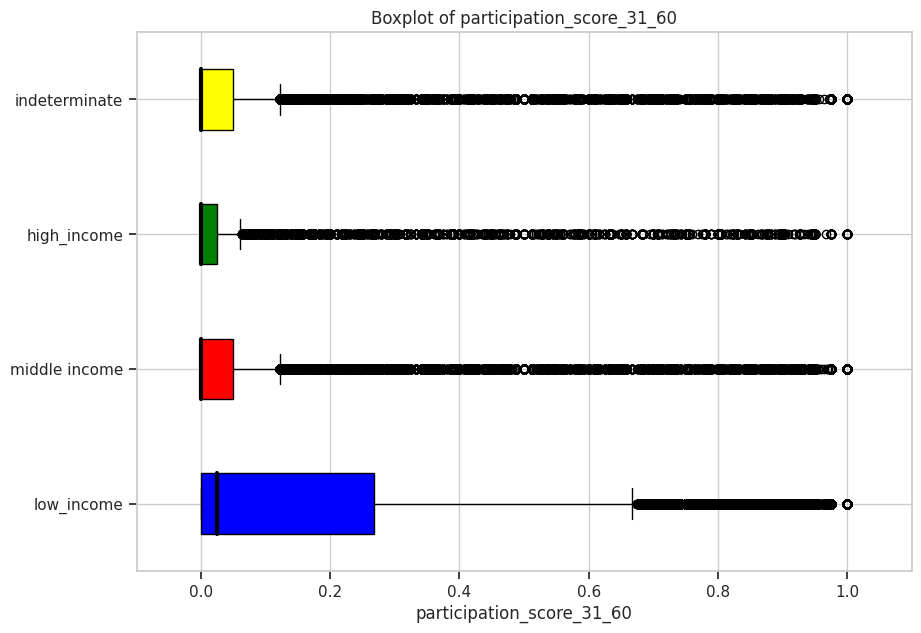

Low income coefficient of variation: 0.6425675714785894
Medium income coefficient of variation: 0.27051675956230503
High income coefficient of variation: 0.1548881268501052


In [113]:
#slide 36 (participation_score_31_60)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('participation_score_31_60')
# Adding title
plt.title("Boxplot of participation_score_31_60")
plt.xlim(-0.1, 1.1)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

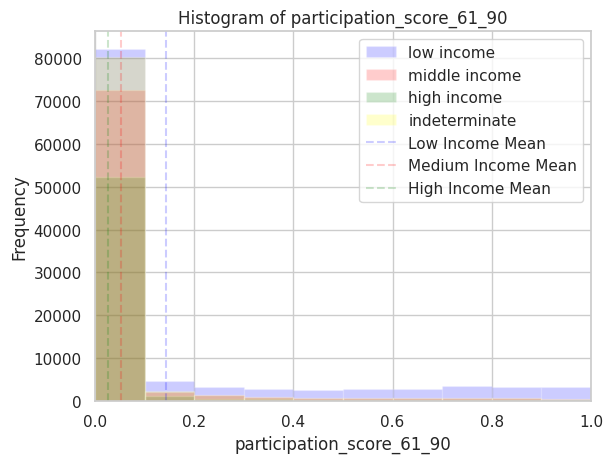

Low income mean: 0.14380935807048997
Low income median: 0.0
Low income std. dev: 0.2706662154374875
Medium income mean: 0.05180835185651784
Medium income median: 0.0
Medium income std. dev: 0.1641485213672932
High income mean: 0.02537166866356821
High income median: 0.0
High income std. dev: 0.10787839689271848


In [114]:
#slide 36 (participation_score_61_90)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['participation_score_61_90'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['participation_score_61_90'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['participation_score_61_90'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['participation_score_61_90'])

plt.hist(x1, bins = 10, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 10, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 10, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 10, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('participation_score_61_90')
plt.ylabel('Frequency')
plt.title('Histogram of participation_score_61_90')
plt.xlim(0, 1)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

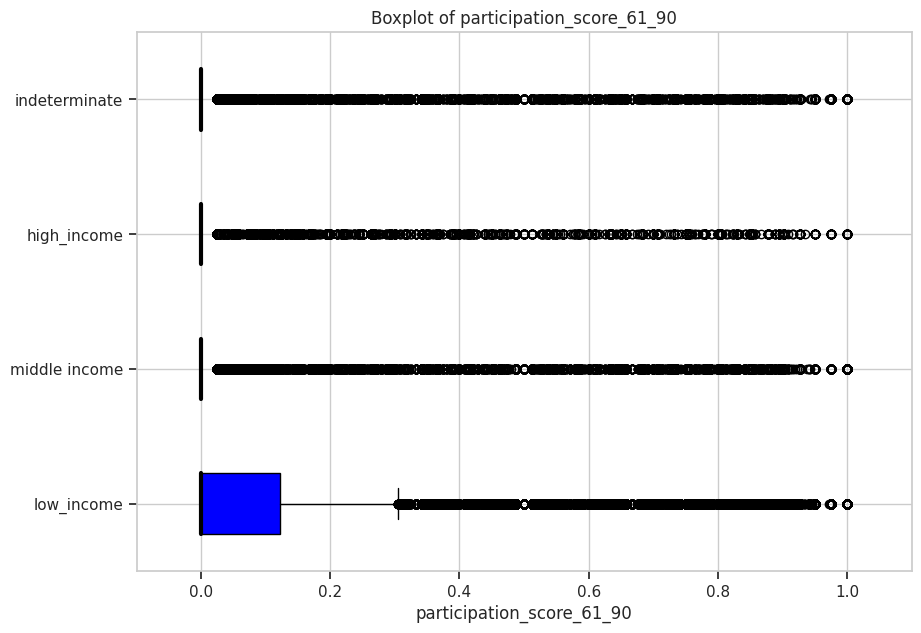

Low income coefficient of variation: 0.5313162480882432
Medium income coefficient of variation: 0.19141048605855054
High income coefficient of variation: 0.09373784837741599


In [115]:
#slide 36 (participation_score_61_90)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('participation_score_61_90')
# Adding title
plt.title("Boxplot of participation_score_61_90")
plt.xlim(-0.1, 1.1)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

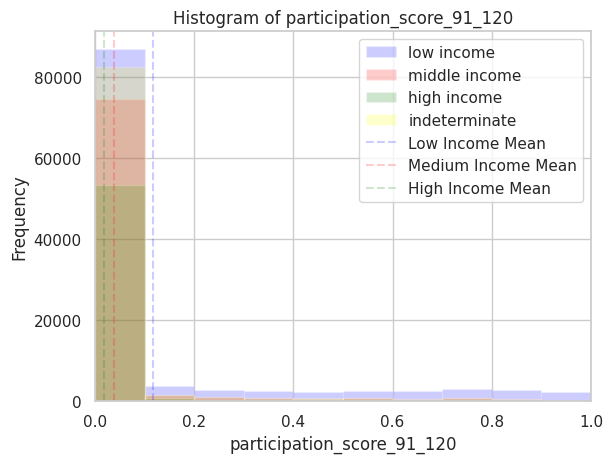

Low income mean: 0.11743347862140024
Low income median: 0.0
Low income std. dev: 0.24759850643243708
Medium income mean: 0.039254539100299135
Medium income median: 0.0
Medium income std. dev: 0.14491971979488463
High income mean: 0.01797697378230551
High income median: 0.0
High income std. dev: 0.09341086428427695


In [116]:
#slide 37 (participation_score_91_120)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['participation_score_91_120'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['participation_score_91_120'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['participation_score_91_120'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['participation_score_91_120'])

plt.hist(x1, bins = 10, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 10, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 10, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 10, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('participation_score_91_120')
plt.ylabel('Frequency')
plt.title('Histogram of participation_score_91_120')
plt.xlim(0, 1)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

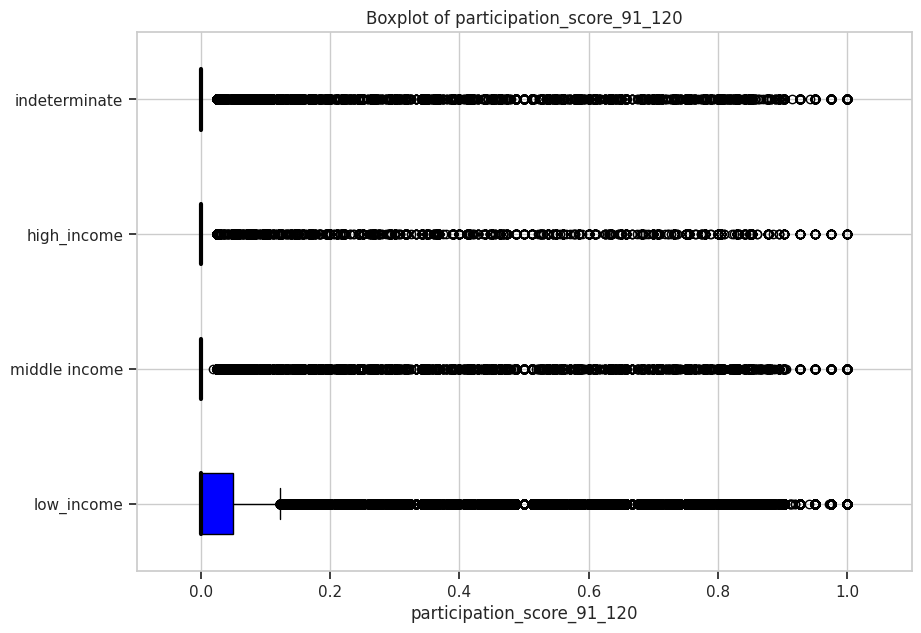

Low income coefficient of variation: 0.4742899313629124
Medium income coefficient of variation: 0.15854109811042272
High income coefficient of variation: 0.07260534015866908


In [117]:
#slide 37 (participation_score_91_120)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('participation_score_91_120')
# Adding title
plt.title("Boxplot of participation_score_91_120")
plt.xlim(-0.1, 1.1)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

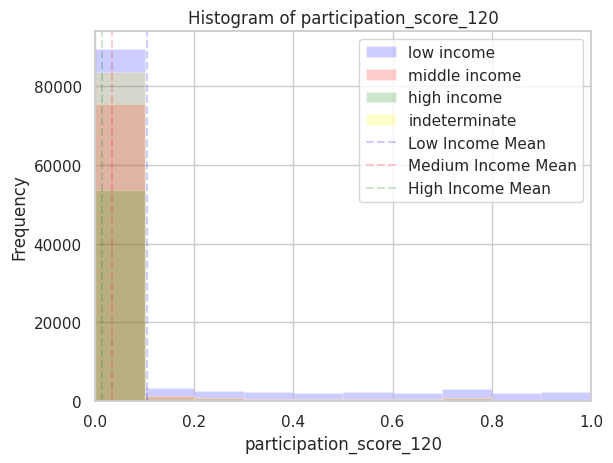

Low income mean: 0.10573922342052719
Low income median: 0.0
Low income std. dev: 0.23930453284938863
Medium income mean: 0.03343094076807944
Medium income median: 0.0
Medium income std. dev: 0.13540730175089427
High income mean: 0.015030427843122552
High income median: 0.0
High income std. dev: 0.08694091221443294


In [118]:
#slide 38 (participation_score_120)

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['participation_score_120'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['participation_score_120'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['participation_score_120'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['participation_score_120'])

plt.hist(x1, bins = 10, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 10, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 10, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 10, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('participation_score_120')
plt.ylabel('Frequency')
plt.title('Histogram of participation_score_120')
plt.xlim(0, 1)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

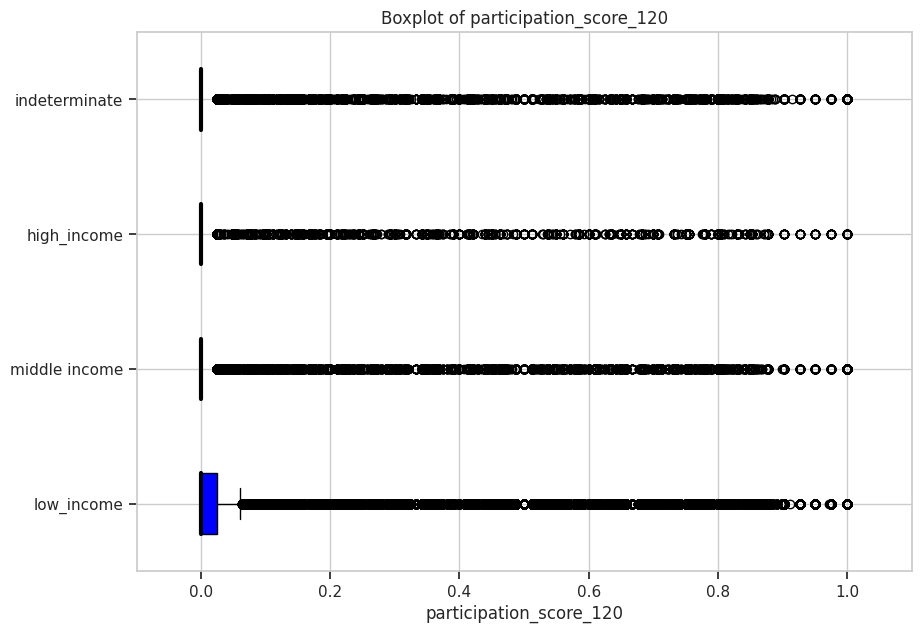

Low income coefficient of variation: 0.4418605120492071
Medium income coefficient of variation: 0.13970040755191174
High income coefficient of variation: 0.0628087887185249


In [119]:
#slide 38 (participation_score_120)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('participation_score_120')
# Adding title
plt.title("Boxplot of participation_score_120")
plt.xlim(-0.1, 1.1)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

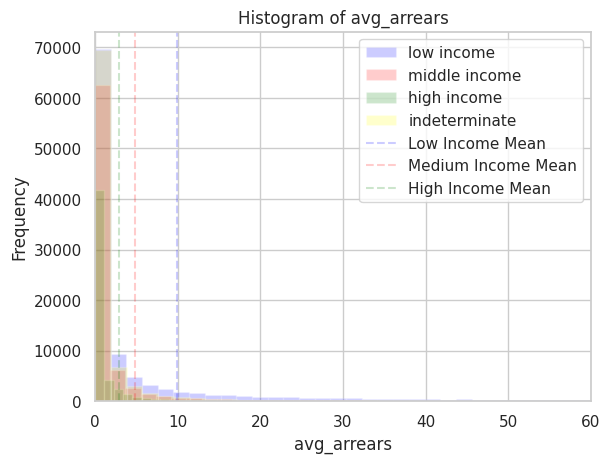

Low income mean: 9.93983765513404
Low income median: 0.6325365853658538
Low income std. dev: 34.310586741152406
Medium income mean: 4.842310399268556
Medium income median: 0.1375609756097561
Medium income std. dev: 23.80054324306683
High income mean: 2.9365103034722435
High income median: 0.03580487804878049
High income std. dev: 16.661930826820722


In [120]:
#slide 34 (avg_arrears)

filtered = dfg[dfg['avg_arrears'] >= 0]
x1 = list(dfg[dfg['income_range'] == "low income"]['avg_arrears'])
x2 = list(dfg[dfg['income_range'] == "middle income"]['avg_arrears'])
x3 = list(dfg[dfg['income_range'] == "high income"]['avg_arrears'])
x4 = list(dfg[dfg['income_range'] == "indeterminate"]['avg_arrears'])

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('avg_arrears')
plt.ylabel('Frequency')
plt.title('Histogram of avg_arrears')
plt.xlim(0, 60)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

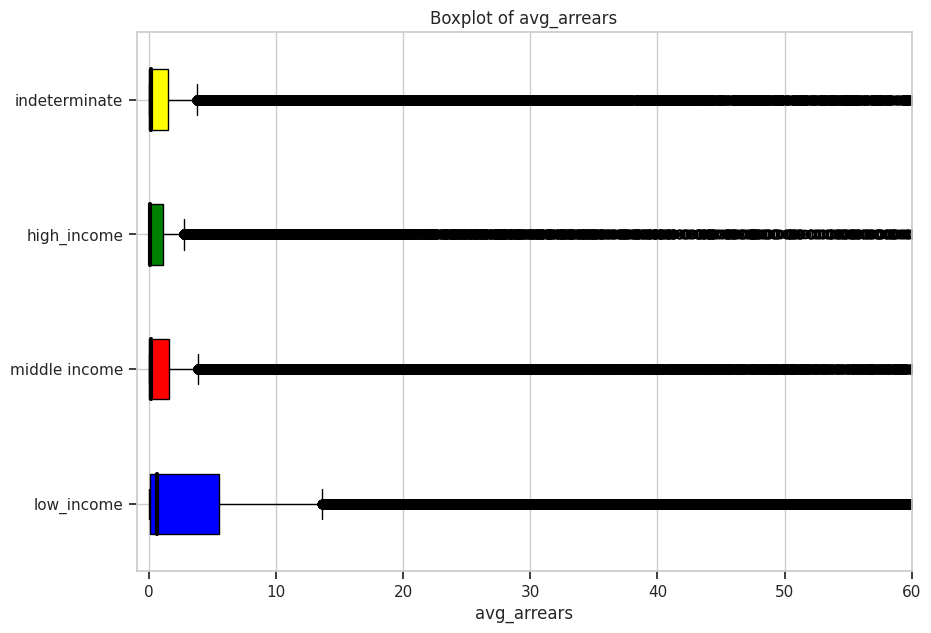

Low income coefficient of variation: 0.2897017684402382
Medium income coefficient of variation: 0.14113166981958514
High income coefficient of variation: 0.08558612901685439


In [121]:
#slide 34 (avg_arrears)

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('avg_arrears')
# Adding title
plt.title("Boxplot of avg_arrears")
plt.xlim(-1, 60)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

print('Low income coefficient of variation: ' + str(np.nanmean(x1)/np.nanstd(x1)))
print('Medium income coefficient of variation: ' + str(np.nanmean(x2)/np.nanstd(x1)))
print('High income coefficient of variation: ' + str(np.nanmean(x3)/np.nanstd(x1)))

In [122]:
from scipy.stats import t
group1 = list(dfg[dfg['income_range'] == "middle income"]['avg_arrears'])
group2 = list(dfg[dfg['income_range'] == "high income"]['avg_arrears'])

# calculate observed difference in means
observed_diff = np.nanmean(group1) - np.nanmean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 100

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.nanvar(bootstrap_sample1) / len(bootstrap_sample1)) + (np.nanvar(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > abs(t_crit):
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is statistically significant (p < 0.05).


In [123]:
from scipy.stats import t
group1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['participation_score_120'])
group2 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['participation_score_120'])

# calculate observed difference in means
observed_diff = np.nanmean(group1) - np.nanmean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 100

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.nanvar(bootstrap_sample1) / len(bootstrap_sample1)) + (np.nanvar(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > abs(t_crit):
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is statistically significant (p < 0.05).


In [124]:
filtered = final_non_interval[final_non_interval['avg_arrears_91_120'] >= 0]
group1 = list(filtered[filtered['income_range'] == "middle income"]['avg_arrears_91_120'])
group2 = list(filtered[filtered['income_range'] == "high income"]['avg_arrears_91_120'])

# calculate observed difference in means
observed_diff = np.nanmean(group1) - np.nanmean(group2)

# combine data into a single dataset
combined_data = np.concatenate([group1, group2])

# set the number of bootstrap samples
num_samples = 100

# initialize an array to store the bootstrap t-statistics
bootstrap_t = np.zeros(num_samples)

# perform bootstrapping
for i in range(num_samples):
    # create bootstrap samples by sampling with replacement
    bootstrap_sample1 = np.random.choice(combined_data, size=len(group1), replace=True)
    bootstrap_sample2 = np.random.choice(combined_data, size=len(group2), replace=True)
    
    # calculate difference in means for bootstrap samples
    bootstrap_diff = np.mean(bootstrap_sample1) - np.mean(bootstrap_sample2)
    
    # calculate standard error of the mean difference for bootstrap samples
    se = np.sqrt((np.nanvar(bootstrap_sample1) / len(bootstrap_sample1)) + (np.nanvar(bootstrap_sample2) / len(bootstrap_sample2)))
    
    # calculate the bootstrap t-statistic
    bootstrap_t[i] = bootstrap_diff / se

# calculate the p-value
p_value = 2 * (1 - np.mean(bootstrap_t >= abs(observed_diff)))

# calculate the critical t-value
df = len(group1) + len(group2) - 2
t_crit = t.ppf(0.025, df)

# compare the observed t-statistic to the critical t-value
if abs(observed_diff / se) > abs(t_crit):
    print("The difference in means is statistically significant (p < 0.05).")
else:
    print("The difference in means is not statistically significant (p >= 0.05).")


The difference in means is statistically significant (p < 0.05).


In [125]:
### EXAMPLE QUERY
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.outputs.final_non_interval` WHERE income_range="low income"
'''

In [126]:
final_non_interval_low_income = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)
final_non_interval_low_income.sort_values(by=['per_id_proxy'])

,per_id_proxy,income_range,p_city,p_zip,cur_esp,enduse,care,fera,medallot,payplan_cd,...,BuildingArea,LotSize,Stories,Rooms,Beds,Baths,ces_score,dac_flag,low_income_flag,opportunity_flag
0,2,low income,OAKLAND,94605,EBCE,B,True,None,<NA>,False,...,1146.000000,4429.000000,1.0,6.000000,3.000000,1.000000,21.77,False,True,Low Resource
1,6,low income,OAKLAND,94621,EBCE,M,False,None,1,False,...,1320.000000,3500.000000,1.0,4.000000,2.000000,1.000000,52.21,True,True,Low Resource
2,8,low income,HAYWARD,94544,EBCE,B,True,None,<NA>,False,...,951.000000,5400.000000,1.0,6.000000,3.000000,1.000000,21.31,False,False,Low Resource
3,15,low income,NEWARK,94560,EBCE,H,False,None,<NA>,False,...,883.665595,1761.000000,3.0,0.000000,1.607717,1.607717,32.85,False,False,Moderate Resource
4,16,low income,FREMONT,94538,EBCE,H,False,None,<NA>,False,...,1369.000000,0.000000,3.0,5.000000,3.000000,3.000000,13.04,False,False,High Resource
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111009,478190,low income,OAKLAND,94621,EBCE,B,False,YES,<NA>,True,...,106.909091,465.909091,1.0,0.454545,0.272727,0.090909,32.68,False,True,Low Resource
111010,478200,low income,HAYWARD,94544,EBCE,B,False,None,<NA>,False,...,NaN,NaN,NaN,NaN,NaN,NaN,28.51,True,True,Low Resource
111011,478201,low income,HAYWARD,94541,EBCE,M,True,None,1,False,...,1196.000000,6600.000000,1.0,5.000000,3.000000,1.500000,36.65,False,True,Low Resource
111012,478203,low income,OAKLAND,94601,EBCE,B,True,None,<NA>,False,...,770.000000,1750.000000,1.0,4.000000,1.000000,1.000000,35.42,False,True,Low Resource


In [127]:
### EXAMPLE QUERY
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.outputs.final_non_interval` WHERE income_range="middle income"
'''

final_non_interval_middle_income = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)
final_non_interval_middle_income.sort_values(by=['per_id_proxy'])

,per_id_proxy,income_range,p_city,p_zip,cur_esp,enduse,care,fera,medallot,payplan_cd,...,BuildingArea,LotSize,Stories,Rooms,Beds,Baths,ces_score,dac_flag,low_income_flag,opportunity_flag
0,1,middle income,CASTRO VALLEY,94546,EBCE,B,False,None,<NA>,False,...,1176.000000,6237.0,1.0,6.000000,3.000000,2.000000,28.32,False,False,High Resource
1,4,middle income,HAYWARD,94541,EBCE,B,True,None,<NA>,True,...,1663.000000,5250.0,1.0,7.000000,3.000000,2.500000,32.15,False,False,Low Resource
2,14,middle income,UNION CITY,94587,EBCE,B,True,None,<NA>,False,...,2520.000000,4934.0,2.0,8.000000,4.000000,2.500000,32.26,False,True,Moderate Resource
3,23,middle income,FREMONT,94555,EBCE,B,False,None,<NA>,False,...,11.194805,0.0,2.0,0.051948,0.025974,0.012987,11.97,False,False,High Resource
4,35,middle income,FREMONT,94555,EBCE,B,True,NO,0,False,...,1520.000000,7656.0,0.0,8.000000,3.000000,1.500000,13.25,False,False,High Resource
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81111,478164,middle income,OAKLAND,94602,EBCE,B,False,None,<NA>,False,...,1226.000000,4000.0,1.0,5.000000,2.000000,2.000000,27.03,False,True,Low Resource
81112,478168,middle income,FREMONT,94536,EBCE,H,False,None,<NA>,False,...,1738.000000,6000.0,1.0,7.000000,4.000000,2.000000,24,False,False,Moderate Resource
81113,478172,middle income,SAN LEANDRO,94577,EBCE,B,False,None,<NA>,True,...,2275.000000,8970.0,1.0,7.000000,4.000000,1.500000,36.29,False,True,Low Resource
81114,478184,middle income,LIVERMORE,94550,EBCE,M,False,None,1,False,...,1536.000000,10048.0,1.0,7.000000,4.000000,2.000000,6.34,False,False,High Resource


In [128]:
### EXAMPLE QUERY
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.outputs.final_non_interval` WHERE income_range="high income"
'''

final_non_interval_high_income = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)
final_non_interval_high_income.sort_values(by=['per_id_proxy'])

,per_id_proxy,income_range,p_city,p_zip,cur_esp,enduse,care,fera,medallot,payplan_cd,...,BuildingArea,LotSize,Stories,Rooms,Beds,Baths,ces_score,dac_flag,low_income_flag,opportunity_flag
0,10,high income,FREMONT,94539,EBCE,B,False,None,<NA>,False,...,1834.0,8280.0,1.0,8.0,4.0,2.0,11.02,False,False,Highest Resource
1,18,high income,HAYWARD,94541,EBCE,B,True,None,<NA>,False,...,900.0,5000.0,1.0,4.0,2.0,1.0,3.49,False,False,Moderate Resource
2,30,high income,BERKELEY,94704,EBCE,B,False,None,<NA>,False,...,2941.0,6750.0,2.0,8.0,5.0,2.0,7.27,False,True,High Resource
3,40,high income,FREMONT,94539,EBCE,B,False,None,<NA>,False,...,1692.0,9666.0,0.0,0.0,0.0,0.0,12.89,False,False,Moderate Resource
4,41,high income,DUBLIN,94568,EBCE,B,False,None,<NA>,False,...,1815.0,6816.0,1.0,6.0,4.0,2.0,16.65,False,False,High Resource
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55535,478159,high income,BERKELEY,94708,EBCE,B,False,None,<NA>,False,...,2208.0,5680.0,1.0,9.0,5.0,3.0,1.57,False,False,Highest Resource
55536,478162,high income,PLEASANTON,94566,EBCE,B,False,None,<NA>,False,...,2246.0,6860.0,1.0,8.0,4.0,2.5,6.32,False,False,Highest Resource
55537,478165,high income,ALBANY,94706,EBCE,B,False,None,<NA>,False,...,1241.0,4400.0,1.0,5.0,2.0,1.0,3.81,False,False,Highest Resource
55538,478171,high income,PLEASANTON,94566,EBCE,B,False,None,<NA>,False,...,NaN,NaN,NaN,NaN,NaN,NaN,6.32,False,False,Highest Resource


In [129]:
### EXAMPLE QUERY
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.outputs.FINAL_DATA_TRAINING` WHERE income_range="low income"
'''
project_id = 'berkeley-data-discovery-2023'
FINAL_DATA_TRAINING_LOW_INCOME = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)
FINAL_DATA_TRAINING_LOW_INCOME.sort_values(by=['per_id_proxy'])

,per_id_proxy,income_range,p_city,care,fera,nem,avg_arrears,avg_monthly_kwh,max_monthly_kwh,avg_month_bill,...,c_weekday,c_weekday_sqrt,c_weekend,c_weekend_sqrt,c_max,c_min,c_day,s_variance,s_diff,s_num_peaks
55855,2,low income,OAKLAND,True,None,No,0.285707,534.687712,695.0000,57.495098,...,0.698614,0.835832,0.713102,0.844454,2.0295,0.06917,0.715890,0.039440,0.116293,366
92459,4,low income,HAYWARD,True,None,No,1.397707,284.112212,460.0000,29.706275,...,0.265712,0.515472,0.288665,0.537275,1.9256,0.08870,0.296302,0.041149,0.102535,1004
133539,6,low income,OAKLAND,False,None,No,3.321268,453.340000,1811.0000,47.562800,...,0.399397,0.631978,0.447297,0.668803,1.7350,0.07962,0.392383,0.086657,0.066768,448
161077,8,low income,HAYWARD,True,None,No,0.735854,756.400314,1684.9100,84.254902,...,1.378938,1.174282,1.243226,1.115001,9.1810,0.00000,1.303831,0.922017,0.394139,627
92861,14,low income,UNION CITY,True,None,No,0.169024,646.343549,860.0000,69.241373,...,0.818798,0.904874,0.779548,0.882920,5.5800,0.38900,0.766057,0.107179,0.131490,245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149438,478190,low income,OAKLAND,False,YES,No,11.901707,582.078431,668.0000,64.363922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
77195,478200,low income,HAYWARD,False,None,No,0.020293,319.518559,574.3570,30.074118,...,0.441911,0.664764,0.410309,0.640554,7.4620,0.10000,0.526199,0.284657,0.173286,752
116400,478201,low income,HAYWARD,True,None,No,20.984585,830.745098,1497.0000,92.306471,...,1.056356,1.027792,1.032321,1.016032,6.8460,0.04133,1.176257,0.500509,0.228569,361
169422,478203,low income,OAKLAND,True,None,Yes,1.040244,104.065635,438.0945,10.584231,...,0.415281,0.644423,0.397094,0.630154,2.0710,0.00000,0.214310,0.374347,0.104113,143


In [130]:
### EXAMPLE QUERY
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.outputs.final_non_interval` WHERE income_range="indeterminate"
'''

final_non_interval_indeterminate = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)
final_non_interval_indeterminate.sort_values(by=['per_id_proxy'])

,per_id_proxy,income_range,p_city,p_zip,cur_esp,enduse,care,fera,medallot,payplan_cd,...,BuildingArea,LotSize,Stories,Rooms,Beds,Baths,ces_score,dac_flag,low_income_flag,opportunity_flag
0,5,indeterminate,DUBLIN,94568,EBCE,B,False,None,<NA>,False,...,1638.0,6600.0,1.0,7.0,3.0,2.0,16.65,False,False,High Resource
1,7,indeterminate,LIVERMORE,94551,EBCE,B,False,None,<NA>,True,...,1182.0,1391.0,2.0,5.0,3.0,1.5,13.26,False,False,Moderate Resource
2,13,indeterminate,SAN LEANDRO,94578,EBCE,B,False,None,<NA>,False,...,1396.0,5130.0,1.0,7.0,3.0,1.0,43.02,True,True,Low Resource
3,22,indeterminate,OAKLAND,94602,EBCE,B,False,None,<NA>,False,...,1125.0,4000.0,1.0,5.0,2.0,1.0,27.03,False,True,Low Resource
4,45,indeterminate,OAKLAND,94619,EBCE,B,False,None,<NA>,False,...,1288.0,5850.0,1.0,6.0,3.0,1.0,14.34,False,False,Moderate Resource
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89180,478176,indeterminate,FREMONT,94555,EBCE,B,False,None,<NA>,False,...,1969.0,0.0,3.0,7.0,4.0,3.5,23.06,False,False,Moderate Resource
89181,478187,indeterminate,OAKLAND,94602,EBCE,B,False,None,<NA>,False,...,2224.0,10400.0,1.0,8.0,3.0,2.0,4.8,False,False,Moderate Resource
89182,478196,indeterminate,BERKELEY,94705,EBCE,B,False,None,<NA>,False,...,1072.0,2310.0,2.0,9.0,4.0,1.5,4.73,False,False,Highest Resource
89183,478197,indeterminate,FREMONT,94538,EBCE,B,False,None,<NA>,False,...,1136.0,6460.0,1.0,6.0,4.0,2.0,25.42,False,False,High Resource


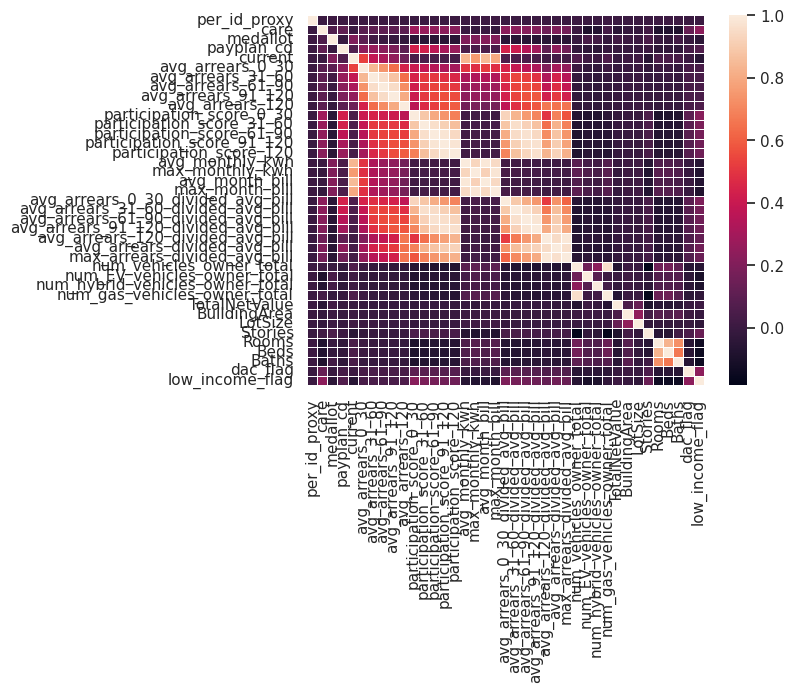

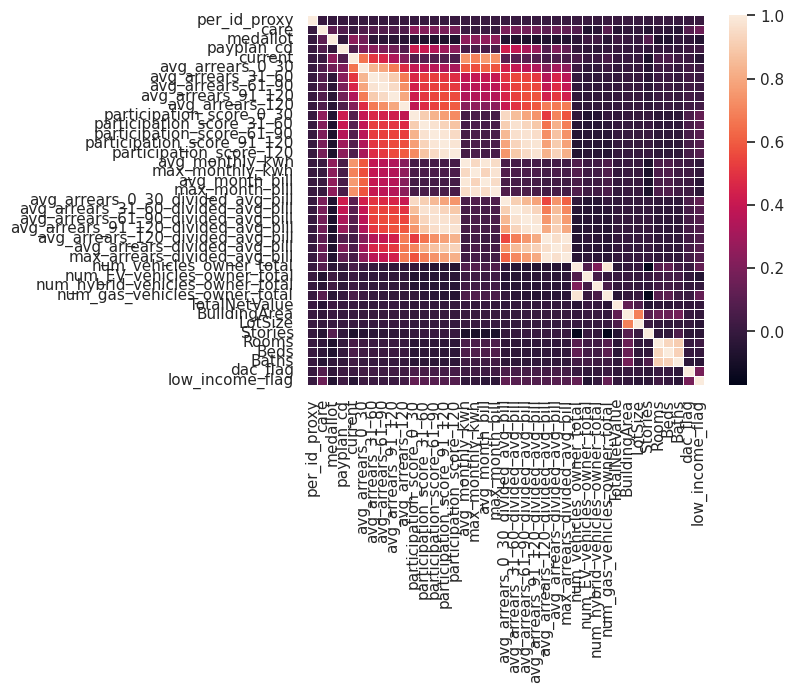

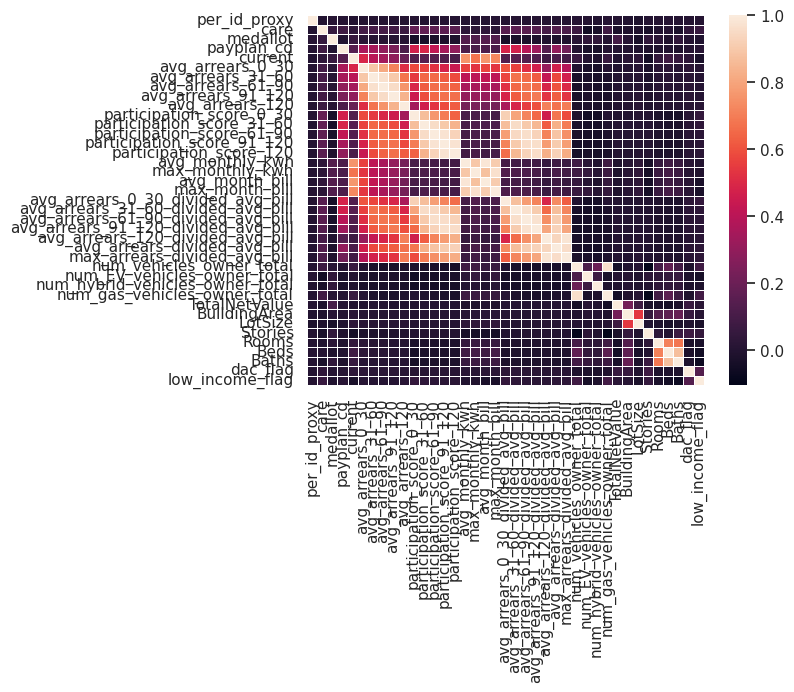

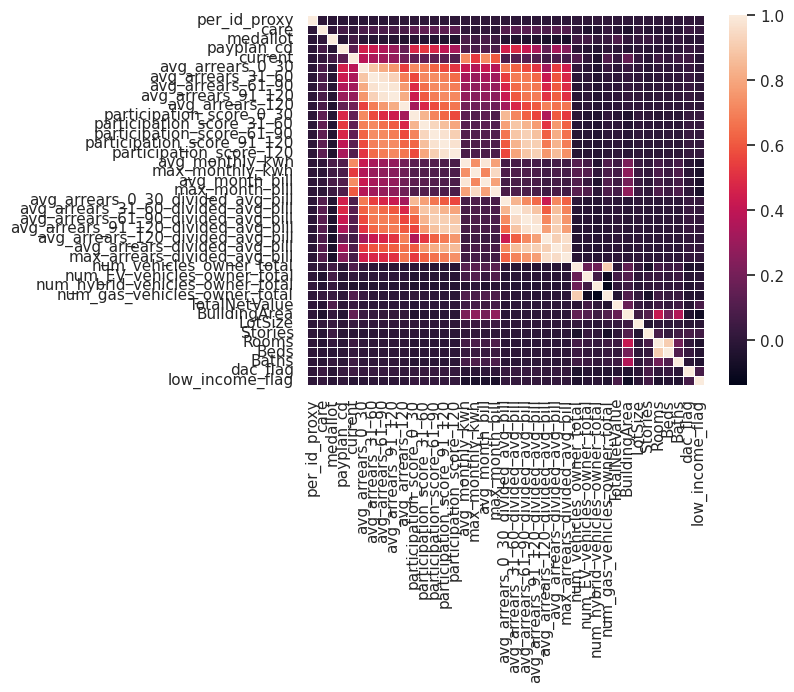

In [131]:
# heatmaps for slides 75-78 on linked presentation

import seaborn as sns

cormat = final_non_interval.corr()
round(cormat,2)

ax = sns.heatmap(cormat, linewidth=0.5, xticklabels=True, yticklabels=True)
plt.show()

cormat = final_non_interval_low_income.corr()
round(cormat,2)

ax = sns.heatmap(cormat, linewidth=0.5, xticklabels=True, yticklabels=True)
plt.show()

cormat = final_non_interval_middle_income.corr()
round(cormat,2)

ax = sns.heatmap(cormat, linewidth=0.5, xticklabels=True, yticklabels=True)
plt.show()

cormat = final_non_interval_high_income.corr()
round(cormat,2)

ax = sns.heatmap(cormat, linewidth=0.5, xticklabels=True, yticklabels=True)
plt.show()

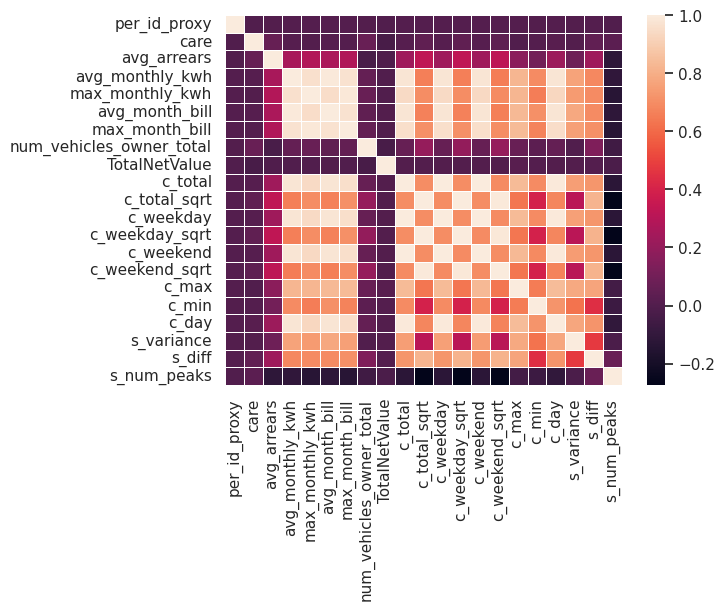

In [132]:
import seaborn as sns

cormat = FINAL_DATA_TRAINING_LOW_INCOME.corr()
round(cormat,2)

ax = sns.heatmap(cormat, linewidth=0.5, xticklabels=True, yticklabels=True)
plt.show()

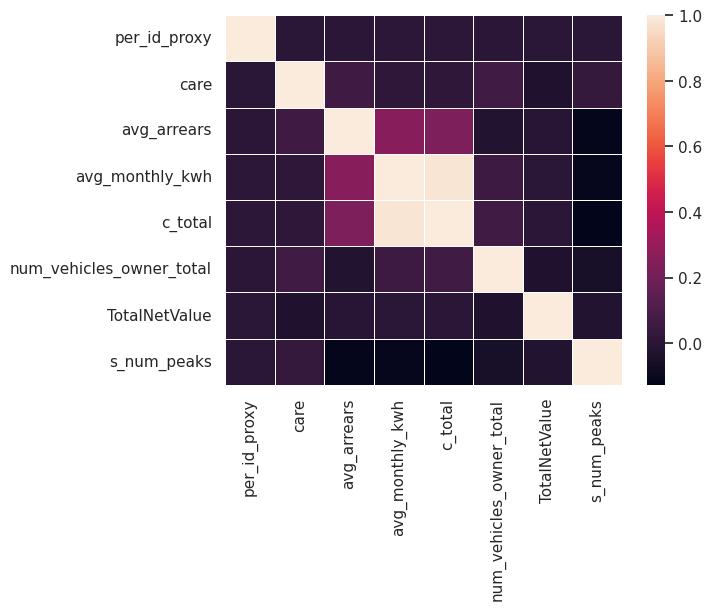

In [133]:
# reduced feature set to test model removing co-linear features (Slide 14 of https://docs.google.com/presentation/d/1hBSB-JPjkXj5B9G6FSXBNjOB7AqnDxKEeuKAjHD1b5A/edit#slide=id.g21eb05b6b47_0_878)

FINAL_DATA_TRAINING_LOW_INCOME_NOISELESS = FINAL_DATA_TRAINING_LOW_INCOME[["per_id_proxy", "care", "avg_arrears", "avg_monthly_kwh", "c_total", "num_vehicles_owner_total", "TotalNetValue", "s_num_peaks"]]
FINAL_DATA_TRAINING_LOW_INCOME_NOISELESS.head()

cormat = FINAL_DATA_TRAINING_LOW_INCOME_NOISELESS.corr()
round(cormat,2)

ax = sns.heatmap(cormat, linewidth=0.5, xticklabels=True, yticklabels=True)
plt.show()

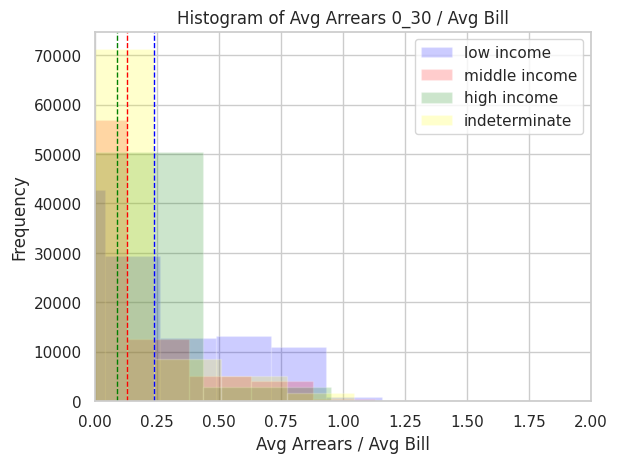

Low income mean: 0.23968021664924788
Low income median: 0.09701220216266632
Low income std. dev: 0.2844171139634036
Medium income mean: 0.12936411368769024
Medium income median: 0.022249862844434268
Medium income std. dev: 0.21495032829092361
High income mean: 0.09072402213782264
High income median: 0.006793978866028136
High income std. dev: 0.18304636138264396


In [134]:
# slide 46

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_0_30_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_0_30_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_0_30_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_0_30_divided_avg_bill'])

plt.hist(x1, bins = 20, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 20, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 20, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 20, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Avg Arrears / Avg Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Avg Arrears 0_30 / Avg Bill')
plt.xlim(0, 2)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

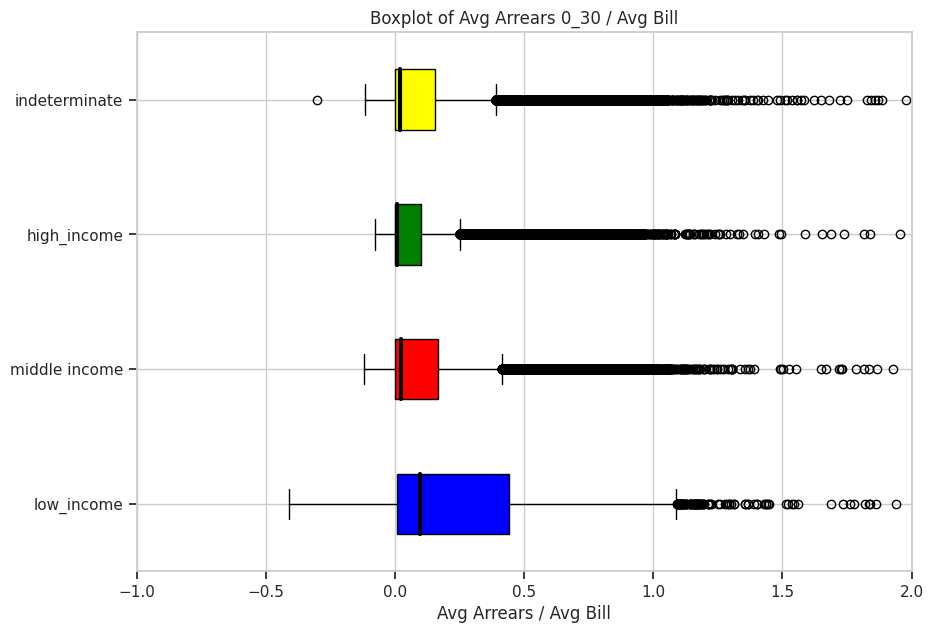

In [135]:
# slide 46

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_0_30_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_0_30_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_0_30_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_0_30_divided_avg_bill'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Arrears / Avg Bill')
# Adding title
plt.title("Boxplot of Avg Arrears 0_30 / Avg Bill")
plt.xlim(-1, 2)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

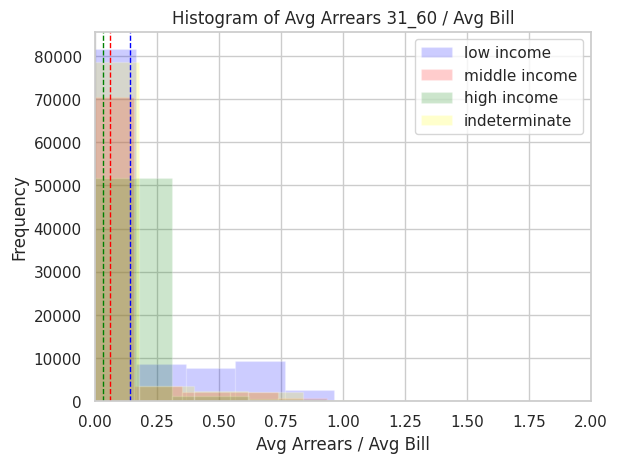

Low income mean: 0.14255132723428365
Low income median: 0.0013794791783653987
Low income std. dev: 0.2391976316043404
Medium income mean: 0.05907625948287564
Medium income median: 0.0
Medium income std. dev: 0.15855780507687986
High income mean: 0.033309504239802855
High income median: 0.0
High income std. dev: 0.11846189225265019


In [136]:
# slide 47

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_31_60_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_31_60_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_31_60_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_31_60_divided_avg_bill'])

plt.hist(x1, bins = 20, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 20, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 20, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 20, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Avg Arrears / Avg Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Avg Arrears 31_60 / Avg Bill')
plt.xlim(0, 2)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

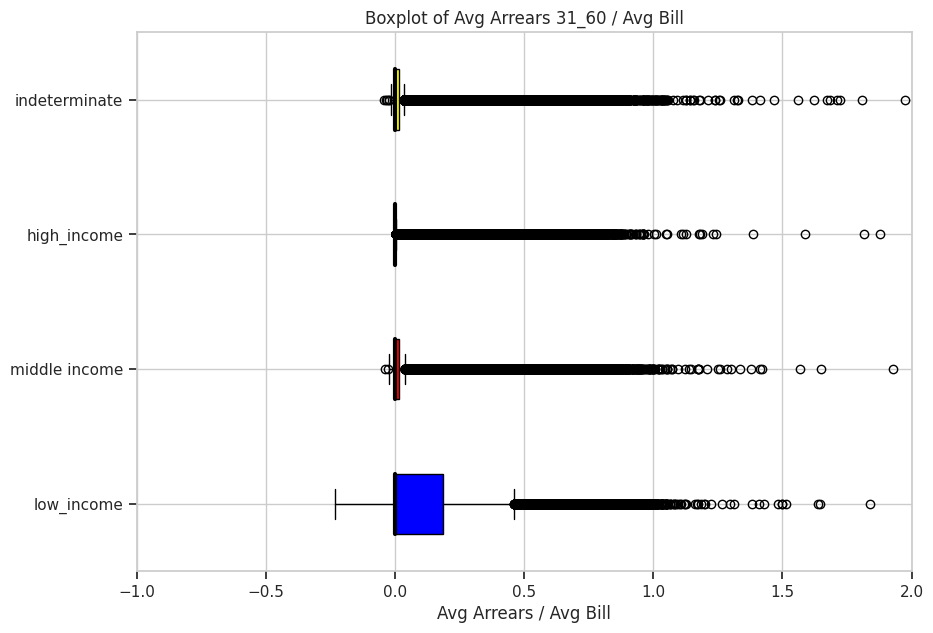

In [137]:
# slide 47

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_31_60_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_31_60_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_31_60_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_31_60_divided_avg_bill'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Arrears / Avg Bill')
# Adding title
plt.title("Boxplot of Avg Arrears 31_60 / Avg Bill")
plt.xlim(-1, 2)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

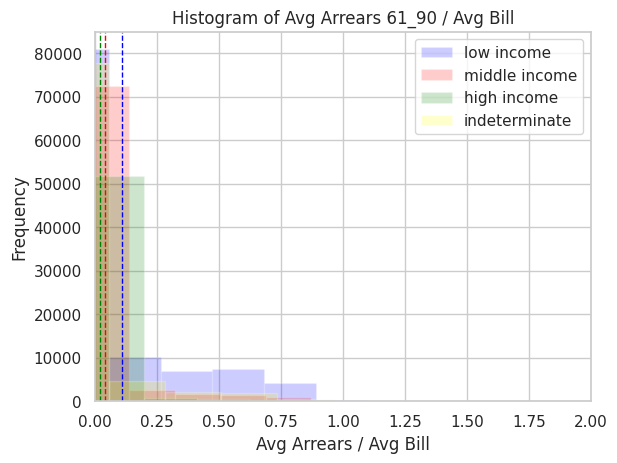

Low income mean: 0.10922827454033933
Low income median: 0.0
Low income std. dev: 0.21515382801505303
Medium income mean: 0.04041110500380754
Medium income median: 0.0
Medium income std. dev: 0.13515471120926276
High income mean: 0.020578633275748822
High income median: 0.0
High income std. dev: 0.09640940150393618


In [138]:
# slide 48

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_61_90_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_61_90_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_61_90_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_61_90_divided_avg_bill'])

plt.hist(x1, bins = 20, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 20, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 20, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 20, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Avg Arrears / Avg Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Avg Arrears 61_90 / Avg Bill')
plt.xlim(0, 2)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

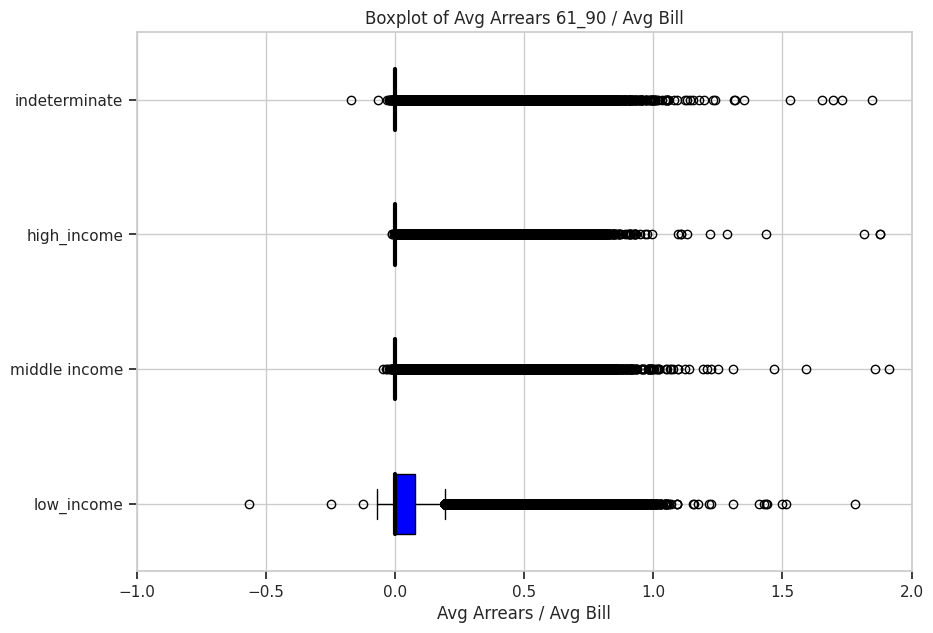

In [139]:
# slide 48

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_61_90_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_61_90_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_61_90_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_61_90_divided_avg_bill'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Arrears / Avg Bill')
# Adding title
plt.title("Boxplot of Avg Arrears 61_90 / Avg Bill")
plt.xlim(-1, 2)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

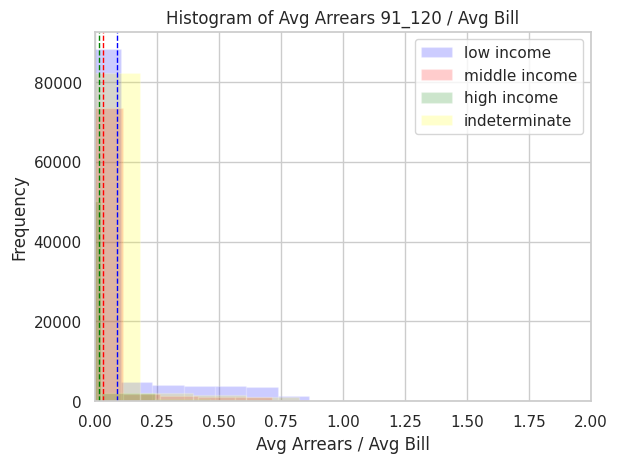

Low income mean: 0.08910093672069239
Low income median: 0.0
Low income std. dev: 0.19410425755902588
Medium income mean: 0.030927687747023706
Medium income median: 0.0
Medium income std. dev: 0.11832037567959519
High income mean: 0.014879622351207773
High income median: 0.0
High income std. dev: 0.08349738197108815


In [140]:
# slide 49

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_91_120_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_91_120_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_91_120_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_91_120_divided_avg_bill'])

plt.hist(x1, bins = 20, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 20, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 20, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 20, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Avg Arrears / Avg Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Avg Arrears 91_120 / Avg Bill')
plt.xlim(0, 2)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

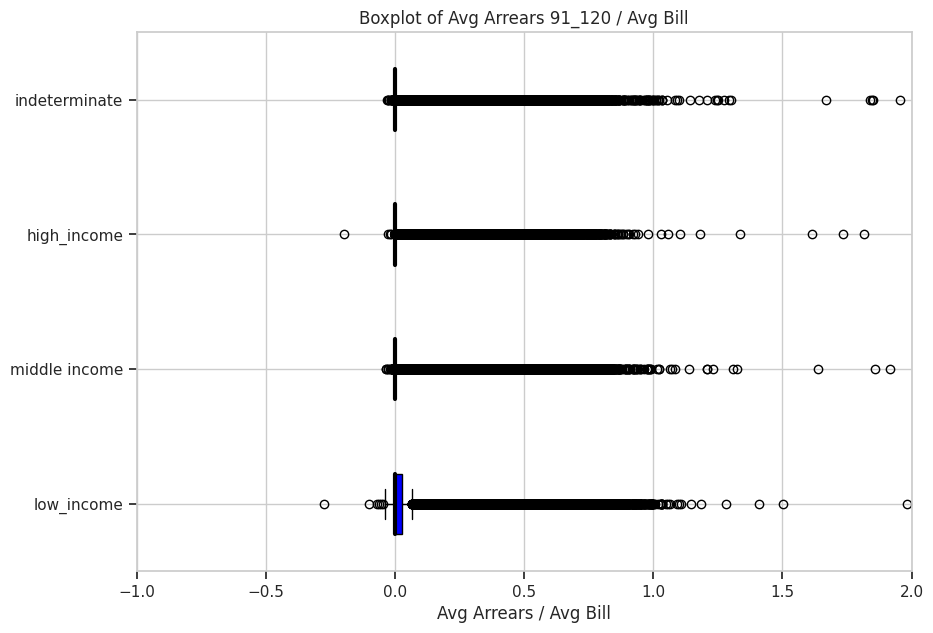

In [141]:
# slide 49

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_91_120_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_91_120_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_91_120_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_91_120_divided_avg_bill'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Arrears / Avg Bill')
# Adding title
plt.title("Boxplot of Avg Arrears 91_120 / Avg Bill")
plt.xlim(-1, 2)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

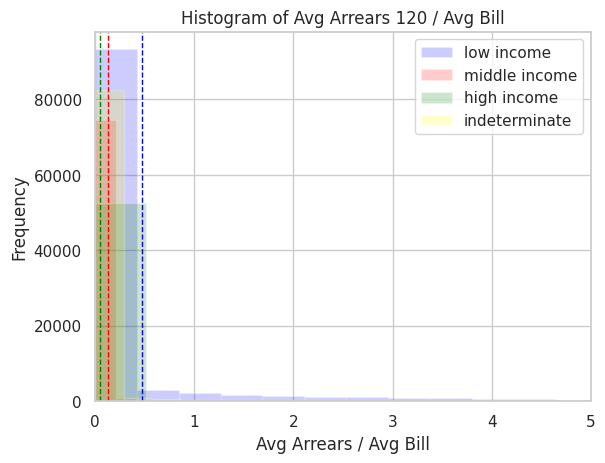

Low income mean: 0.4701864855163517
Low income median: 0.0
Low income std. dev: 1.549129371571829
Medium income mean: 0.12960191371917215
Medium income median: 0.0
Medium income std. dev: 0.7639475354705713
High income mean: 0.0548185995214821
High income median: 0.0
High income std. dev: 0.5159336690115884


In [142]:
# slide 50

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_120_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_120_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_120_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_120_divided_avg_bill'])

plt.hist(x1, bins = 100, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 100, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 100, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 100, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Avg Arrears / Avg Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Avg Arrears 120 / Avg Bill')
plt.xlim(0, 5)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

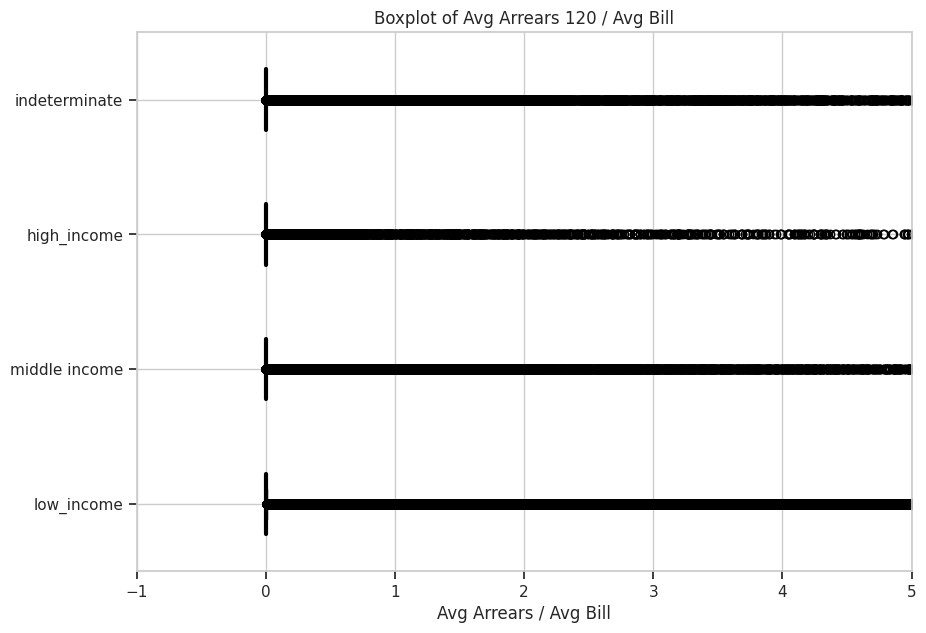

In [143]:
# slide 50

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_120_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_120_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_120_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_120_divided_avg_bill'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Arrears / Avg Bill')
# Adding title
plt.title("Boxplot of Avg Arrears 120 / Avg Bill")
plt.xlim(-1, 5)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

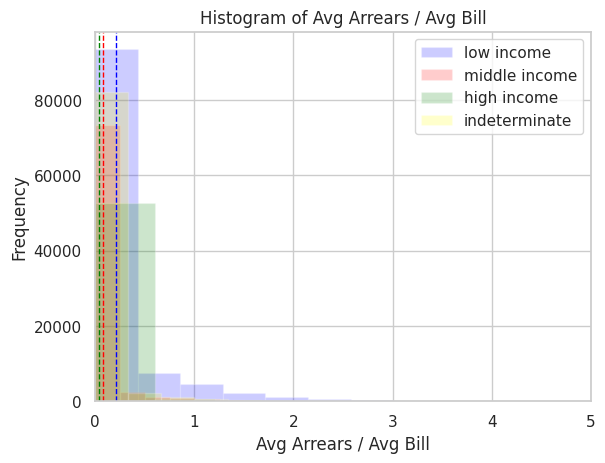

Low income mean: 0.21014944813218298
Low income median: 0.022230933294108995
Low income std. dev: 0.45517255065546997
Medium income mean: 0.07787621592811388
Medium income median: 0.004583765919680052
Medium income std. dev: 0.24916126222313267
High income mean: 0.04286207630521285
High income median: 0.0013792299462202693
High income std. dev: 0.1744178715035915


In [144]:
# slide 51

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_divided_avg_bill'])

plt.hist(x1, bins = 20, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 20, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 20, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 20, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Avg Arrears / Avg Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Avg Arrears / Avg Bill')
plt.xlim(0, 5)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

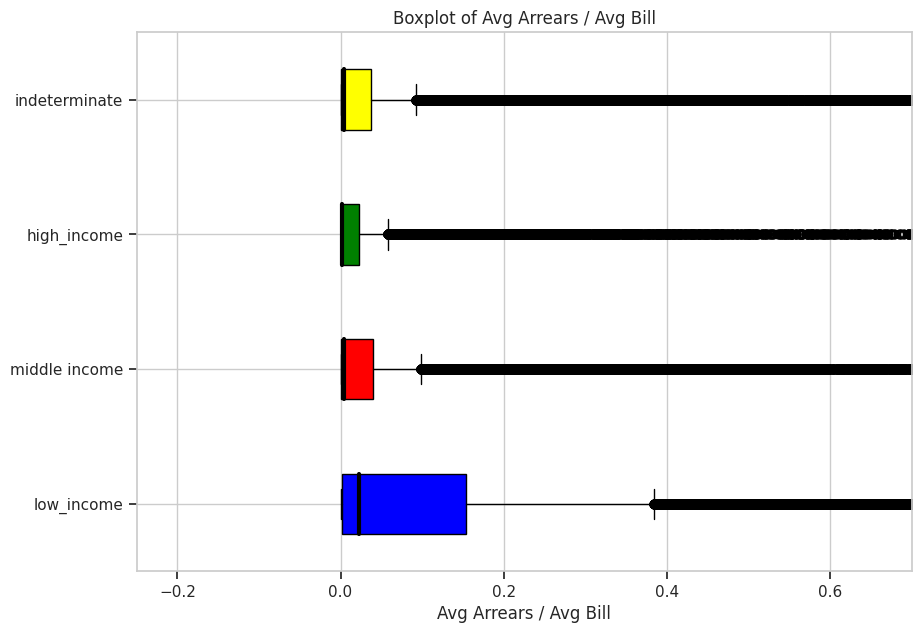

In [145]:
# slide 51

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_arrears_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_arrears_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_arrears_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_arrears_divided_avg_bill'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Arrears / Avg Bill')
# Adding title
plt.title("Boxplot of Avg Arrears / Avg Bill")
plt.xlim(-0.25, 0.7)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

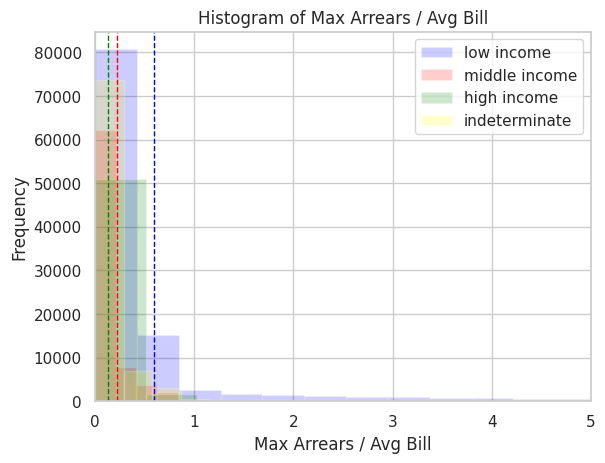

Low income mean: 0.5931072238709112
Low income median: 0.09856581711884535
Low income std. dev: 1.525669223875298
Medium income mean: 0.22007808069274926
Medium income median: 0.02259965391192161
Medium income std. dev: 0.7677352400097087
High income mean: 0.1266676310195366
High income median: 0.006988556040005523
High income std. dev: 0.5304216070928508


In [146]:
# slide 52

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['max_arrears_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['max_arrears_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['max_arrears_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['max_arrears_divided_avg_bill'])

plt.hist(x1, bins = 100, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 100, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 100, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 100, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Max Arrears / Avg Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Max Arrears / Avg Bill')
plt.xlim(0, 5)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

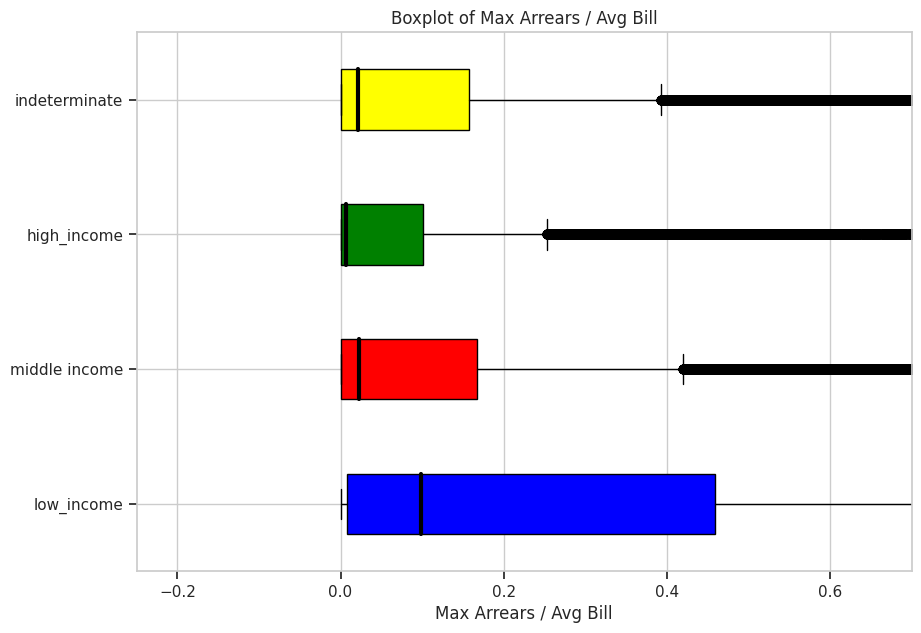

In [147]:
# slide 52

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['max_arrears_divided_avg_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['max_arrears_divided_avg_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['max_arrears_divided_avg_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['max_arrears_divided_avg_bill'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Max Arrears / Avg Bill')
# Adding title
plt.title("Boxplot of Max Arrears / Avg Bill")
plt.xlim(-0.25, 0.7)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

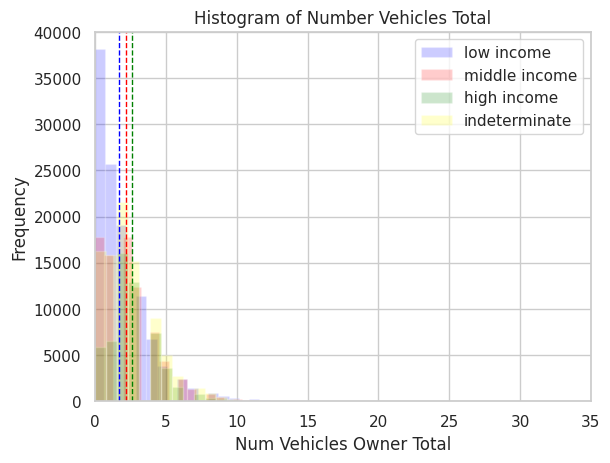

Low income mean: 1.7127659574468086
Low income median: 1.0
Low income std. dev: 2.0177745485347103
Medium income mean: 2.2226071305291186
Medium income median: 2.0
Medium income std. dev: 2.0262509401550832
High income mean: 2.639449045732805
High income median: 2.0
High income std. dev: 1.742109983252676


In [148]:
# slide 54

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['num_vehicles_owner_total'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['num_vehicles_owner_total'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['num_vehicles_owner_total'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['num_vehicles_owner_total'])

plt.hist(x1, bins = 40, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 40, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 40, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 40, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Num Vehicles Owner Total')
plt.ylabel('Frequency')
plt.title('Histogram of Number Vehicles Total')
plt.xlim(0, 35)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

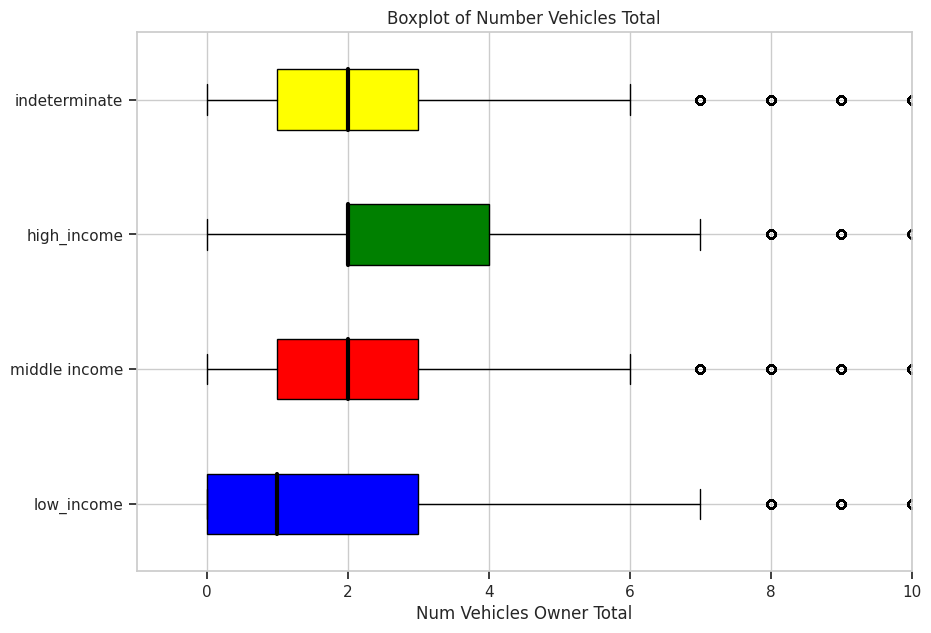

In [149]:
# slide 54

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['num_vehicles_owner_total'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['num_vehicles_owner_total'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['num_vehicles_owner_total'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['num_vehicles_owner_total'])
data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Num Vehicles Owner Total')
# Adding title
plt.title("Boxplot of Number Vehicles Total")
plt.xlim(-1, 10)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

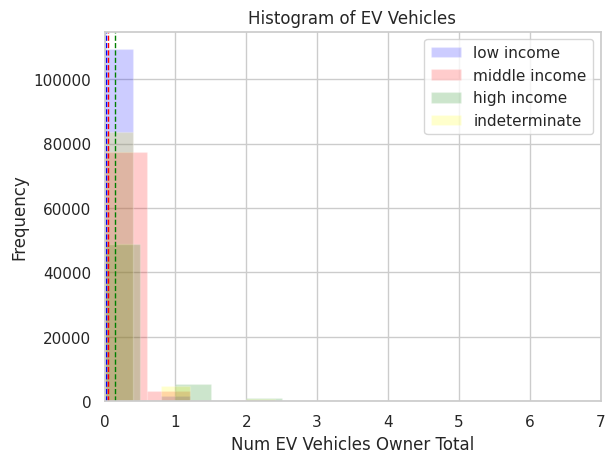

Low income mean: 0.016448375880519575
Low income median: 0.0
Low income std. dev: 0.1392286951637929
Medium income mean: 0.05361457665565363
Medium income median: 0.0
Medium income std. dev: 0.2563323526981182
High income mean: 0.14558876485415917
High income median: 0.0
High income std. dev: 0.4277628795907032


In [150]:
# slide 55

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['num_EV_vehicles_owner_total'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['num_EV_vehicles_owner_total'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['num_EV_vehicles_owner_total'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['num_EV_vehicles_owner_total'])

plt.hist(x1, bins = 10, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 10, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 10, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 10, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Num EV Vehicles Owner Total')
plt.ylabel('Frequency')
plt.title('Histogram of EV Vehicles')
plt.xlim(0, 7)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

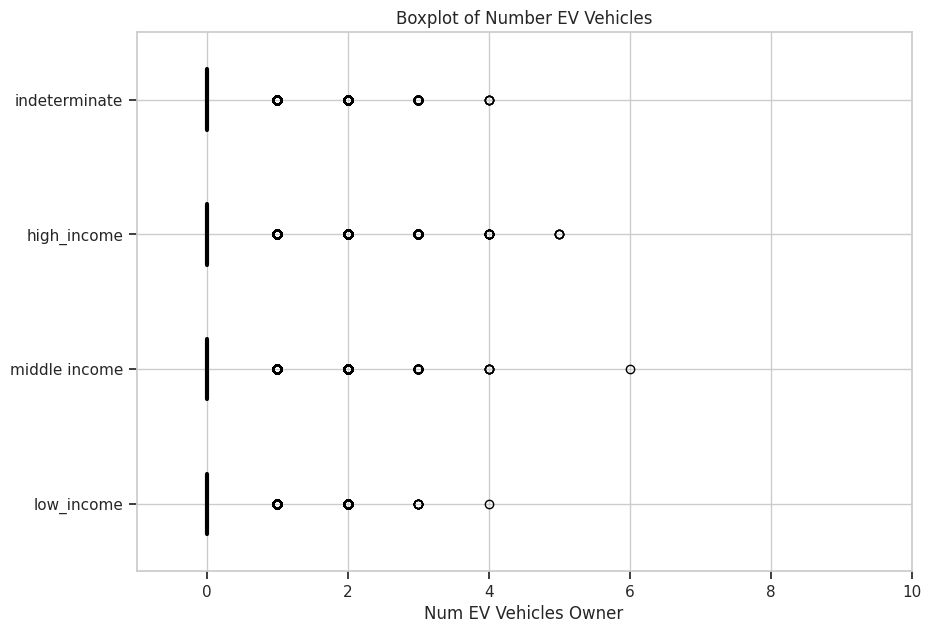

In [151]:
# slide 55

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Num EV Vehicles Owner')
# Adding title
plt.title("Boxplot of Number EV Vehicles")
plt.xlim(-1, 10)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

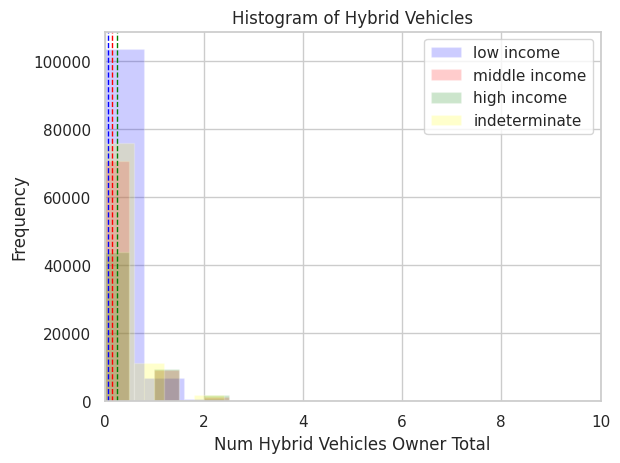

Low income mean: 0.07726052569946133
Low income median: 0.0
Low income std. dev: 0.3059916038271819
Medium income mean: 0.15019231717540313
Medium income median: 0.0
Medium income std. dev: 0.41770932055825316
High income mean: 0.24958588404753332
High income median: 0.0
High income std. dev: 0.5299839391804403


In [152]:
# slide 56

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['num_hybrid_vehicles_owner_total'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['num_hybrid_vehicles_owner_total'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['num_hybrid_vehicles_owner_total'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['num_hybrid_vehicles_owner_total'])

# print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 10, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 10, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 10, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 10, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Num Hybrid Vehicles Owner Total')
plt.ylabel('Frequency')
plt.title('Histogram of Hybrid Vehicles')
plt.xlim(0, 10)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

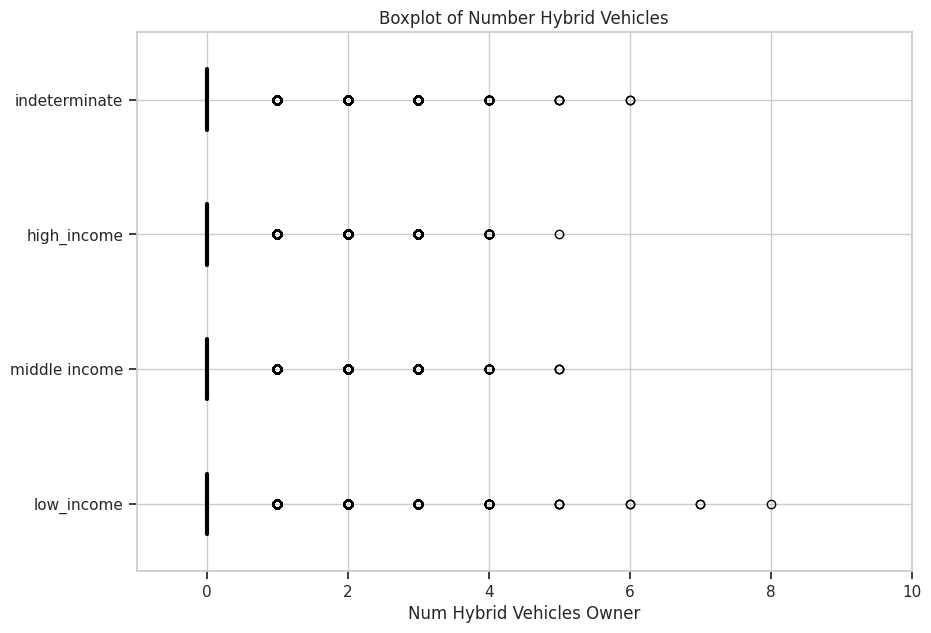

In [153]:
# slide 56

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Num Hybrid Vehicles Owner')
# Adding title
plt.title("Boxplot of Number Hybrid Vehicles")
plt.xlim(-1, 10)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

29


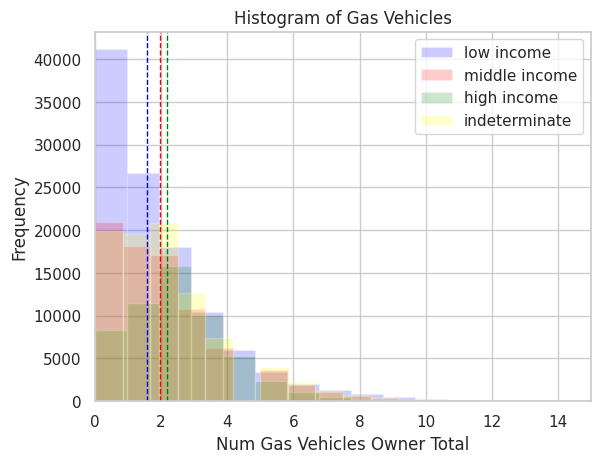

Low income mean: 1.5693966526744374
Low income median: 1.0
Low income std. dev: 1.918664443436531
Medium income mean: 1.966800631194832
Medium income median: 2.0
Medium income std. dev: 1.9330591595022142
High income mean: 2.189593086064098
High income median: 2.0
High income std. dev: 1.674791302139169


In [154]:
# slide 57

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['num_gas_vehicles_owner_total'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['num_gas_vehicles_owner_total'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['num_gas_vehicles_owner_total'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['num_gas_vehicles_owner_total'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 30, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 30, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 30, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 30, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Num Gas Vehicles Owner Total')
plt.ylabel('Frequency')
plt.title('Histogram of Gas Vehicles')
plt.xlim(0, 15)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

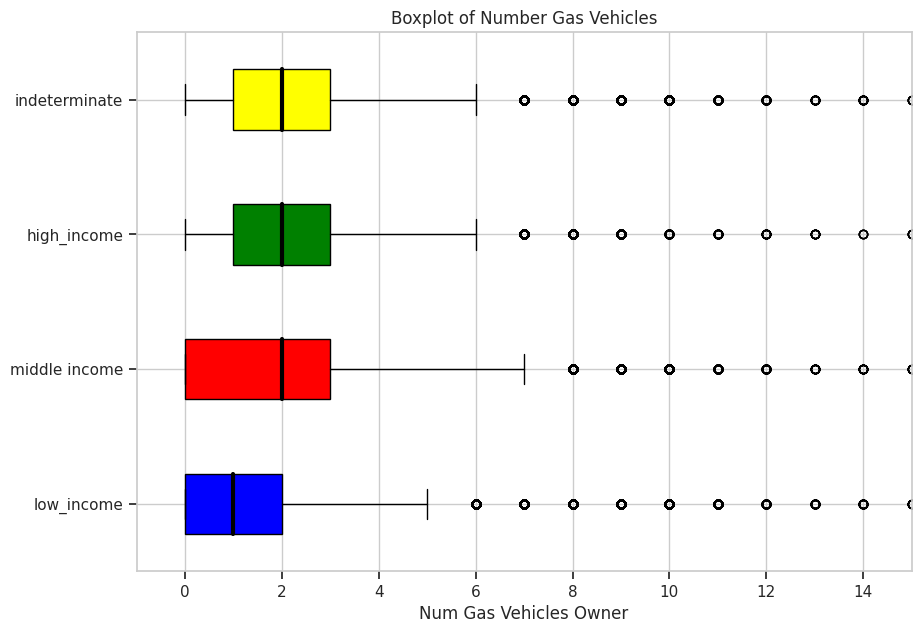

In [155]:
# slide 57

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Num Gas Vehicles Owner')
# Adding title
plt.title("Boxplot of Number Gas Vehicles")
plt.xlim(-1, 15)
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

143569915.0


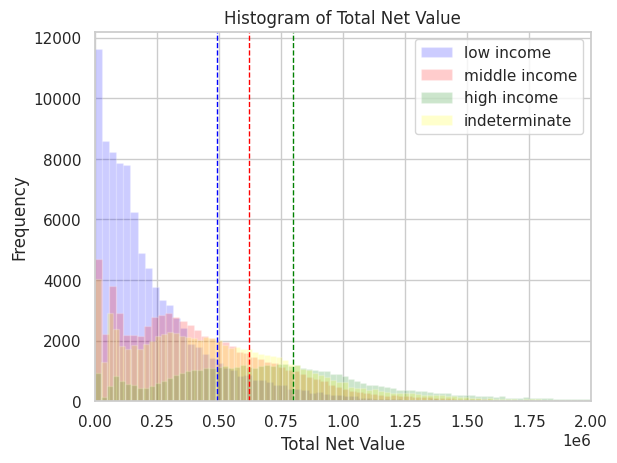

Low income mean: 493741.22425089235
Low income median: 157916.78048780488
Low income std. dev: 4744093.0185905155
Medium income mean: 622266.4421312972
Medium income median: 360911.5
Medium income std. dev: 4390149.720274347
High income mean: 798704.1961312569
High income median: 709096.5
High income std. dev: 1420711.4418304123


In [156]:
# slide 59

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['TotalNetValue'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['TotalNetValue'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['TotalNetValue'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['TotalNetValue'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 5000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 5000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 5000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 5000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Total Net Value')
plt.ylabel('Frequency')
plt.title('Histogram of Total Net Value')
plt.xlim(0, 2000000)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

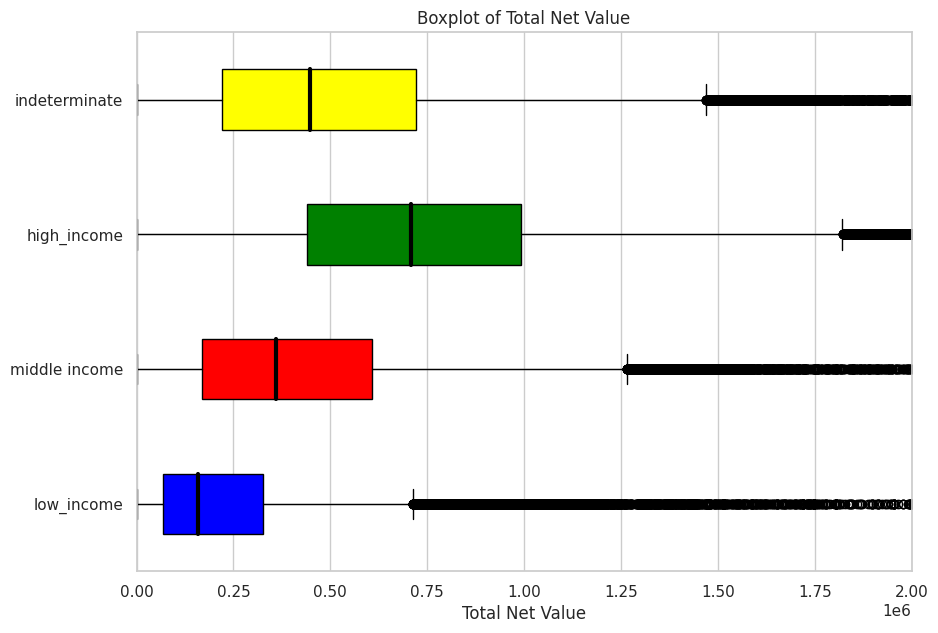

In [157]:
# slide 59

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['TotalNetValue'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['TotalNetValue'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['TotalNetValue'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['TotalNetValue'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Total Net Value')
# # Adding title
plt.title("Boxplot of Total Net Value")
plt.xlim(-50, 2000000)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

6351161.0


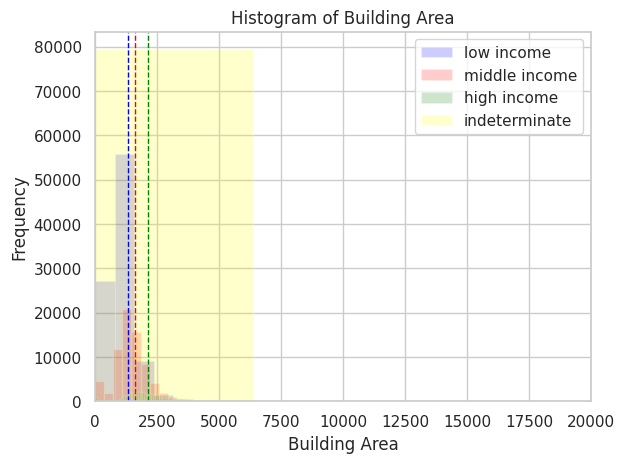

Low income mean: 1312.5343603742253
Low income median: 971.5
Low income std. dev: 7915.542465017438
Medium income mean: 1608.8574045895948
Medium income median: 1407.0
Medium income std. dev: 4796.977112520832
High income mean: 2155.8212237807743
High income median: 2000.0
High income std. dev: 1050.4606122619423


In [158]:
# slide 60

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['BuildingArea'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['BuildingArea'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['BuildingArea'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['BuildingArea'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 1000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 1000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 1000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 1000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Building Area')
plt.ylabel('Frequency')
plt.title('Histogram of Building Area')
plt.xlim(0, 20000)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

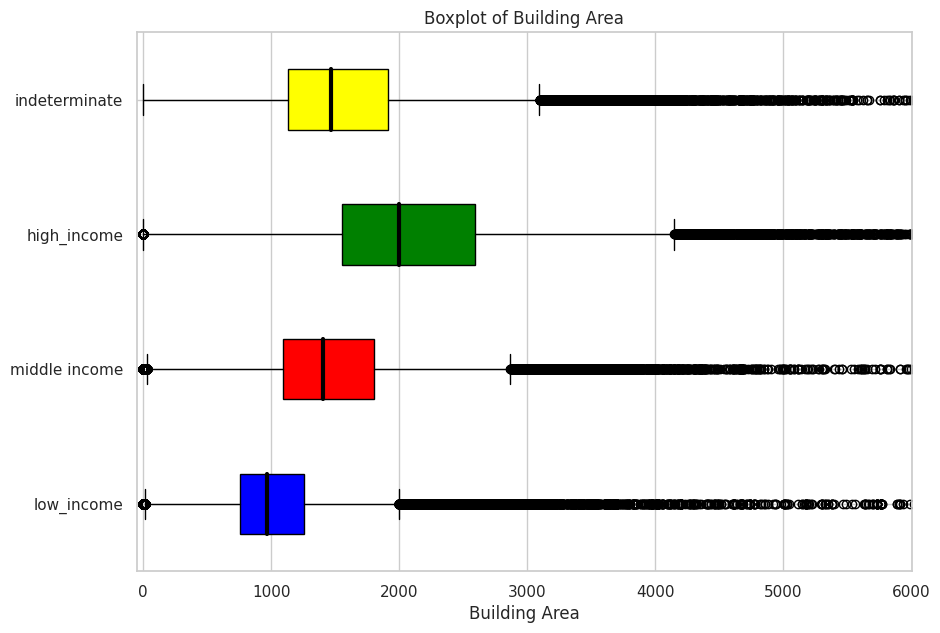

In [159]:
# slide 60

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['BuildingArea'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['BuildingArea'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['BuildingArea'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['BuildingArea'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Building Area')
# # Adding title
plt.title("Boxplot of Building Area")
plt.xlim(-50, 6000)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

9277844.0


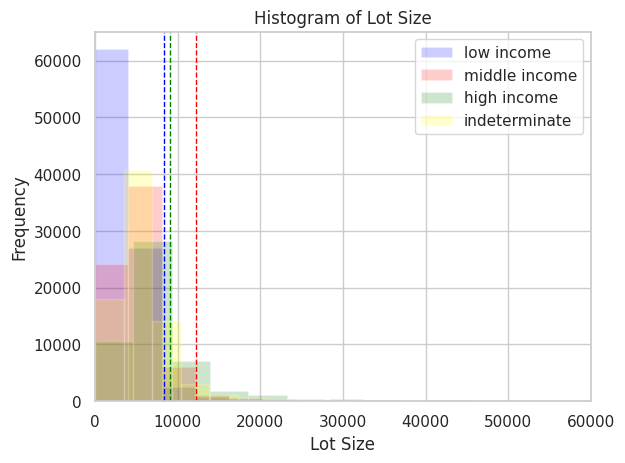

Low income mean: 8366.017147194052
Low income median: 2575.0
Low income std. dev: 142089.90133344656
Medium income mean: 12187.254594136282
Medium income median: 5200.0
Medium income std. dev: 145811.5647914621
High income mean: 9103.920201579562
High income median: 6600.0
High income std. dev: 52675.189587516266


In [160]:
# slide 61

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['LotSize'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['LotSize'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['LotSize'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['LotSize'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 2000, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 2000, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 2000, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 2000, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Lot Size')
plt.ylabel('Frequency')
plt.title('Histogram of Lot Size')
plt.xlim(0, 60000)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

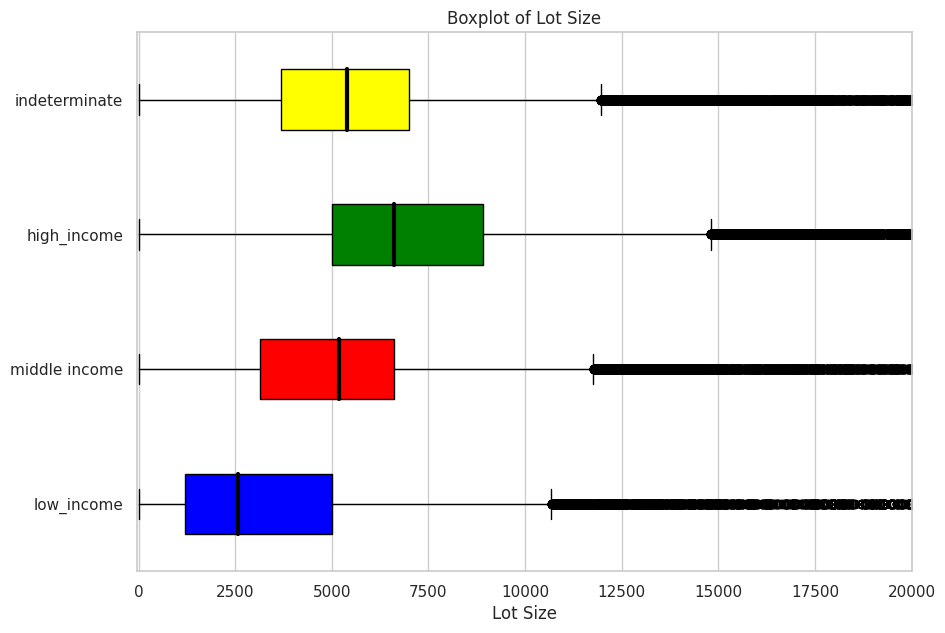

In [161]:
# slide 61

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['LotSize'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['LotSize'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['LotSize'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['LotSize'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Lot Size')
# # Adding title
plt.title("Boxplot of Lot Size")
plt.xlim(-50, 20000)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

33.0


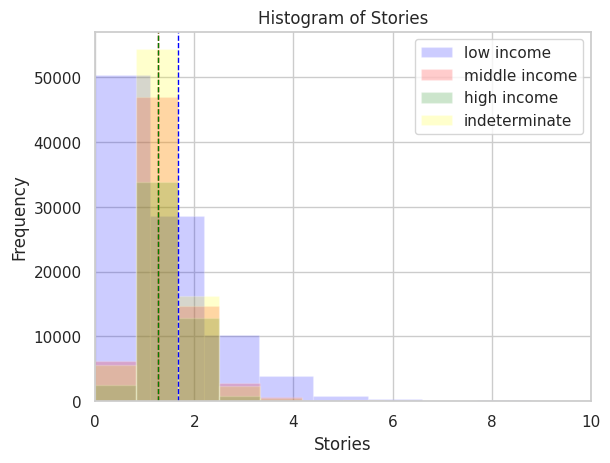

Low income mean: 1.666497810141945
Low income median: 1.0
Low income std. dev: 1.3150211968738328
Medium income mean: 1.2741472522572734
Medium income median: 1.0
Medium income std. dev: 1.0172349418541262
High income mean: 1.2704540947848504
High income median: 1.0
High income std. dev: 0.7604683086153408


In [162]:
# slide 62

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Stories'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Stories'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Stories'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Stories'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 30, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 30, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 30, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 30, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Stories')
plt.ylabel('Frequency')
plt.title('Histogram of Stories')
plt.xlim(0, 10)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

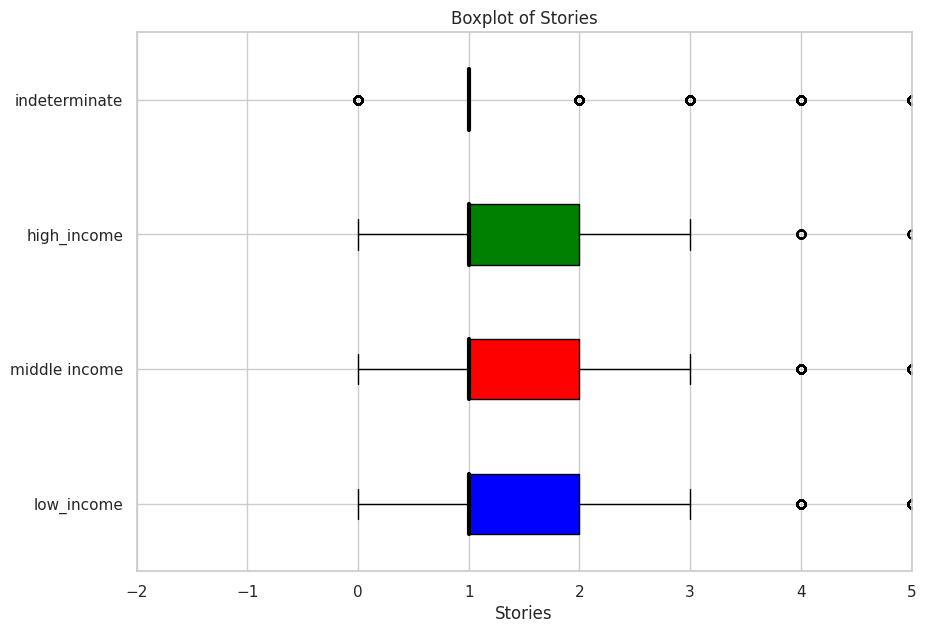

In [163]:
# slide 62

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Stories'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Stories'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Stories'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Stories'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Stories')
# # Adding title
plt.title("Boxplot of Stories")
plt.xlim(-2, 5)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

973.0


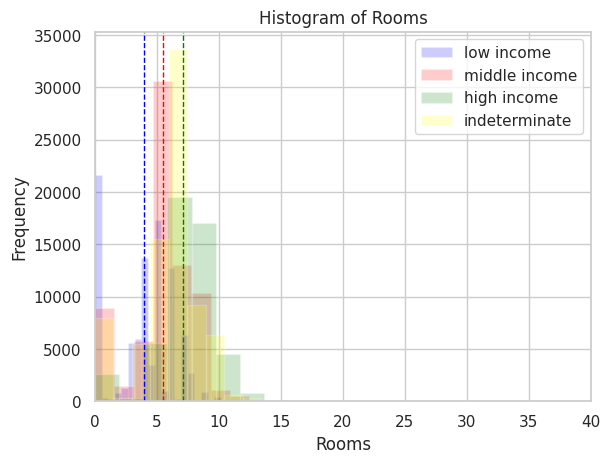

Low income mean: 3.964539747354439
Low income median: 4.0
Low income std. dev: 5.477152180760609
Medium income mean: 5.518042928102896
Medium income median: 6.0
Medium income std. dev: 5.304791757366557
High income mean: 7.120053092059385
High income median: 7.0
High income std. dev: 5.285661192144495


In [164]:
# slide 63

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Rooms'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Rooms'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Rooms'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Rooms'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Rooms')
plt.ylabel('Frequency')
plt.title('Histogram of Rooms')
plt.xlim(0, 40)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

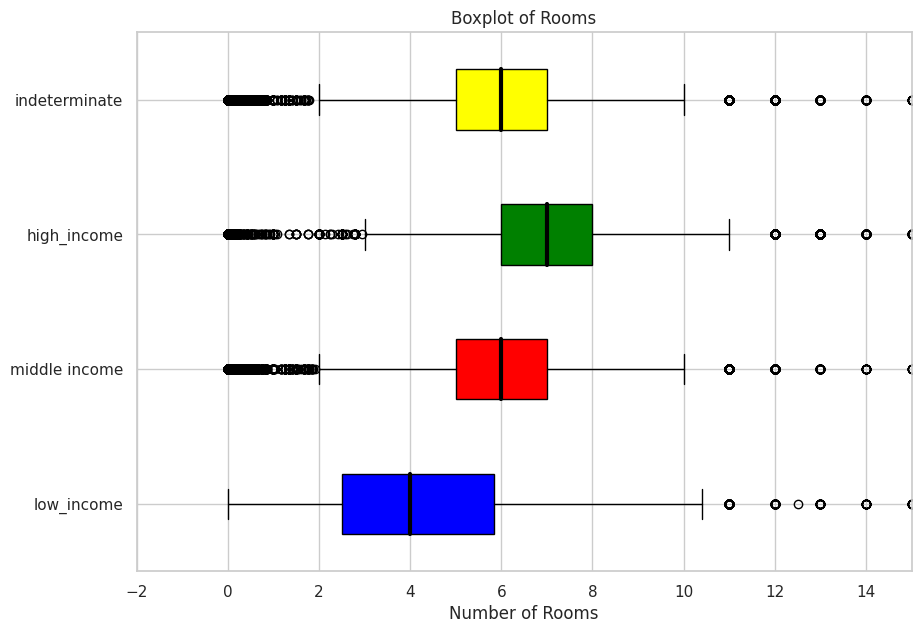

In [165]:
# slide 63

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Rooms'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Rooms'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Rooms'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Rooms'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Number of Rooms')
# # Adding title
plt.title("Boxplot of Rooms")
plt.xlim(-2, 15)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

975.0


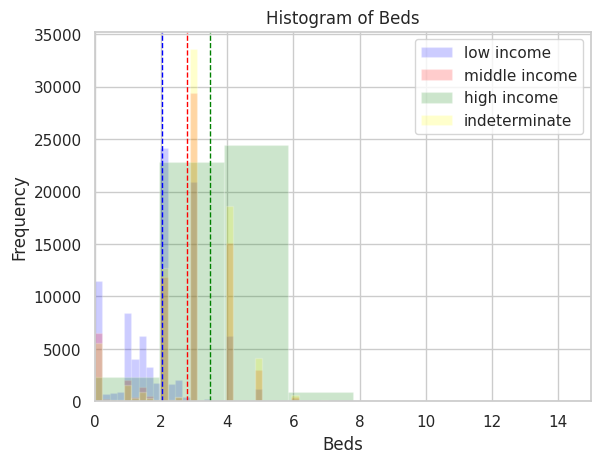

Low income mean: 2.02688930741421
Low income median: 2.0
Low income std. dev: 2.313575339234188
Medium income mean: 2.7753900515505268
Medium income median: 3.0
Medium income std. dev: 1.851782048686347
High income mean: 3.475408514463526
High income median: 4.0
High income std. dev: 4.531799585731279


In [166]:
# slide 64

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Beds'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Beds'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Beds'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Beds'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Beds')
plt.ylabel('Frequency')
plt.title('Histogram of Beds')
plt.xlim(0, 15)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

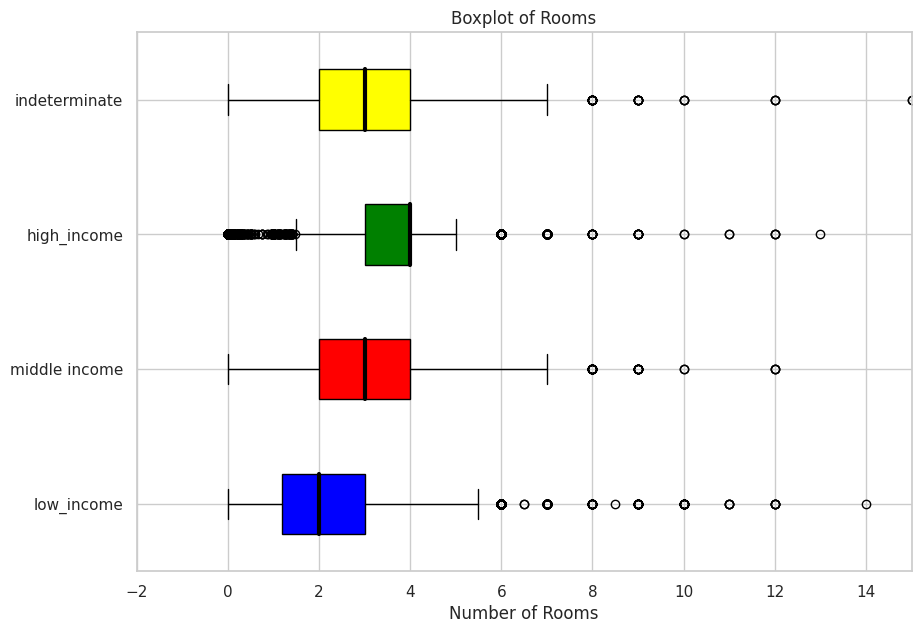

In [167]:
# slide 64

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Beds'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Beds'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Beds'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Beds'])

x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Number of Rooms')
# # Adding title
plt.title("Boxplot of Rooms")
plt.xlim(-2, 15)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

555.5


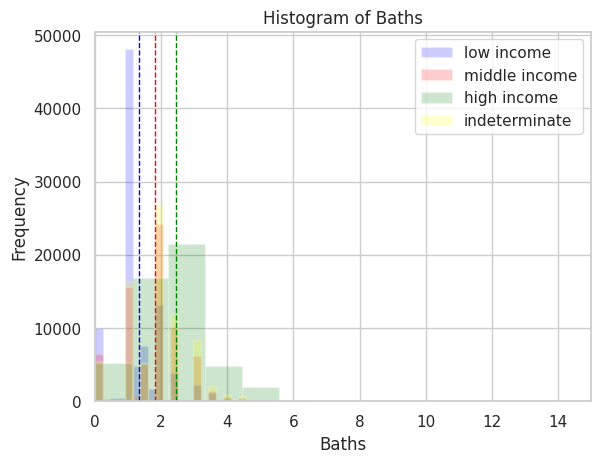

Low income mean: 1.3155932774708532
Low income median: 1.0
Low income std. dev: 2.189421587256552
Medium income mean: 1.8072349869054976
Medium income median: 2.0
Medium income std. dev: 1.681094525016957
High income mean: 2.4487823741977257
High income median: 2.5
High income std. dev: 2.753582634576867


In [168]:
# slide 65

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Baths'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Baths'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Baths'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Baths'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Baths')
plt.ylabel('Frequency')
plt.title('Histogram of Baths')
plt.xlim(0, 15)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

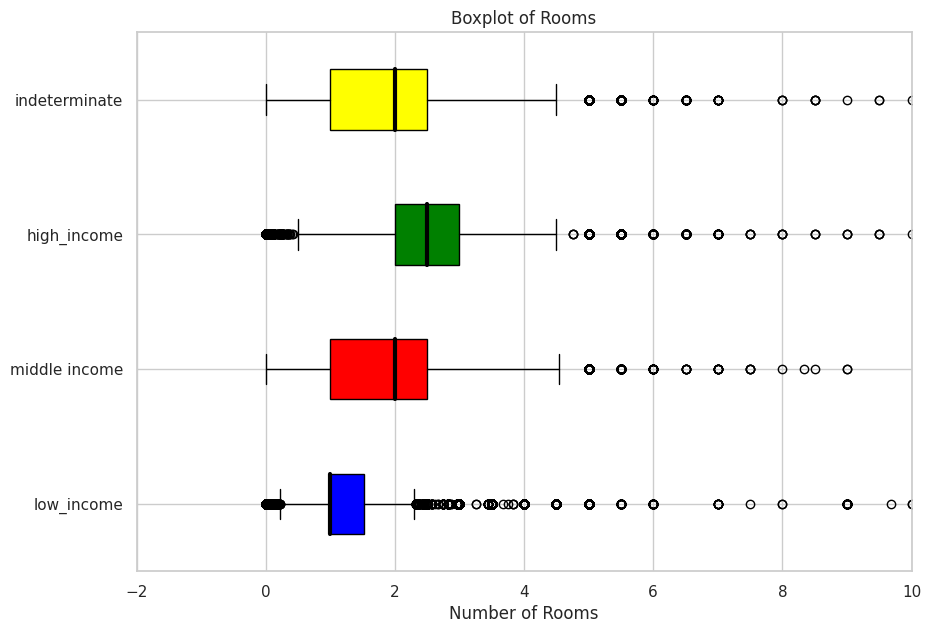

In [169]:
# slide 65

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['Baths'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['Baths'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['Baths'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['Baths'])


x1 = [x for x in x1 if x == x]
x2 = [x for x in x2 if x == x]
x3 = [x for x in x3 if x == x]
x4 = [x for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Number of Rooms')
# # Adding title
plt.title("Boxplot of Rooms")
plt.xlim(-2, 10)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

65.03


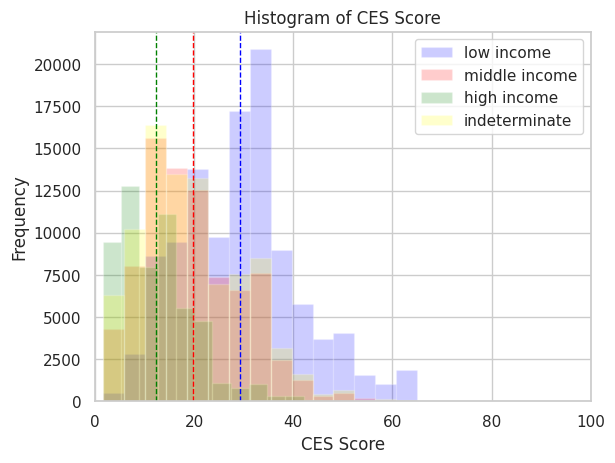

Low income mean: 29.182659898384887
Low income median: 29.48
Low income std. dev: 11.735773893502842
Medium income mean: 19.689330470185197
Medium income median: 18.3
Medium income std. dev: 9.8815200185265
High income mean: 12.294670248173068
High income median: 11.25
High income std. dev: 7.62934038828414


In [170]:
# slide 67

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['ces_score'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['ces_score'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['ces_score'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['ces_score'])

res = []
for val in x1:
    if val != None and val != 'NA':
        res.append(val)
x1 = res
res = []
for val in x2:
    if val != None and val != 'NA' :
        res.append(val)
x2 = res
res = []
for val in x3:
    if val != None and val != 'NA':
        res.append(val)
x3 = res
res = []
for val in x4:
    if val != None and val != 'NA':
        res.append(val)
x4 = res


x1 = [float(x) for x in x1 if x == x]
x2 = [float(x) for x in x2 if x == x]
x3 = [float(x) for x in x3 if x == x]
x4 = [float(x) for x in x4 if x == x]
print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 15, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 15, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 15, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 15, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('CES Score')
plt.ylabel('Frequency')
plt.title('Histogram of CES Score')
plt.xlim(0, 100)
plt.legend()

plt.axvline(np.nanmean(x1), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x2), color='red', linestyle='dashed', linewidth=1)
plt.axvline(np.nanmean(x3), color='green', linestyle='dashed', linewidth=1)

plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

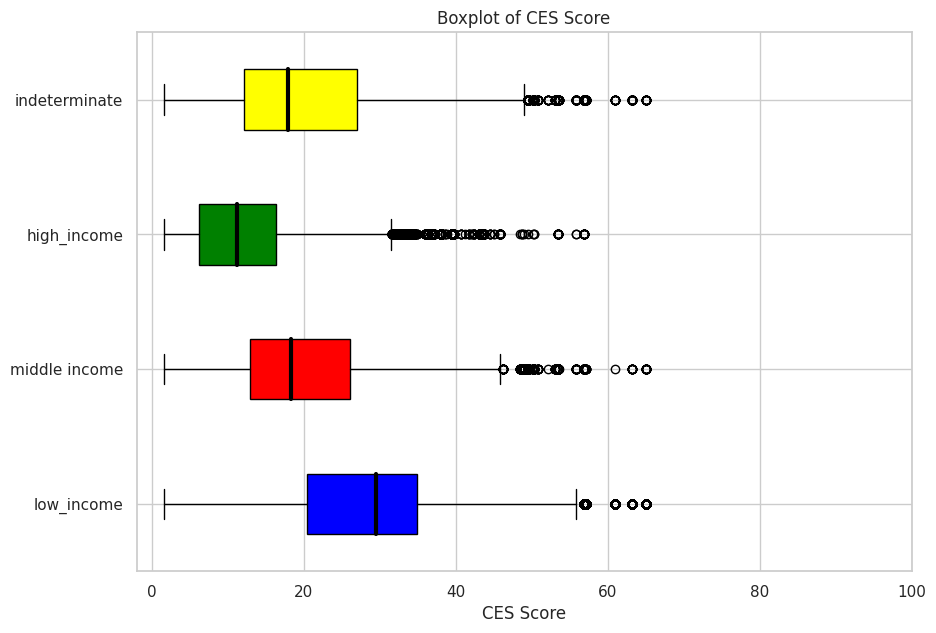

In [171]:
# slide 67

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['ces_score'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['ces_score'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['ces_score'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['ces_score'])

res = []
for val in x1:
    if val != None and val != 'NA':
        res.append(val)
x1 = res
res = []
for val in x2:
    if val != None and val != 'NA' :
        res.append(val)
x2 = res
res = []
for val in x3:
    if val != None and val != 'NA':
        res.append(val)
x3 = res
res = []
for val in x4:
    if val != None and val != 'NA':
        res.append(val)
x4 = res


x1 = [float(x) for x in x1 if x == x]
x2 = [float(x) for x in x2 if x == x]
x3 = [float(x) for x in x3 if x == x]
x4 = [float(x) for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('CES Score')
# # Adding title
plt.title("Boxplot of CES Score")
plt.xlim(-2, 100)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

TypeError: boolean value of NA is ambiguous

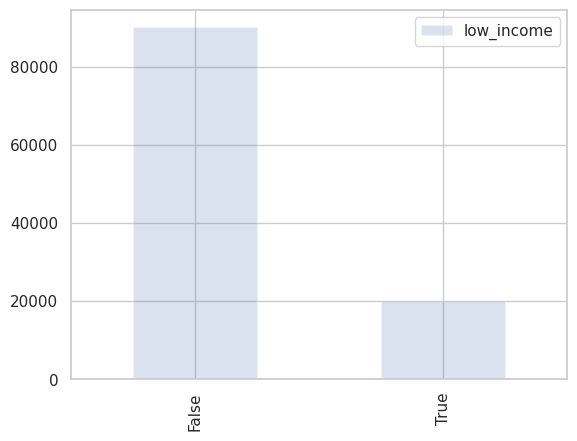

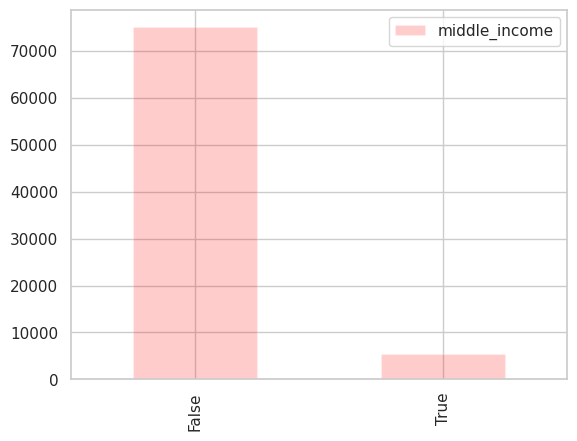

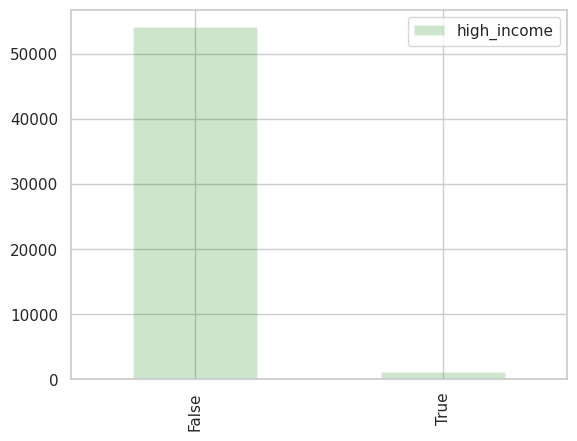

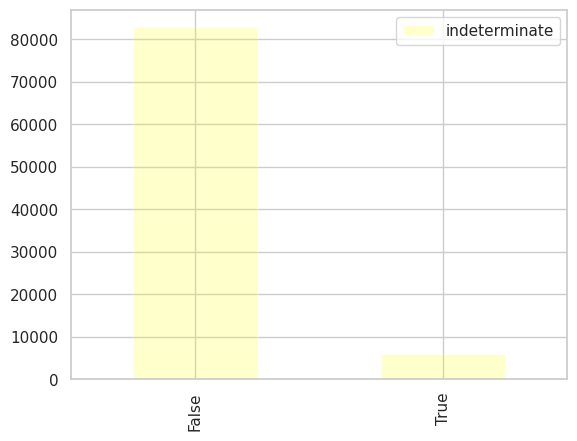

In [172]:
# slide 69

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['dac_flag'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['dac_flag'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['dac_flag'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['dac_flag'])

df = pd.DataFrame({'low_income':x1})
df1 = df.apply(pd.value_counts)
df1.plot.bar(alpha=0.2)

df = pd.DataFrame({'middle_income':x2})
df2 = df.apply(pd.value_counts)
df2.plot.bar(color="red", alpha=0.2)

df = pd.DataFrame({'high_income':x3})
df3 = df.apply(pd.value_counts)
df3.plot.bar(color="green", alpha=0.2)

df = pd.DataFrame({'indeterminate':x4})
df4 = df.apply(pd.value_counts)
df4.plot.bar(color="yellow", alpha=0.2)

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

<AxesSubplot:>

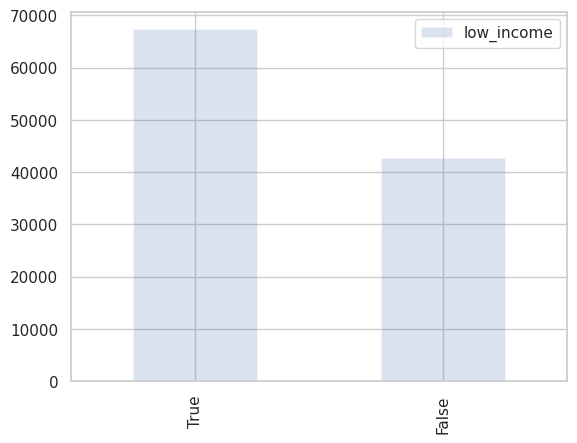

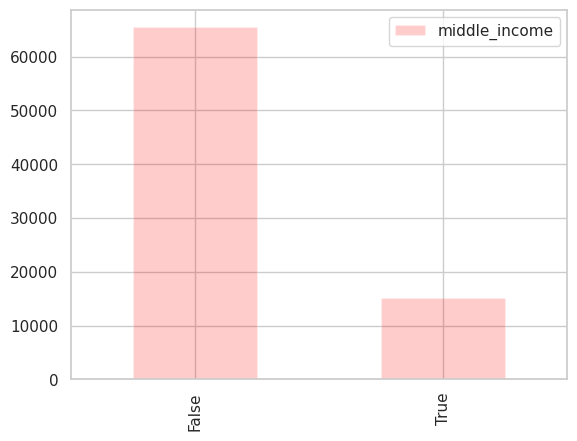

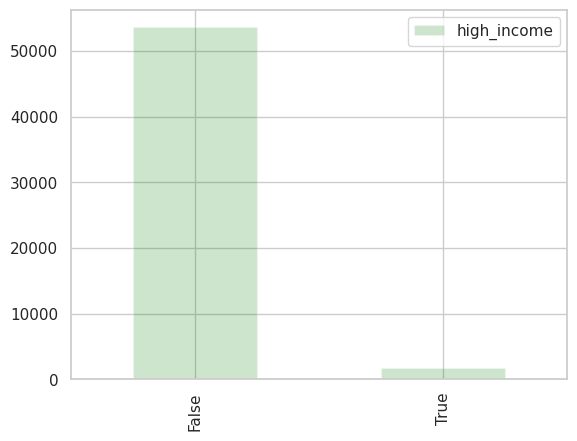

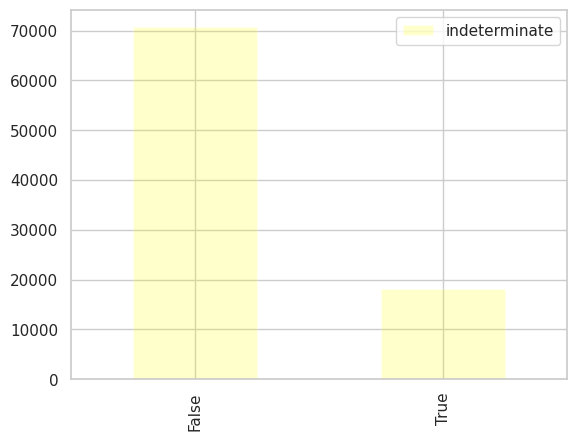

In [173]:
# slide 70

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['low_income_flag'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['low_income_flag'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['low_income_flag'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['low_income_flag'])

df = pd.DataFrame({'low_income':x1})
df1 = df.apply(pd.value_counts)
df1.plot.bar(alpha=0.2)

df = pd.DataFrame({'middle_income':x2})
df2 = df.apply(pd.value_counts)
df2.plot.bar(color="red", alpha=0.2)

df = pd.DataFrame({'high_income':x3})
df3 = df.apply(pd.value_counts)
df3.plot.bar(color="green", alpha=0.2)

df = pd.DataFrame({'indeterminate':x4})
df4 = df.apply(pd.value_counts)
df4.plot.bar(color="yellow", alpha=0.2)

<AxesSubplot:>

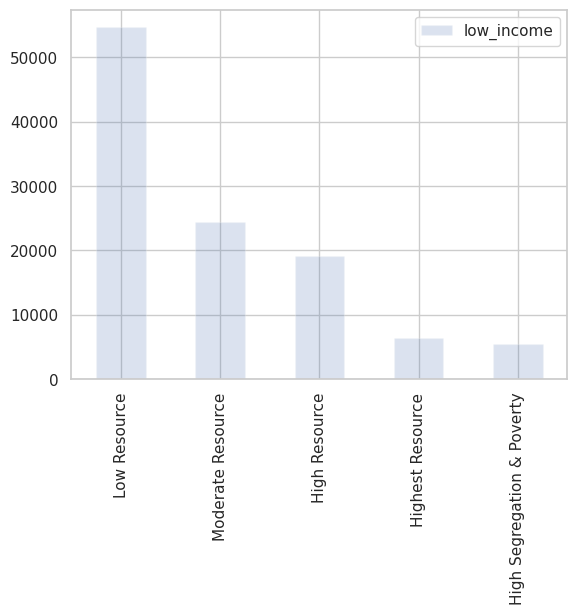

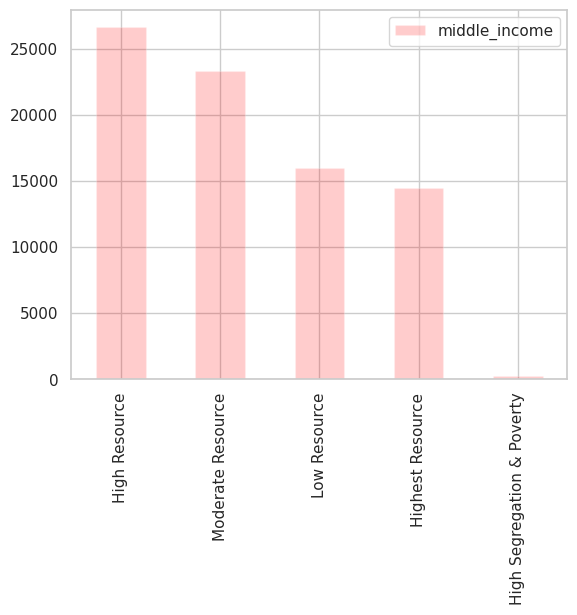

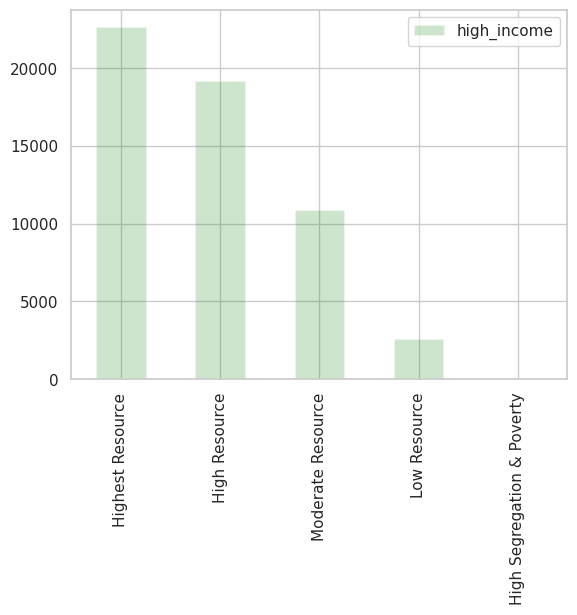

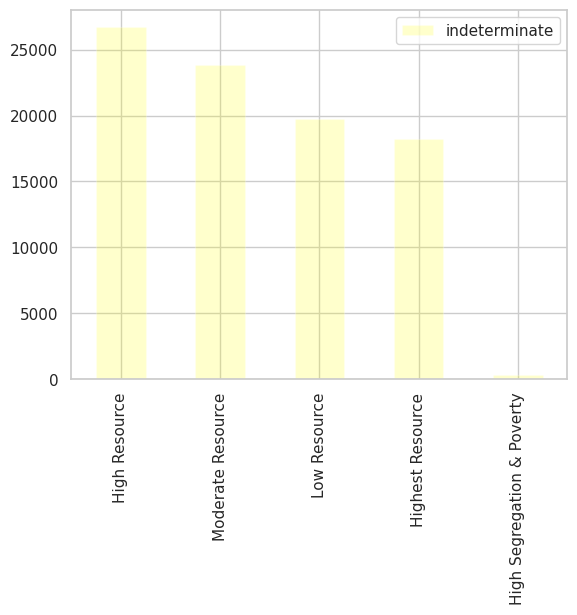

In [174]:
# slide 72, 73

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['opportunity_flag'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['opportunity_flag'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['opportunity_flag'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['opportunity_flag'])

df = pd.DataFrame({'low_income':x1})
df1 = df.apply(pd.value_counts)
df1.plot.bar(alpha=0.2)

df = pd.DataFrame({'middle_income':x2})
df2 = df.apply(pd.value_counts)
df2.plot.bar(color="red", alpha=0.2)

df = pd.DataFrame({'high_income':x3})
df3 = df.apply(pd.value_counts)
df3.plot.bar(color="green", alpha=0.2)

df = pd.DataFrame({'indeterminate':x4})
df4 = df.apply(pd.value_counts)
df4.plot.bar(color="yellow", alpha=0.2)

94022.72727272728


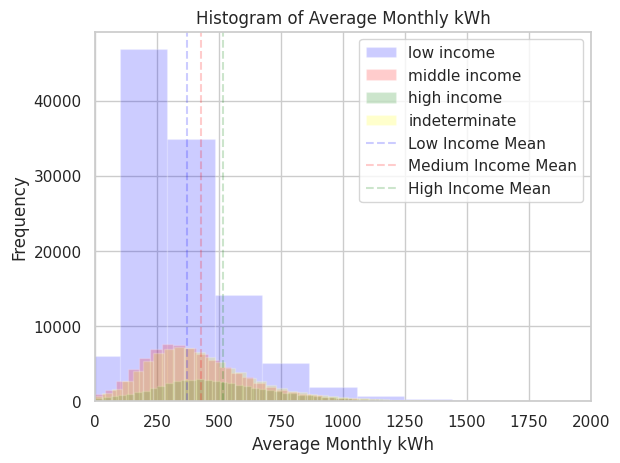

Low income mean: 371.8366793703451
Low income median: 300.09204117647056
Low income std. dev: 592.9259172974516
Medium income mean: 428.9448308245913
Medium income median: 375.24737254901964
Medium income std. dev: 455.8033108673985
High income mean: 514.9818787116905
High income median: 470.5339568627451
High income std. dev: 361.6899181182304


In [175]:
# slide 41

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_monthly_kwh'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_monthly_kwh'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_monthly_kwh'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_monthly_kwh'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Average Monthly kWh')
plt.ylabel('Frequency')
plt.title('Histogram of Average Monthly kWh')
plt.xlim(0, 2000)

plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

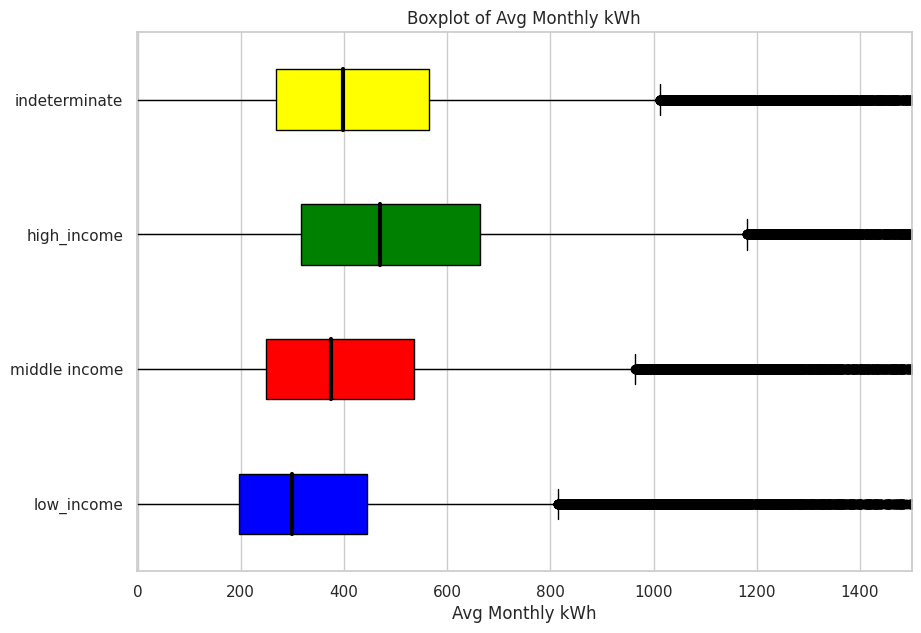

In [176]:
# slide 41

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_monthly_kwh'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_monthly_kwh'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_monthly_kwh'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_monthly_kwh'])

# res = []
# for val in x1:
#     if val != None and val != 'NA':
#         res.append(val)
# x1 = res
# res = []
# for val in x2:
#     if val != None and val != 'NA' :
#         res.append(val)
# x2 = res
# res = []
# for val in x3:
#     if val != None and val != 'NA':
#         res.append(val)
# x3 = res
# res = []
# for val in x4:
#     if val != None and val != 'NA':
#         res.append(val)
# x4 = res


x1 = [float(x) for x in x1 if x == x]
x2 = [float(x) for x in x2 if x == x]
x3 = [float(x) for x in x3 if x == x]
x4 = [float(x) for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Monthly kWh')
# # Adding title
plt.title("Boxplot of Avg Monthly kWh")
plt.xlim(-2, 1500)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

133800.0


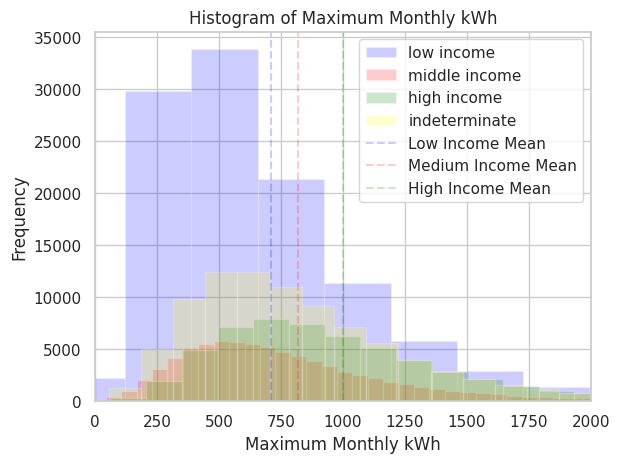

Low income mean: 709.6192341843306
Low income median: 562.785
Low income std. dev: 964.1746335348017
Medium income mean: 816.577560215014
Medium income median: 689.3405
Medium income std. dev: 759.8642142675465
High income mean: 1000.0311083507381
High income median: 885.807
High income std. dev: 674.6090390095951


In [177]:
# slide 42

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['max_monthly_kwh'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['max_monthly_kwh'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['max_monthly_kwh'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['max_monthly_kwh'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Maximum Monthly kWh')
plt.ylabel('Frequency')
plt.title('Histogram of Maximum Monthly kWh')
plt.xlim(0, 2000)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()
print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

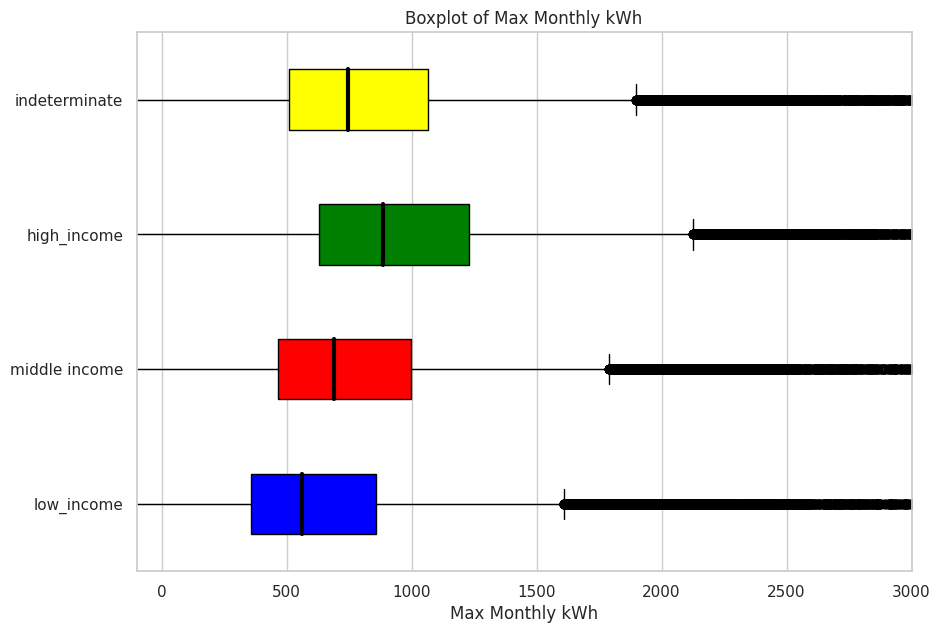

In [178]:
# slide 42

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['max_monthly_kwh'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['max_monthly_kwh'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['max_monthly_kwh'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['max_monthly_kwh'])

# res = []
# for val in x1:
#     if val != None and val != 'NA':
#         res.append(val)
# x1 = res
# res = []
# for val in x2:
#     if val != None and val != 'NA' :
#         res.append(val)
# x2 = res
# res = []
# for val in x3:
#     if val != None and val != 'NA':
#         res.append(val)
# x3 = res
# res = []
# for val in x4:
#     if val != None and val != 'NA':
#         res.append(val)
# x4 = res


x1 = [float(x) for x in x1 if x == x]
x2 = [float(x) for x in x2 if x == x]
x3 = [float(x) for x in x3 if x == x]
x4 = [float(x) for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Max Monthly kWh')
# # Adding title
plt.title("Boxplot of Max Monthly kWh")
plt.xlim(-100, 3000)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

12387.734545454545


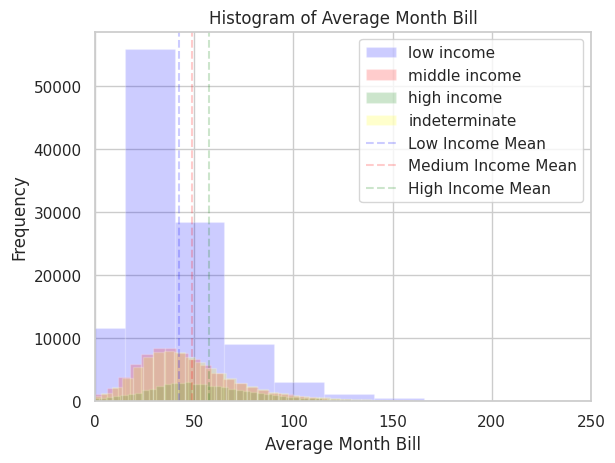

Low income mean: 42.39241834613086
Low income median: 33.82142857142857
Low income std. dev: 69.72568895424385
Medium income mean: 48.6959642665573
Medium income median: 41.940784313725494
Medium income std. dev: 53.283774565703034
High income mean: 57.473501329454606
High income median: 52.335941176470584
High income std. dev: 41.503210882784465


In [179]:
# slide 43

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_month_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_month_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_month_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_month_bill'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Average Month Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Average Month Bill')
plt.xlim(0, 250)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

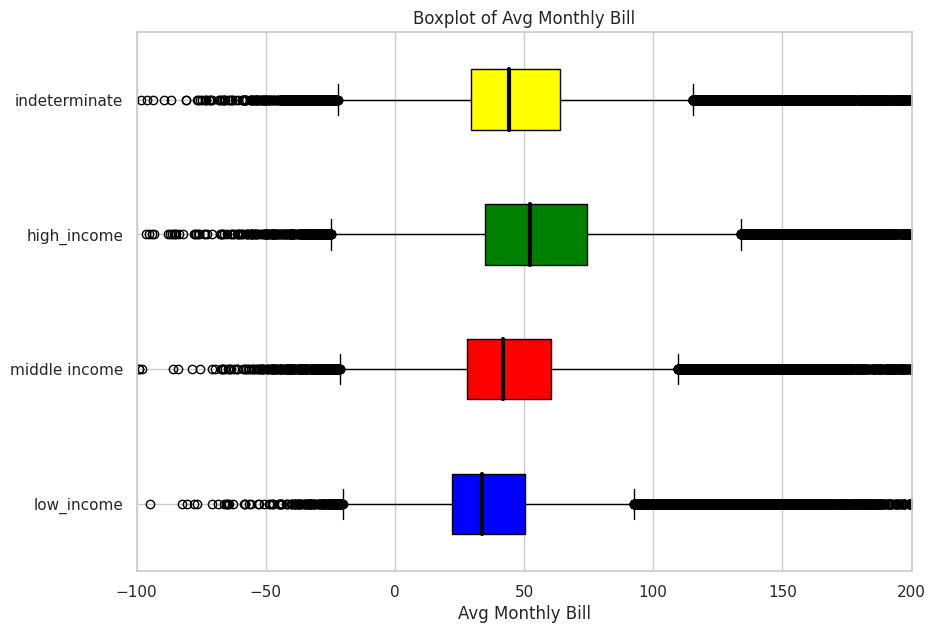

In [180]:
# slide 43

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['avg_month_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['avg_month_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['avg_month_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['avg_month_bill'])

# res = []
# for val in x1:
#     if val != None and val != 'NA':
#         res.append(val)
# x1 = res
# res = []
# for val in x2:
#     if val != None and val != 'NA' :
#         res.append(val)
# x2 = res
# res = []
# for val in x3:
#     if val != None and val != 'NA':
#         res.append(val)
# x3 = res
# res = []
# for val in x4:
#     if val != None and val != 'NA':
#         res.append(val)
# x4 = res


x1 = [float(x) for x in x1 if x == x]
x2 = [float(x) for x in x2 if x == x]
x3 = [float(x) for x in x3 if x == x]
x4 = [float(x) for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Avg Monthly Bill')
# # Adding title
plt.title("Boxplot of Avg Monthly Bill")
plt.xlim(-100, 200)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

18678.140000000003


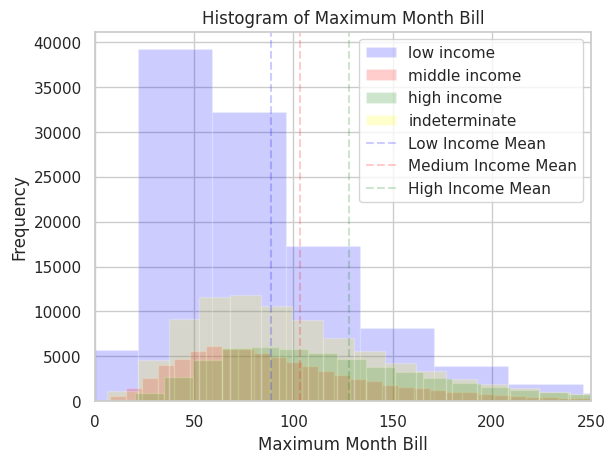

Low income mean: 88.54413937859772
Low income median: 68.93
Low income std. dev: 125.74961101343901
Medium income mean: 103.38781410659467
Medium income median: 85.60000000000001
Medium income std. dev: 100.08516044768193
High income mean: 128.03798901692477
High income median: 111.57
High income std. dev: 86.37087461053267


In [181]:
# slide 44

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['max_month_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['max_month_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['max_month_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['max_month_bill'])

print(max(max(x1), max(x2), max(x3), max(x4)))

plt.hist(x1, bins = 500, alpha = 0.2, color = "blue", label="low income")
plt.hist(x2, bins = 500, alpha = 0.2, color = "red", label="middle income")
plt.hist(x3, bins = 500, alpha = 0.2, color = "green", label="high income")
plt.hist(x4, bins = 500, alpha = 0.2, color = "yellow", label="indeterminate")

plt.xlabel('Maximum Month Bill')
plt.ylabel('Frequency')
plt.title('Histogram of Maximum Month Bill')
plt.xlim(0, 250)
plt.axvline(x=np.nanmean(x1), color='blue', linestyle='--', label='Low Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x2), color='red', linestyle='--', label='Medium Income Mean', alpha = 0.2)
plt.axvline(x=np.nanmean(x3), color='green', linestyle='--', label='High Income Mean', alpha = 0.2)

plt.legend()
plt.show()

print('Low income mean: ' + str(np.nanmean(x1)))
print('Low income median: ' + str(np.nanmedian(x1)))
print('Low income std. dev: ' + str(np.nanstd(x1)))
print('Medium income mean: ' + str(np.nanmean(x2)))
print('Medium income median: ' + str(np.nanmedian(x2)))
print('Medium income std. dev: ' + str(np.nanstd(x2)))
print('High income mean: ' + str(np.nanmean(x3)))
print('High income median: ' + str(np.nanmedian(x3)))
print('High income std. dev: ' + str(np.nanstd(x3)))

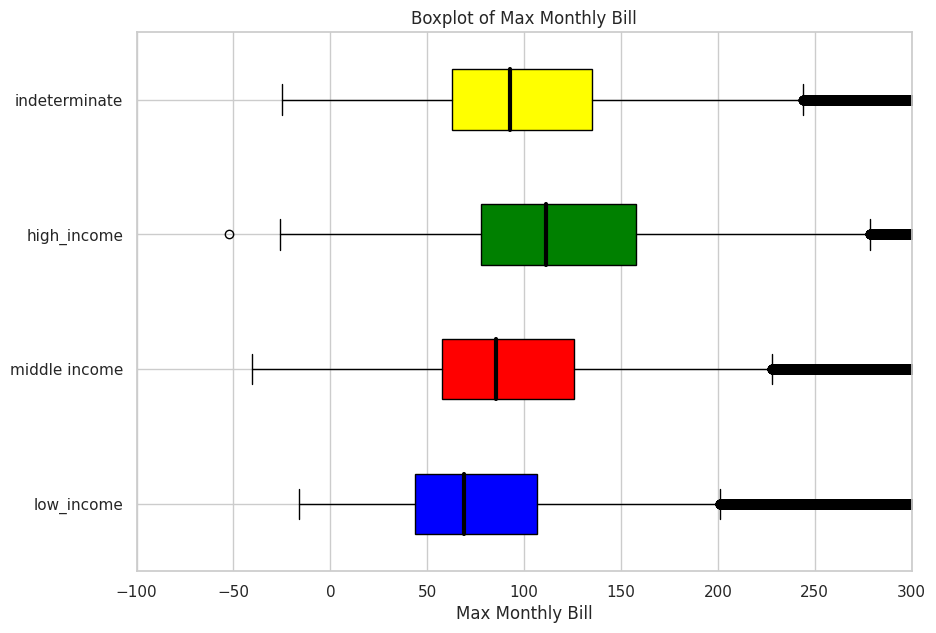

In [182]:
# slide 44

x1 = list(final_non_interval[final_non_interval['income_range'] == "low income"]['max_month_bill'])
x2 = list(final_non_interval[final_non_interval['income_range'] == "middle income"]['max_month_bill'])
x3 = list(final_non_interval[final_non_interval['income_range'] == "high income"]['max_month_bill'])
x4 = list(final_non_interval[final_non_interval['income_range'] == "indeterminate"]['max_month_bill'])

# res = []
# for val in x1:
#     if val != None and val != 'NA':
#         res.append(val)
# x1 = res
# res = []
# for val in x2:
#     if val != None and val != 'NA' :
#         res.append(val)
# x2 = res
# res = []
# for val in x3:
#     if val != None and val != 'NA':
#         res.append(val)
# x3 = res
# res = []
# for val in x4:
#     if val != None and val != 'NA':
#         res.append(val)
# x4 = res


x1 = [float(x) for x in x1 if x == x]
x2 = [float(x) for x in x2 if x == x]
x3 = [float(x) for x in x3 if x == x]
x4 = [float(x) for x in x4 if x == x]

data = [x1, x2, x3, x4]
 
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, vert = 0)
 
colors = ['blue', 'red',
          'green', 'yellow']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

for median in bp['medians']:
    median.set(color ='black',
               linewidth = 3)
     
# # x-axis labels
ax.set_yticklabels(['low_income', 'middle income',
                    'high_income', 'indeterminate'])
plt.xlabel('Max Monthly Bill')
# # Adding title
plt.title("Boxplot of Max Monthly Bill")
plt.xlim(-100, 300)
 
# Removing top axes and right axes
# ticks
# ax.get_xaxis().tick_bottom()
# ax.get_yaxis().tick_left()
     
# show plot
plt.show()

Interval Data Extraction and Preparation

In [41]:
Query = '''
SELECT *
FROM `berkeley-data-discovery-2023.sandbox.interval_data_with_income`
'''

In [42]:
project_id = 'berkeley-data-discovery-2023'
df = gbq.read_gbq(query=Query, dialect ='standard', project_id=project_id)

In [43]:
df

,per_id_proxy,income_range,c_total,c_weekday,c_weekend,c_day,c_morning,c_noon,c_evening,c_night,...,r_morning_over_noon,r_evening_over_noon,r_noon_over_total,r_night_over_day,r_weekday_over_weekend,r_mean_over_max,r_min_over_mean,s_variance,s_diff,s_num_peaks
0,1,middle income,0.520693,0.523133,0.514590,0.613086,0.559060,0.583057,0.702472,0.317232,...,0.958842,1.204808,1.119772,0.517434,1.016602,0.195309,0.249091,0.080498,0.138106,810
1,2,low income,0.702753,0.698614,0.713102,0.715890,0.660821,0.675728,0.793115,0.639111,...,0.977938,1.173718,0.961545,0.892751,0.979684,0.346269,0.098427,0.039440,0.116293,366
2,3,None,0.194747,0.194797,0.194621,0.231330,0.159177,0.294185,0.252184,0.115742,...,0.541077,0.857231,1.510604,0.500333,1.000901,0.069071,0.391278,0.024577,0.071681,728
3,4,middle income,0.272268,0.265712,0.288665,0.296302,0.233150,0.299159,0.304295,0.179893,...,0.779353,1.017171,1.098765,0.607126,0.920486,0.141394,0.325782,0.041149,0.102535,1004
4,5,indeterminate,0.500259,0.493510,0.517138,0.522926,0.436794,0.410892,0.743497,0.366804,...,1.063037,1.809470,0.821359,0.701447,0.954310,0.135315,0.022388,0.170206,0.183633,1064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478200,478185,None,0.690099,0.710575,0.636684,0.380044,0.506958,0.175669,0.651371,1.531242,...,2.885877,3.707949,0.254556,4.029114,1.116057,0.050564,0.000000,2.825172,0.369108,312
478201,478189,low income,0.681247,0.690808,0.657337,0.740731,0.817411,0.763627,0.637556,0.577139,...,1.070432,0.834904,1.120926,0.779148,1.050919,0.303654,0.000000,0.037055,0.111290,421
478202,478193,None,1.669027,1.639075,1.743935,1.441584,1.772254,0.279732,2.436854,1.817933,...,6.335551,8.711399,0.167602,1.261066,0.939871,0.176367,0.000000,1.966903,0.682125,794
478203,478202,None,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0


In [44]:
print(df.columns)

Index(['per_id_proxy', 'income_range', 'c_total', 'c_weekday', 'c_weekend',
       'c_day', 'c_morning', 'c_noon', 'c_evening', 'c_night', 'c_max',
       'c_min', 't_above_half_kwh', 't_above_mean_kwh', 't_above_one_kwh',
       't_above_two_kwh', 'r_morning_over_noon', 'r_evening_over_noon',
       'r_noon_over_total', 'r_night_over_day', 'r_weekday_over_weekend',
       'r_mean_over_max', 'r_min_over_mean', 's_variance', 's_diff',
       's_num_peaks'],
      dtype='object')


In [45]:
df["c_total"].describe()

count    440356.000000
mean          0.591121
std           0.892593
min           0.000000
25%           0.311608
50%           0.490462
75%           0.734981
max         246.056290
Name: c_total, dtype: float64

In [46]:
# delete outliers of |z-score| >= 3 for c_total column
data = df[np.abs(stats.zscore(df["c_total"], nan_policy='omit')) < 3]

In [47]:
data

,per_id_proxy,income_range,c_total,c_weekday,c_weekend,c_day,c_morning,c_noon,c_evening,c_night,...,r_morning_over_noon,r_evening_over_noon,r_noon_over_total,r_night_over_day,r_weekday_over_weekend,r_mean_over_max,r_min_over_mean,s_variance,s_diff,s_num_peaks
0,1,middle income,0.520693,0.523133,0.514590,0.613086,0.559060,0.583057,0.702472,0.317232,...,0.958842,1.204808,1.119772,0.517434,1.016602,0.195309,0.249091,0.080498,0.138106,810
1,2,low income,0.702753,0.698614,0.713102,0.715890,0.660821,0.675728,0.793115,0.639111,...,0.977938,1.173718,0.961545,0.892751,0.979684,0.346269,0.098427,0.039440,0.116293,366
2,3,None,0.194747,0.194797,0.194621,0.231330,0.159177,0.294185,0.252184,0.115742,...,0.541077,0.857231,1.510604,0.500333,1.000901,0.069071,0.391278,0.024577,0.071681,728
3,4,middle income,0.272268,0.265712,0.288665,0.296302,0.233150,0.299159,0.304295,0.179893,...,0.779353,1.017171,1.098765,0.607126,0.920486,0.141394,0.325782,0.041149,0.102535,1004
4,5,indeterminate,0.500259,0.493510,0.517138,0.522926,0.436794,0.410892,0.743497,0.366804,...,1.063037,1.809470,0.821359,0.701447,0.954310,0.135315,0.022388,0.170206,0.183633,1064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478200,478185,None,0.690099,0.710575,0.636684,0.380044,0.506958,0.175669,0.651371,1.531242,...,2.885877,3.707949,0.254556,4.029114,1.116057,0.050564,0.000000,2.825172,0.369108,312
478201,478189,low income,0.681247,0.690808,0.657337,0.740731,0.817411,0.763627,0.637556,0.577139,...,1.070432,0.834904,1.120926,0.779148,1.050919,0.303654,0.000000,0.037055,0.111290,421
478202,478193,None,1.669027,1.639075,1.743935,1.441584,1.772254,0.279732,2.436854,1.817933,...,6.335551,8.711399,0.167602,1.261066,0.939871,0.176367,0.000000,1.966903,0.682125,794
478203,478202,None,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0


In [112]:
indeterminate = data[data["income_range"] == "indeterminate"]
low_income = data[data["income_range"] == "low income"]
mid_income = data[data["income_range"] == "middle income"]
high_income = data[data["income_range"] == "high income"]

Slides 80 and 81: c_total

[Text(0.5, 0, 'c_total'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Average Hourly Energy Usage (kWh)')]

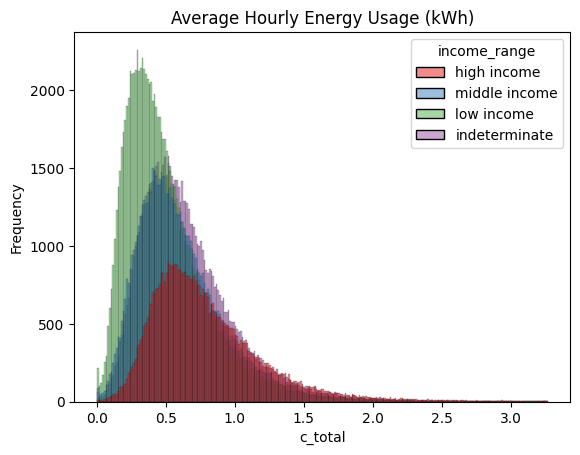

In [50]:
# Slide 80
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_total", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_total", ylabel = "Frequency", title ='Average Hourly Energy Usage (kWh)')

[Text(0.5, 0, 'c_total (kWh)'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'c_total by Income Range')]

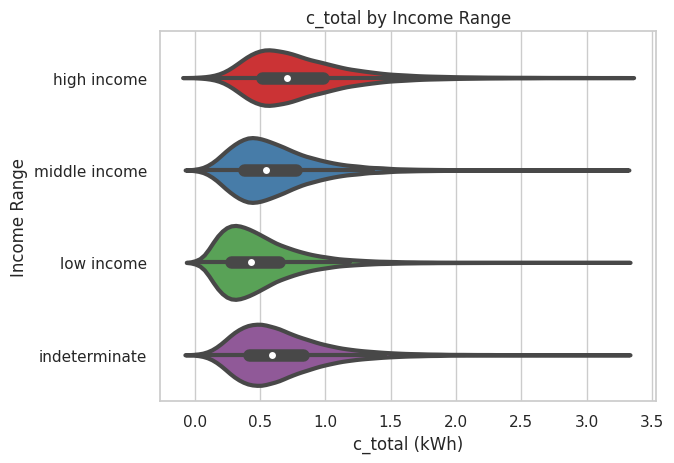

In [135]:
# Slide 80
sns.set(style="whitegrid")
violin = sns.violinplot(x="c_total",y="income_range", data=data, palette="Set1", inner="box", cut=2, linewidth=3, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="c_total (kWh)", ylabel = "Income Range", title ='c_total by Income Range')

In [52]:
# Slide 80
c_total_summary = data['c_total'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.500448,0.319115,0.0,0.279179,0.428846,0.641778,3.268378
middle income,75674.0,0.616797,0.344375,0.0,0.380583,0.548984,0.775557,3.250490
indeterminate,84243.0,0.662148,0.360479,0.0,0.412804,0.590817,0.830452,3.257032
high income,53012.0,0.793623,0.404965,0.0,0.512550,0.710034,0.984211,3.267457


In [53]:
# Creates a new column, applies a square root transformation to c_total
data['c_total_sqrt'] = data["c_total"].transform([np.sqrt])

[Text(0.5, 0, 'c_total'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Average Hourly Energy Usage (kWh)')]

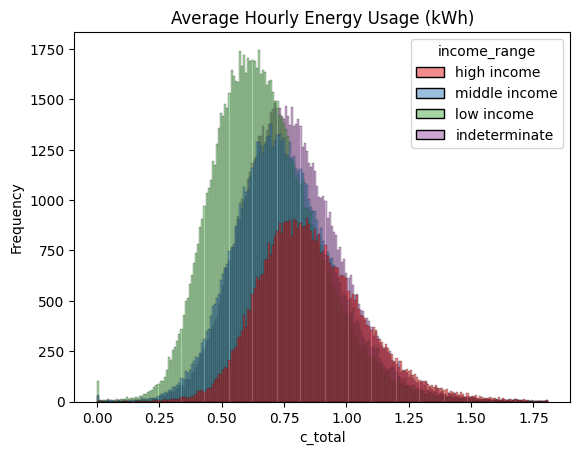

In [54]:
# Slide 81
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_total_sqrt", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_total", ylabel = "Frequency", title ='Average Hourly Energy Usage (kWh)')

[Text(0.5, 0, 'c_total_sqrt (kWh)'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'c_total_sqrt by Income Range')]

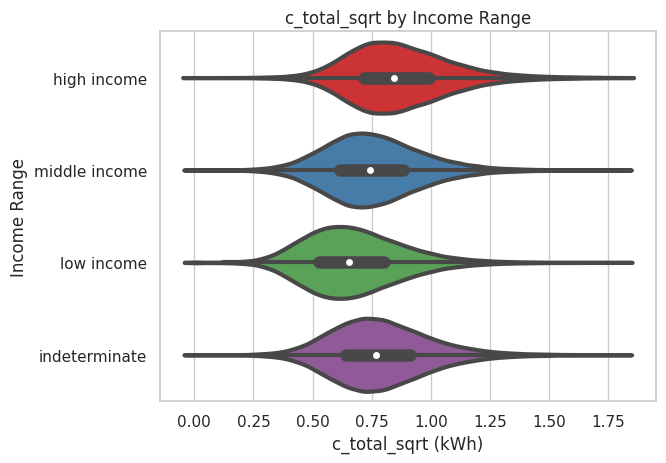

In [55]:
# Slide 81
sns.set(style="whitegrid")
violin = sns.violinplot(x="c_total_sqrt",y="income_range", data=data, palette="Set1", inner="box", cut=2, linewidth=3, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="c_total_sqrt (kWh)", ylabel = "Income Range", title ='c_total_sqrt by Income Range')

In [56]:
# Slide 81
c_total_summary = data['c_total_sqrt'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.675256,0.210899,0.0,0.528374,0.654864,0.801110,1.807866
middle income,75674.0,0.757192,0.208466,0.0,0.616914,0.740934,0.880657,1.802911
indeterminate,84243.0,0.786077,0.210313,0.0,0.642498,0.768646,0.911292,1.804725
high income,53012.0,0.864465,0.215230,0.0,0.715926,0.842635,0.992074,1.807611


In [64]:
# Slide 82 - are statistical tests viable?
x1 = data[data['income_range'] == 'indeterminate'].dropna().sample(n = 500)
x2 = data[data['income_range'] == 'middle income'].dropna().sample(n = 500)
x3 = data[data['income_range'] == 'low income'].dropna().sample(n = 500)
x4 = data[data['income_range'] == 'high income'].dropna().sample(n = 500)
t, p_ind_mid = stats.ttest_ind(x1['c_total'], x2['c_total'], equal_var=False)
t, p_low_mid = stats.ttest_ind(x3['c_total'], x2['c_total'], equal_var=False)
t, p_low_high = stats.ttest_ind(x3['c_total'], x4['c_total'], equal_var=False)
t, p_mid_high = stats.ttest_ind(x2['c_total'], x4['c_total'], equal_var=False)
# z = ztest(x1['c_total'], x2['c_total'], value=0)
anova = stats.f_oneway(x1['c_total'], x2['c_total'], x3['c_total'], x4['c_total'])
print("T test for indeterminate and middle income: ", p_ind_mid)
print("T test for low income and middle income: ", p_low_mid)
print("T test for low income and high income: ", p_low_high)
print("T test for middle income and high income: ", p_mid_high)
# print(z)
print(anova)

T test for indeterminate and middle income:  0.014613274129873684
T test for low income and middle income:  1.8674309188872994e-11
T test for low income and high income:  6.892879996678343e-41
T test for middle income and high income:  3.784791485176115e-14
F_onewayResult(statistic=70.29221337127014, pvalue=3.2663746062723517e-43)


Slides 83 and 84: c_weekday

[Text(0.5, 0, 'c_weekday'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Average Weekday Hourly Energy Usage (kWh)')]

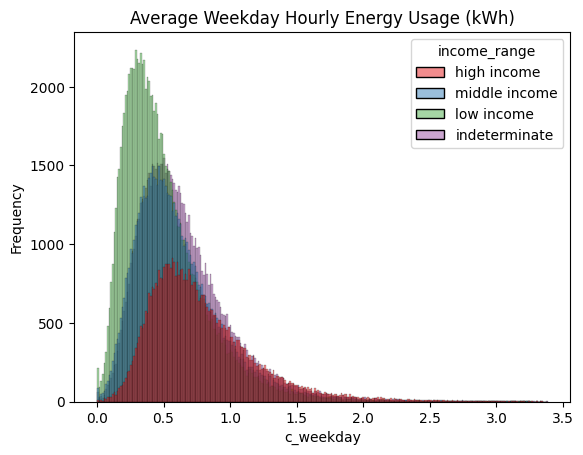

In [65]:
# Slide 83
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_weekday", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_weekday", ylabel = "Frequency", title ='Average Weekday Hourly Energy Usage (kWh)')

[Text(0.5, 0, 'c_weekday (kWh)'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'c_weekday by Income Range')]

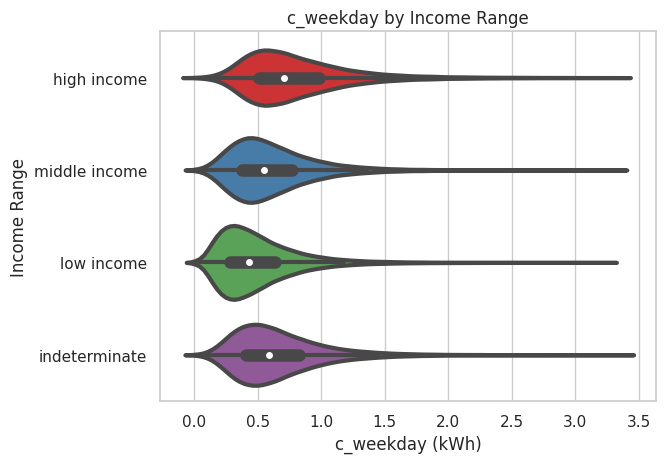

In [66]:
# Slide 83
sns.set(style="whitegrid")
violin = sns.violinplot(x="c_weekday",y="income_range", data=data, palette="Set1", inner="box", cut=2, linewidth=3, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="c_weekday (kWh)", ylabel = "Income Range", title ='c_weekday by Income Range')

In [67]:
# Slide 83
c_total_summary = data['c_weekday'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100361.0,0.498201,0.318923,0.0,0.277223,0.426645,0.639139,3.262004
middle income,75674.0,0.613452,0.344417,0.0,0.377213,0.545034,0.771987,3.334907
indeterminate,84243.0,0.658700,0.360736,0.0,0.409352,0.586729,0.825741,3.386540
high income,53012.0,0.790550,0.406532,0.0,0.508905,0.705406,0.979757,3.343643


In [68]:
data['c_weekday_sqrt'] = data["c_weekday"].transform([np.sqrt])
data

,per_id_proxy,income_range,c_total,c_weekday,c_weekend,c_day,c_morning,c_noon,c_evening,c_night,...,r_noon_over_total,r_night_over_day,r_weekday_over_weekend,r_mean_over_max,r_min_over_mean,s_variance,s_diff,s_num_peaks,c_total_sqrt,c_weekday_sqrt
0,1,middle income,0.520693,0.523133,0.514590,0.613086,0.559060,0.583057,0.702472,0.317232,...,1.119772,0.517434,1.016602,0.195309,0.249091,0.080498,0.138106,810,0.721591,0.723280
1,2,low income,0.702753,0.698614,0.713102,0.715890,0.660821,0.675728,0.793115,0.639111,...,0.961545,0.892751,0.979684,0.346269,0.098427,0.039440,0.116293,366,0.838304,0.835832
2,3,None,0.194747,0.194797,0.194621,0.231330,0.159177,0.294185,0.252184,0.115742,...,1.510604,0.500333,1.000901,0.069071,0.391278,0.024577,0.071681,728,0.441301,0.441358
3,4,middle income,0.272268,0.265712,0.288665,0.296302,0.233150,0.299159,0.304295,0.179893,...,1.098765,0.607126,0.920486,0.141394,0.325782,0.041149,0.102535,1004,0.521793,0.515472
4,5,indeterminate,0.500259,0.493510,0.517138,0.522926,0.436794,0.410892,0.743497,0.366804,...,0.821359,0.701447,0.954310,0.135315,0.022388,0.170206,0.183633,1064,0.707290,0.702503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478200,478185,None,0.690099,0.710575,0.636684,0.380044,0.506958,0.175669,0.651371,1.531242,...,0.254556,4.029114,1.116057,0.050564,0.000000,2.825172,0.369108,312,0.830722,0.842956
478201,478189,low income,0.681247,0.690808,0.657337,0.740731,0.817411,0.763627,0.637556,0.577139,...,1.120926,0.779148,1.050919,0.303654,0.000000,0.037055,0.111290,421,0.825377,0.831148
478202,478193,None,1.669027,1.639075,1.743935,1.441584,1.772254,0.279732,2.436854,1.817933,...,0.167602,1.261066,0.939871,0.176367,0.000000,1.966903,0.682125,794,1.291908,1.280263
478203,478202,None,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0,0.000000,0.000000


[Text(0.5, 0, 'c_weekday_sqrt'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Average Weekday Hourly Energy Usage (kWh)')]

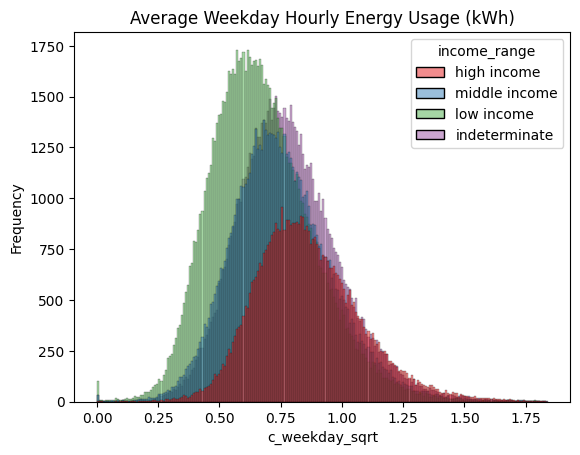

In [115]:
# Slide 84
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_weekday_sqrt", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_weekday_sqrt", ylabel = "Frequency", title ='Average Weekday Hourly Energy Usage (kWh)')

[Text(0.5, 0, 'c_weekday_sqrt (kWh)'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'c_weekday_sqrt by Income Range')]

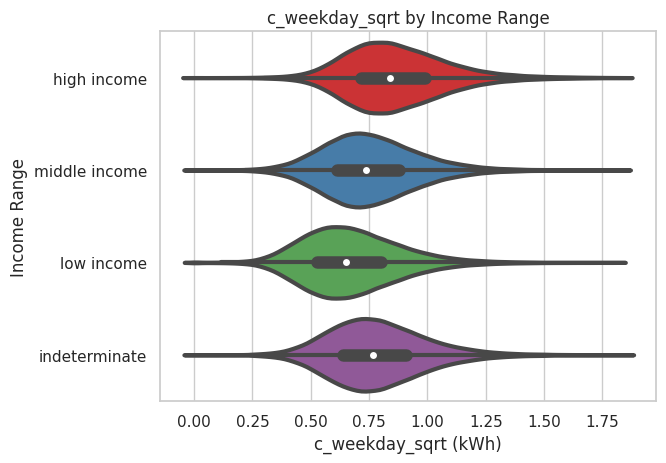

In [70]:
# Slide 84
sns.set(style="whitegrid")
violin = sns.violinplot(x="c_weekday_sqrt",y="income_range", data=data, palette="Set1", inner="box", cut=2, linewidth=3, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="c_weekday_sqrt (kWh)", ylabel = "Income Range", title ='c_weekday_sqrt by Income Range')

In [71]:
# Slide 84
c_total_summary = data['c_weekday_sqrt'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100361.0,0.673570,0.210963,0.0,0.526520,0.653180,0.799461,1.806102
middle income,75674.0,0.754920,0.208681,0.0,0.614176,0.738264,0.878628,1.826173
indeterminate,84243.0,0.783782,0.210681,0.0,0.639806,0.765983,0.908703,1.840255
high income,53012.0,0.862477,0.216066,0.0,0.713376,0.839884,0.989827,1.828563


Slides 85 and 86: c_weekend

[Text(0.5, 0, 'c_total'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Average Hourly Energy Usage (kWh) during the Weekend')]

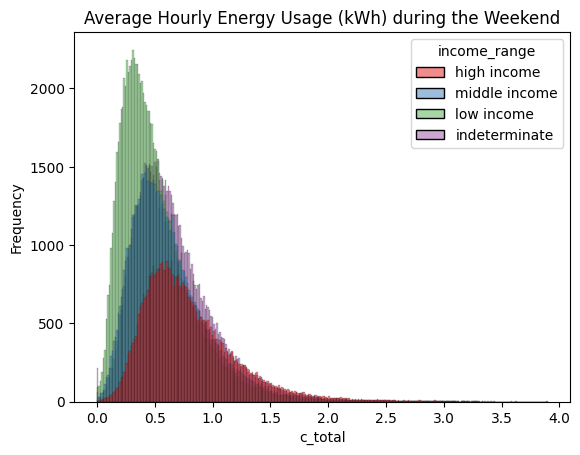

In [116]:
# Slide 85
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_weekend", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_total", ylabel = "Frequency", title ='Average Hourly Energy Usage (kWh) during the Weekend')

[Text(0.5, 0, 'c_weekend (kWh)'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'c_weekend by Income Range')]

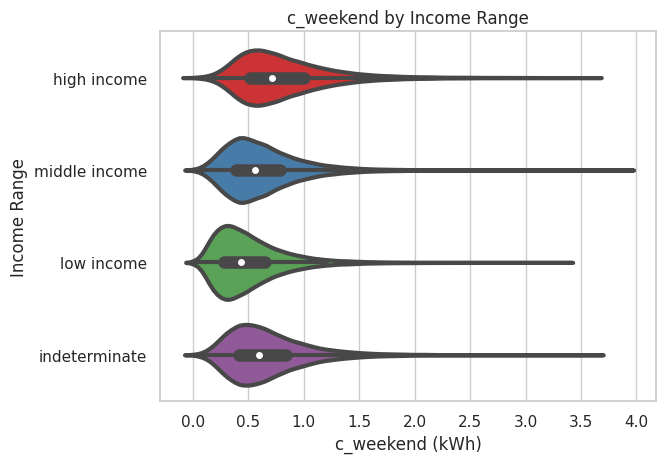

In [117]:
# Slide 85
sns.set(style="whitegrid")
violin = sns.violinplot(x="c_weekend",y="income_range", data=data, palette="Set1", inner="box", cut=2, linewidth=3, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="c_weekend (kWh)", ylabel = "Income Range", title ='c_weekend by Income Range')

In [118]:
# Slide 85
c_total_summary = data['c_weekend'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100347.0,0.506041,0.324021,0.0,0.280365,0.433718,0.650412,3.360205
middle income,75654.0,0.625179,0.350337,0.0,0.384416,0.556104,0.789152,3.900618
indeterminate,84193.0,0.670723,0.366086,0.0,0.416455,0.598620,0.842757,3.624692
high income,52984.0,0.801338,0.408293,0.0,0.515244,0.716968,0.997241,3.590131


In [119]:
data['c_weekend_sqrt'] = data["c_weekend"].transform([np.sqrt])

[Text(0.5, 0, 'c_total'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Average Hourly Energy Usage (kWh) during the Weekend')]

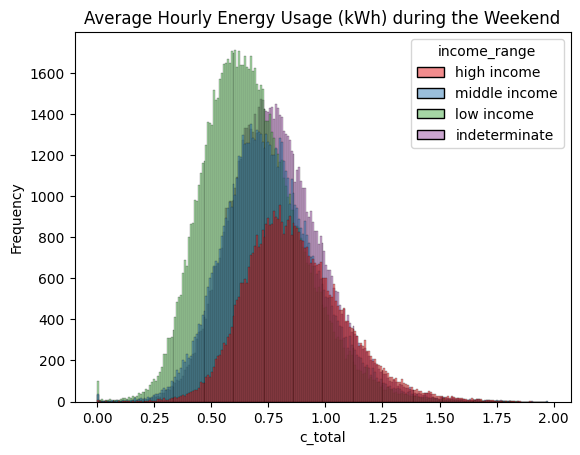

In [120]:
# Slide 86
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_weekend_sqrt", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_total", ylabel = "Frequency", title ='Average Hourly Energy Usage (kWh) during the Weekend')

[Text(0.5, 0, 'c_total_sqrt (kWh)'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'c_weekend_sqrt by Income Range')]

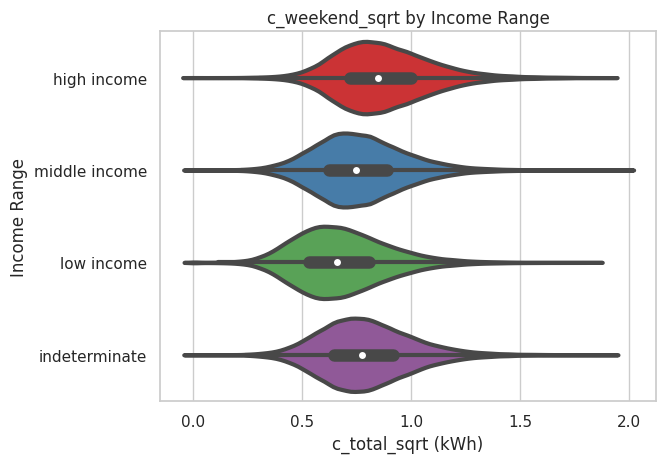

In [121]:
# Slide 86
sns.set(style="whitegrid")
violin = sns.violinplot(x="c_weekend_sqrt",y="income_range", data=data, palette="Set1", inner="box", cut=2, linewidth=3, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="c_total_sqrt (kWh)", ylabel = "Income Range", title ='c_weekend_sqrt by Income Range')

In [122]:
# Slide 86
c_total_summary = data['c_weekend_sqrt'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100347.0,0.678576,0.213487,0.0,0.529495,0.658573,0.806481,1.833086
middle income,75654.0,0.761923,0.211311,0.0,0.620013,0.745724,0.888342,1.974998
indeterminate,84193.0,0.790835,0.212846,0.0,0.645333,0.773706,0.918018,1.903862
high income,52984.0,0.868525,0.216803,0.0,0.717805,0.846739,0.998619,1.894764


Slide 87: c_max

[Text(0.5, 0, 'c_max'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Max Average Daily Energy Usage')]

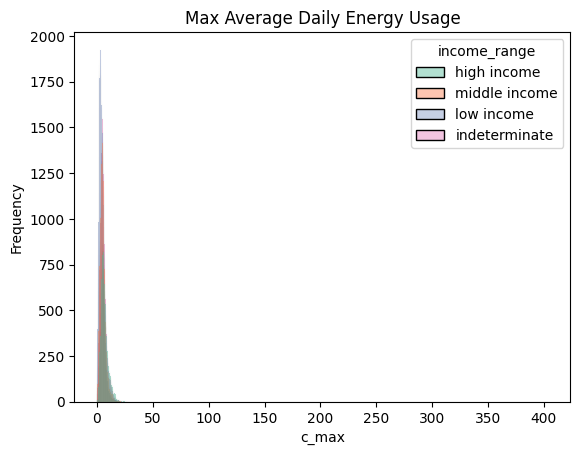

In [123]:
# Slide 87
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_max", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_max", ylabel = "Frequency", title ='Max Average Daily Energy Usage')

In [125]:
data['c_max_sqrt'] = data["c_max"].transform([np.sqrt])

[Text(0.5, 0, 'c_max_sqrt'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Max Average Daily Energy Usage SQRT Transformation')]

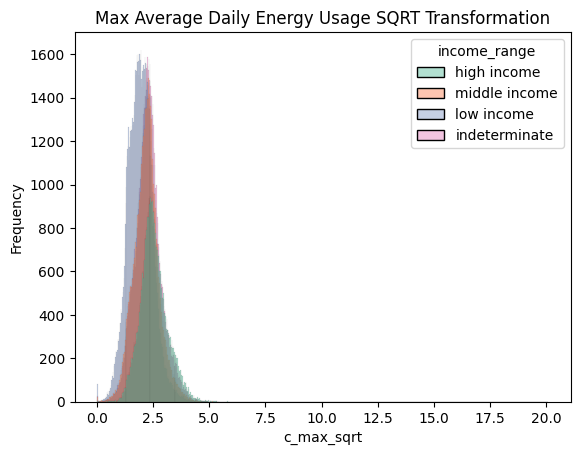

In [126]:
# Slide 87
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_max_sqrt", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_max_sqrt", ylabel = "Frequency", title ='Max Average Daily Energy Usage SQRT Transformation')

In [127]:
# Slide 87
c_total_summary = data['c_max'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,4.026672,2.668959,0.0,2.3920,3.69475,5.21090,403.52900
middle income,75674.0,5.175752,2.627482,0.0,3.4510,4.88605,6.33775,40.61456
indeterminate,84243.0,5.563692,2.881443,0.0,3.6960,5.14220,6.77400,92.33029
high income,53012.0,6.826844,3.364531,0.0,4.6081,6.13400,8.34425,62.27020


Slide 88: c_min

[Text(0.5, 0, 'c_min'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Minimum Average Daily Energy Usage')]

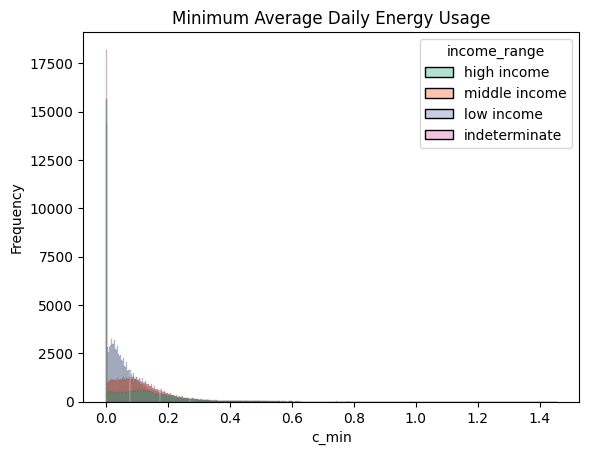

In [128]:
# Slide 88
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_min", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_min", ylabel = "Frequency", title ='Minimum Average Daily Energy Usage')

In [87]:
# Slide 88
c_total_summary = data['c_min'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.062335,0.067317,0.0,0.01475,0.043745,0.0883,1.25370
middle income,75674.0,0.089311,0.087719,0.0,0.01747,0.072900,0.1330,1.18212
indeterminate,84243.0,0.092107,0.092283,0.0,0.01300,0.075000,0.1390,1.45400
high income,53012.0,0.102092,0.111382,0.0,0.00000,0.079800,0.1609,1.38040


In [88]:
data['c_min_sqrt'] = data["c_min"].transform([np.sqrt])

[Text(0.5, 0, 'c_min_sqrt'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Minimum Average Hourly Energy Usage (kWh)')]

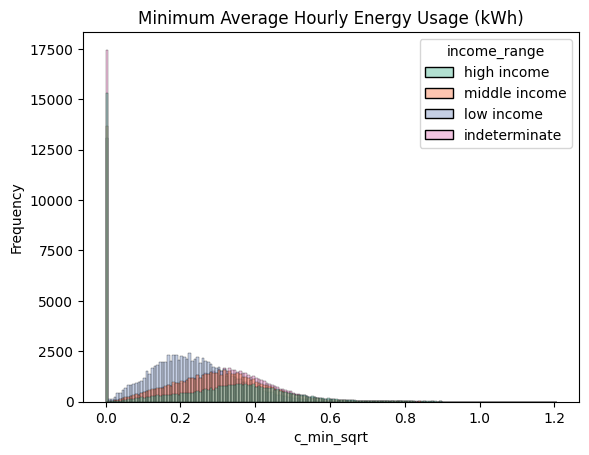

In [89]:
# Slide 88
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_min_sqrt", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_min_sqrt", ylabel = "Frequency", title ='Minimum Average Hourly Energy Usage (kWh)')

In [90]:
# Slide 88
c_total_summary = data['c_min_sqrt'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.210455,0.134329,0.0,0.121450,0.209153,0.297153,1.119687
middle income,75674.0,0.250412,0.163112,0.0,0.132174,0.270000,0.364692,1.087253
indeterminate,84243.0,0.250770,0.170943,0.0,0.114018,0.273861,0.372827,1.205819
high income,53012.0,0.250828,0.197935,0.0,0.000000,0.282489,0.401123,1.174904


Slide 89: c_day

[Text(0.5, 0, 'c_day'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Daytime Hourly Energy Usage (kWh)')]

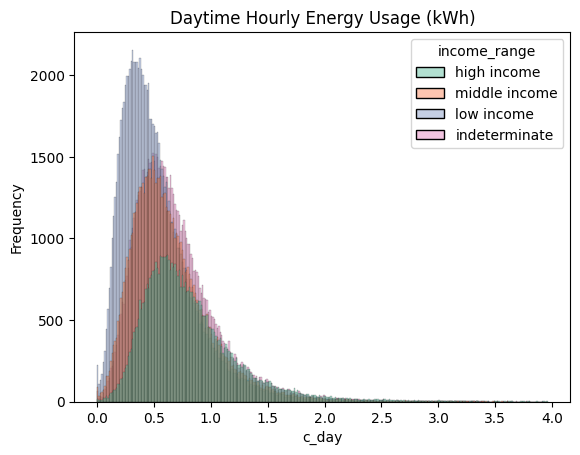

In [91]:
# Slide 89
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_day", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_day", ylabel = "Frequency", title ='Daytime Hourly Energy Usage (kWh)')

In [92]:
# Slide 89
c_total_summary = data['c_day'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100361.0,0.525249,0.329611,0.0,0.295798,0.453595,0.674003,3.914370
middle income,75674.0,0.645023,0.357098,0.0,0.400149,0.576480,0.810600,3.615238
indeterminate,84243.0,0.687228,0.371145,0.0,0.431318,0.616492,0.858570,3.801891
high income,53012.0,0.811158,0.417148,0.0,0.525504,0.726586,0.999308,3.961612


In [93]:
data['c_day_sqrt'] = data["c_day"].transform([np.sqrt])

[Text(0.5, 0, 'c_day_sqrt'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Daytime Hourly Energy Usage (kWh)')]

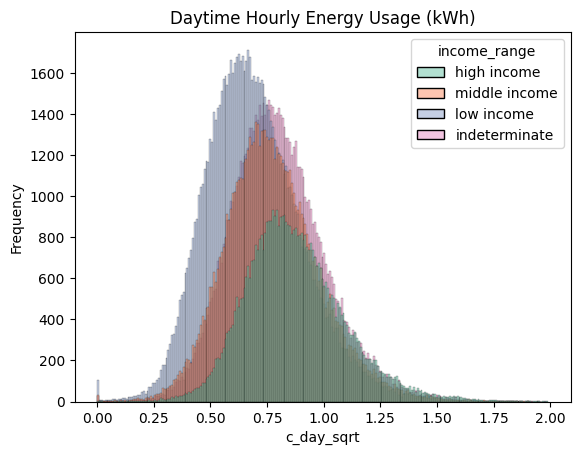

In [94]:
# Slide 89
plt.rcdefaults()
hist = sns.histplot(data=data, x="c_day_sqrt", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_day_sqrt", ylabel = "Frequency", title ='Daytime Hourly Energy Usage (kWh)')

In [95]:
# Slide 89
c_total_summary = data['c_day_sqrt'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100361.0,0.692308,0.214380,0.0,0.543873,0.673495,0.820977,1.978477
middle income,75674.0,0.774636,0.212044,0.0,0.632573,0.759262,0.900333,1.901378
indeterminate,84243.0,0.801186,0.212907,0.0,0.656748,0.785170,0.926590,1.949844
high income,53012.0,0.873694,0.218672,0.0,0.724917,0.852400,0.999654,1.990380


In [96]:
parts_of_day_ind = indeterminate[['c_day', 'c_morning', 'c_noon', 'c_evening', 'c_night']]
parts_of_day_low = low_income[['c_day', 'c_morning', 'c_noon', 'c_evening', 'c_night']]
parts_of_day_mid = mid_income[['c_day', 'c_morning', 'c_noon', 'c_evening', 'c_night']]
parts_of_day_high = high_income[['c_day', 'c_morning', 'c_noon', 'c_evening', 'c_night']]

Slides 90 - 93: Pairplots for c_day, c_morning, c_noon, c_evening, and c_night by income range

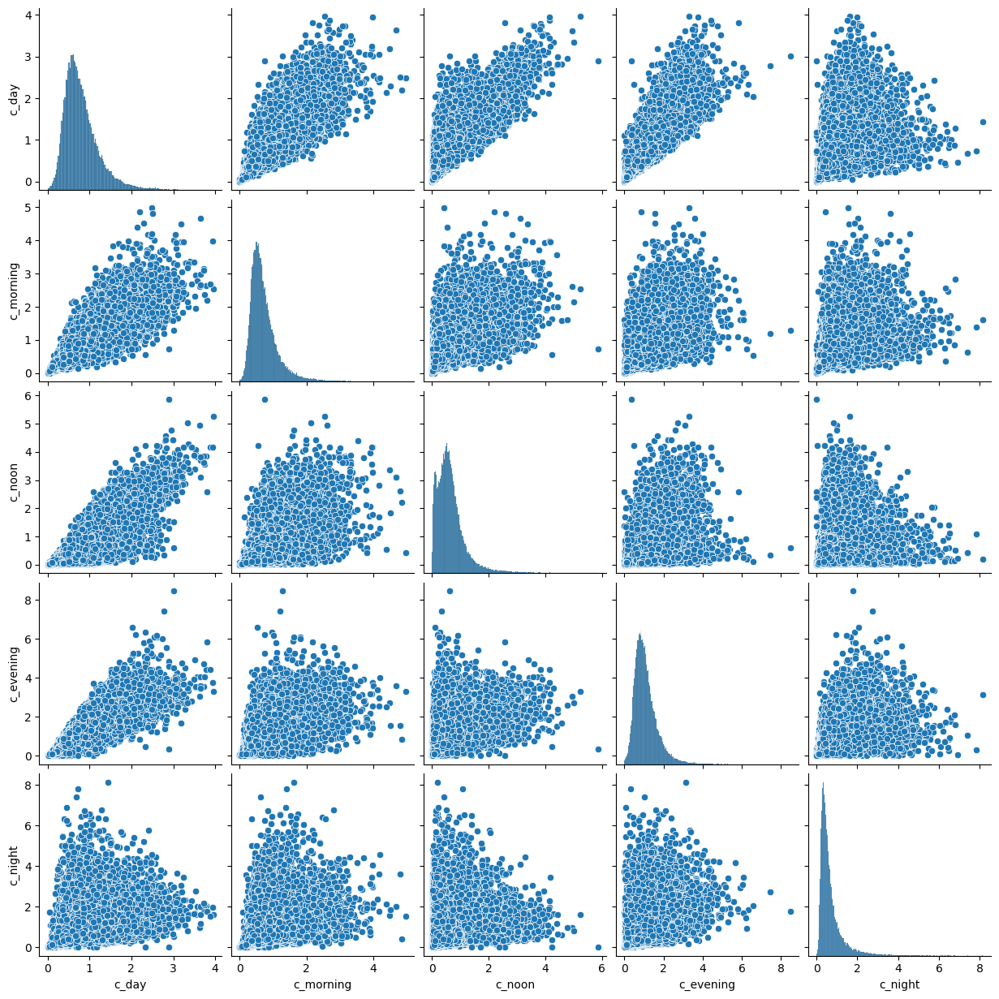

In [129]:
# Slide 90
sns.pairplot(parts_of_day_high)
plt.show()

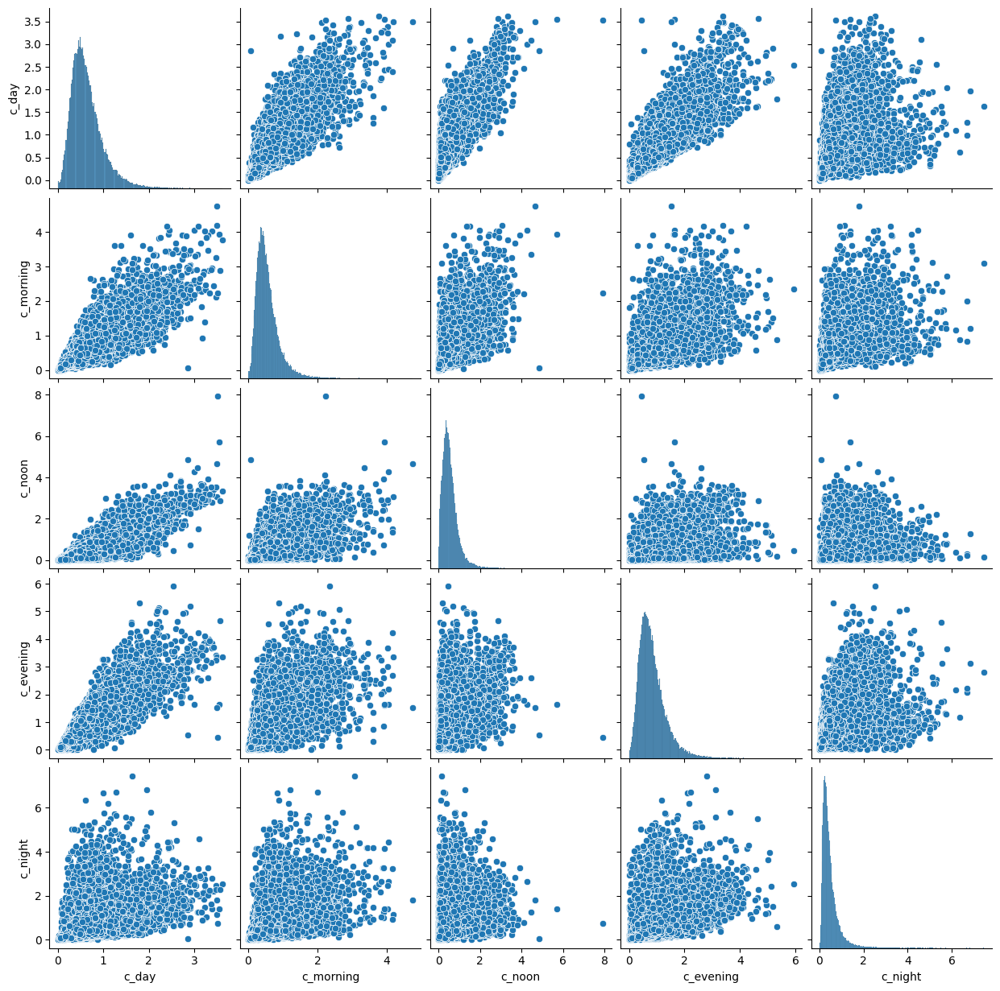

In [99]:
# Slide 91
sns.pairplot(parts_of_day_mid)
plt.show()

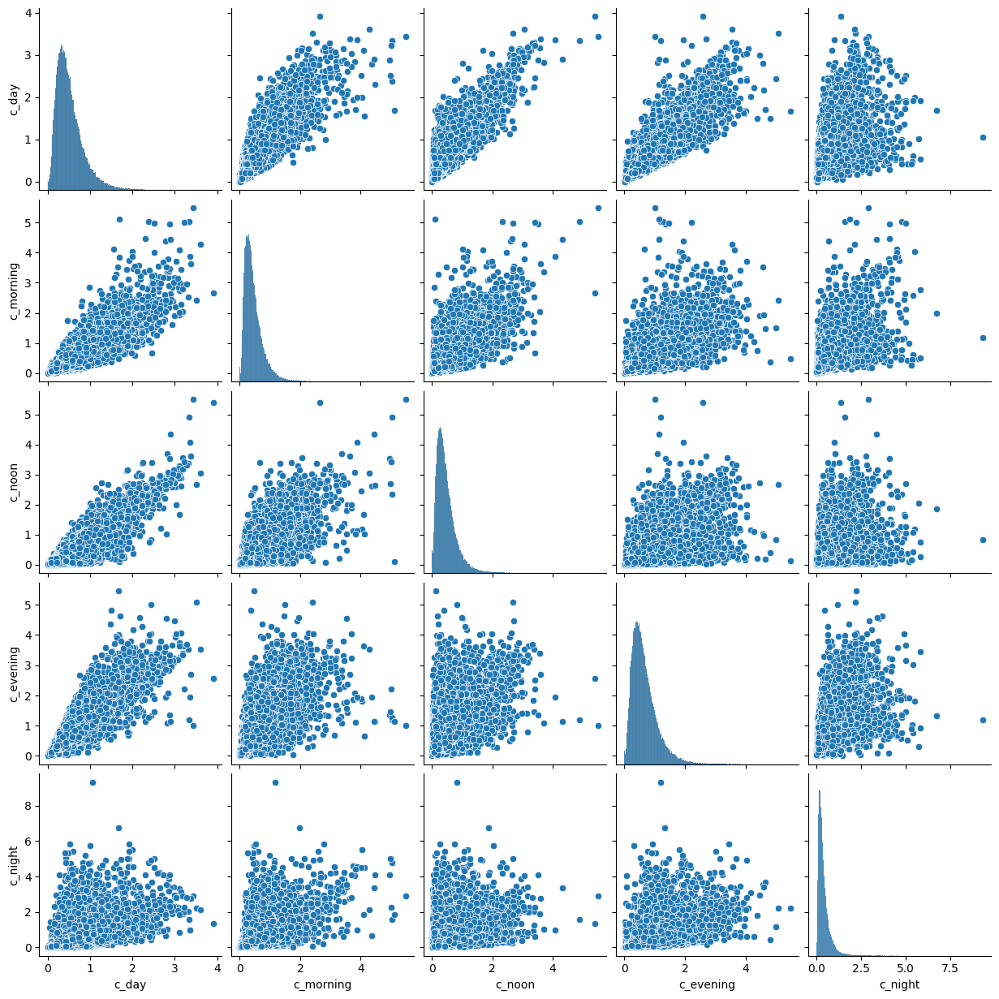

In [98]:
# Slide 92
sns.pairplot(parts_of_day_low)
plt.show()

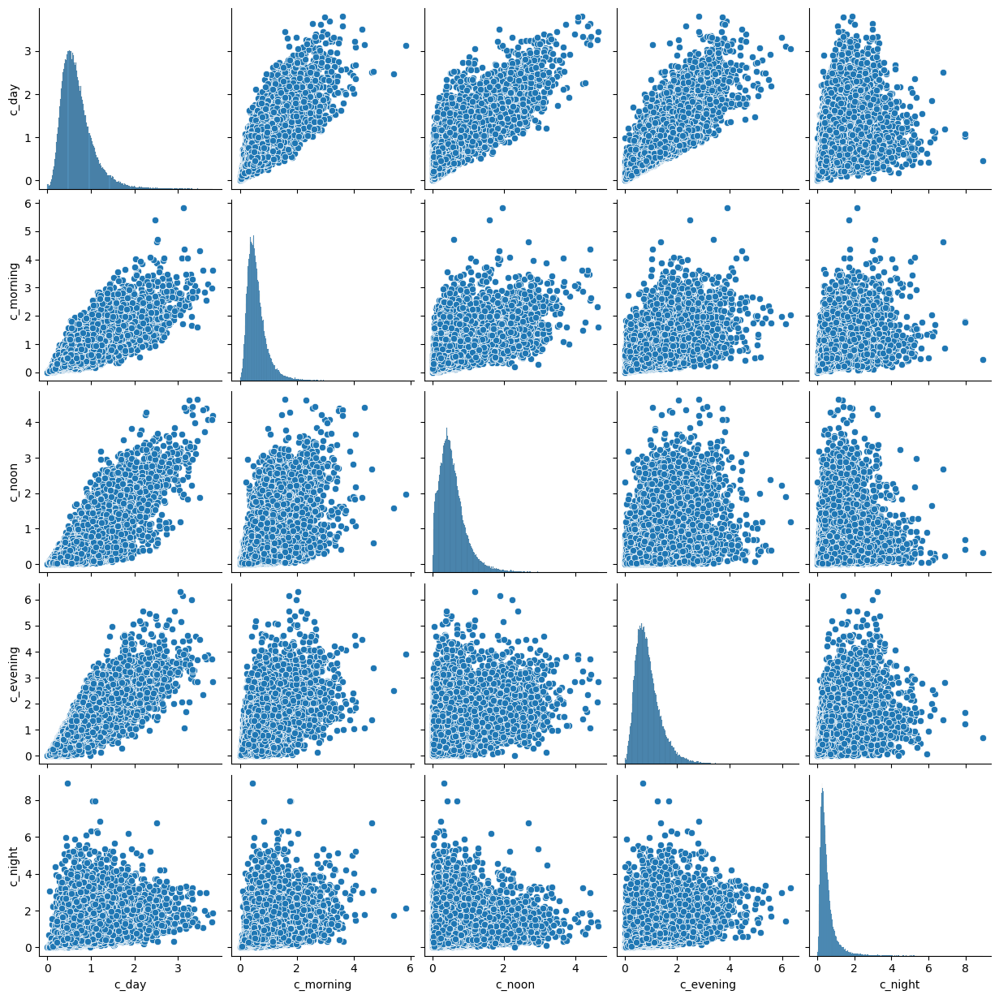

In [97]:
# Slide 93
sns.pairplot(parts_of_day_ind)
plt.show()

Slide 94: s_variance

[Text(0.5, 0, 's_variance'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Variance')]

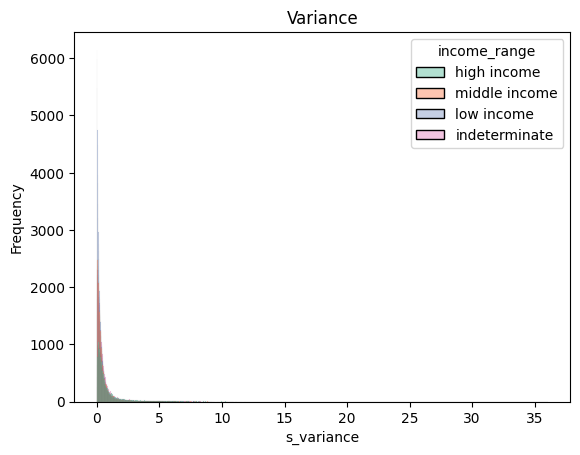

In [100]:
# Slide 94
plt.rcdefaults()
hist = sns.histplot(data=data, x="s_variance", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="s_variance", ylabel = "Frequency", title ='Variance')

In [101]:
# Slide 94
c_total_summary = data['s_variance'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.311840,0.640266,0.0,0.058132,0.154258,0.347698,36.051597
middle income,75674.0,0.474311,0.820109,0.0,0.105107,0.243996,0.506620,19.651686
indeterminate,84243.0,0.565073,0.947152,0.0,0.124447,0.280511,0.593958,20.666778
high income,53012.0,0.846405,1.269679,0.0,0.198867,0.417090,0.891798,25.510757


In [102]:
data['s_variance_sqrt2'] = data["s_variance"].transform([np.sqrt]).transform([np.sqrt])

[Text(0.5, 0, 's_variance_sqrt2'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Variances Transformed with 2 Square Roots')]

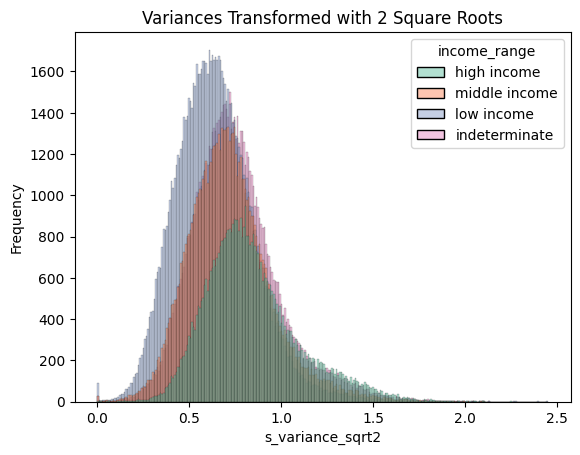

In [103]:
# Slide 94
plt.rcdefaults()
hist = sns.histplot(data=data, x="s_variance_sqrt2", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="s_variance_sqrt2", ylabel = "Frequency", title ='Variances Transformed with 2 Square Roots')

In [104]:
# Slide 94
c_total_summary = data['s_variance_sqrt2'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.639896,0.216907,0.0,0.491025,0.626703,0.767893,2.450367
middle income,75674.0,0.721919,0.228599,0.0,0.569387,0.702823,0.843666,2.105474
indeterminate,84243.0,0.753745,0.239047,0.0,0.593945,0.727759,0.877888,2.132152
high income,53012.0,0.842333,0.256197,0.0,0.667791,0.803632,0.971777,2.247402


Slide 95: s_diff

[Text(0.5, 0, 's_diff'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Lagged Difference')]

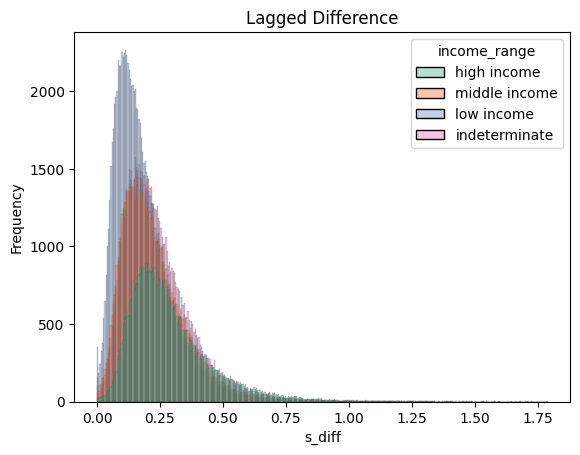

In [105]:
# Slide 95
plt.rcdefaults()
hist = sns.histplot(data=data, x="s_diff", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="s_diff", ylabel = "Frequency", title ='Lagged Difference')

In [106]:
# Slide 95
c_total_summary = data['s_diff'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.182987,0.120181,0.0,0.098913,0.155725,0.237510,1.309950
middle income,75674.0,0.227499,0.134925,0.0,0.133359,0.200144,0.290810,1.535965
indeterminate,84243.0,0.244191,0.144225,0.0,0.143967,0.214212,0.309762,1.726188
high income,53012.0,0.292505,0.164885,0.0,0.179328,0.256009,0.364633,1.790075


In [107]:
data['s_diff_sqrt'] = data["s_diff"].transform([np.sqrt])

[Text(0.5, 0, 's_diff_sqrt'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Lagged Differences Square Root Transformation')]

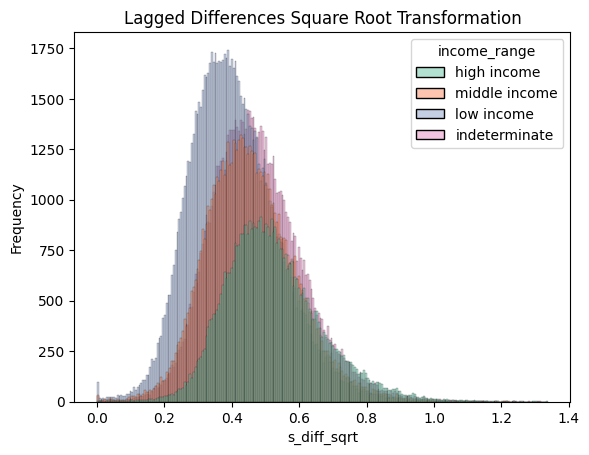

In [108]:
# Slide 95
plt.rcdefaults()
hist = sns.histplot(data=data, x="s_diff_sqrt", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="s_diff_sqrt", ylabel = "Frequency", title ='Lagged Differences Square Root Transformation')

In [109]:
# Slide 95
c_total_summary = data['s_diff_sqrt'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
low income,100362.0,0.406679,0.132661,0.0,0.314505,0.394620,0.487350,1.144531
middle income,75674.0,0.457561,0.134673,0.0,0.365183,0.447375,0.539268,1.239341
indeterminate,84243.0,0.474582,0.137707,0.0,0.379430,0.462831,0.556563,1.313845
high income,53012.0,0.521649,0.142784,0.0,0.423471,0.505973,0.603849,1.337937


Slide 96: s_num_peaks

[Text(0.5, 0, 's_num_peaks'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'Number of Peaks')]

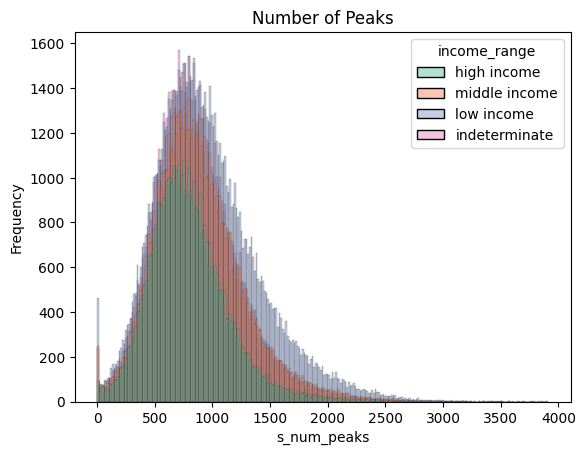

In [110]:
# Slide 96
plt.rcdefaults()
hist = sns.histplot(data=data, x="s_num_peaks", hue="income_range", palette="Set2", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="s_num_peaks", ylabel = "Frequency", title ='Number of Peaks')

In [111]:
# Slide 96
c_total_summary = data['s_num_peaks'].groupby(data['income_range']).describe()
c_total_summary = c_total_summary.sort_values(by='50%')
c_total_summary

,count,mean,std,min,25%,50%,75%,max
income_range,,,,,,,,
high income,53012.0,796.332661,347.339395,0.0,566.0,757.0,977.0,3226.0
indeterminate,84243.0,862.155954,382.192329,0.0,607.0,818.0,1065.0,3770.0
middle income,75674.0,883.927888,396.237018,0.0,618.0,837.0,1094.0,3910.0
low income,100362.0,956.761404,458.486293,0.0,640.0,893.0,1205.0,3858.0


Slide 97: t_above_mean_kwh and t_above_half_kwh

Text(0, 0.5, 'Frequency')

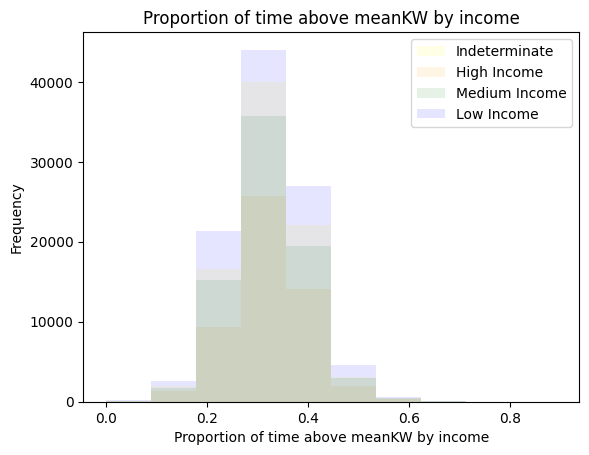

In [130]:
# Create list of data according to different accessibility index
#
x1 = list(data[data['income_range'] == "low income"]['t_above_mean_kwh'])
x2 = list(data[data['income_range'] == "middle income"]['t_above_mean_kwh'])
x3 = list(data[data['income_range'] == "high income"]['t_above_mean_kwh'])
x4 = list(data[data['income_range'] == "indeterminate"]['t_above_mean_kwh'])
 
# Setting colors and names
#
colors=['blue', 'green', 'orange', 'yellow']
names=['Low Income', 'Medium Income', 'High Income', 'Indeterminate']

min_list = [min(x1), min(x2), min(x3), min(x4)]
max_list = [max(x1), max(x2), max(x3), max(x4)]
 
# Creating plot with list values, colors and names (labels)
# Note the density value set as true which represents the
# probability distribution
# Note the parameter stacked = True which results in stacked histogram plot
#
plt.hist([x1, x2, x3, x4], align='mid', color=colors, label=names, histtype="stepfilled", alpha=0.1)
plt.legend()
plt.title('Proportion of time above meanKW by income')
plt.xlabel('Proportion of time above meanKW by income')
plt.ylabel('Frequency')

# print(round(min(min_list)), round(max(max_list)))

Text(0, 0.5, 'Frequency')

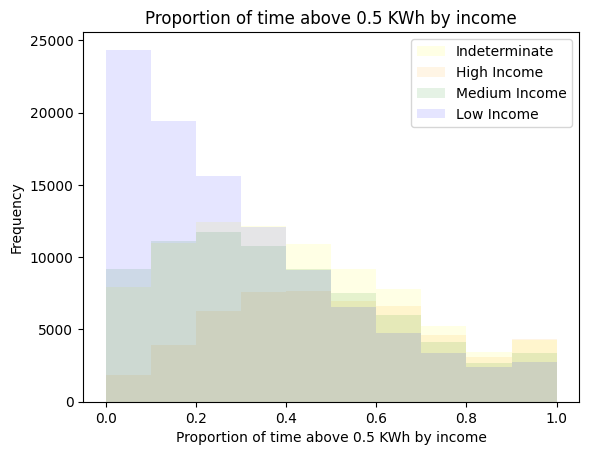

In [132]:
# Create list of data according to different accessibility index
#
x1 = list(data[data['income_range'] == "low income"]['t_above_half_kwh'])
x2 = list(data[data['income_range'] == "middle income"]['t_above_half_kwh'])
x3 = list(data[data['income_range'] == "high income"]['t_above_half_kwh'])
x4 = list(data[data['income_range'] == "indeterminate"]['t_above_half_kwh'])
 
# Setting colors and names
#
colors=['blue', 'green', 'orange', 'yellow']
names=['Low Income', 'Medium Income', 'High Income', 'Indeterminate']

min_list = [min(x1), min(x2), min(x3), min(x4)]
max_list = [max(x1), max(x2), max(x3), max(x4)]
 
# Creating plot with list values, colors and names (labels)
# Note the density value set as true which represents the
# probability distribution
# Note the parameter stacked = True which results in stacked histogram plot
#
plt.hist([x1, x2, x3, x4], align='mid', color=colors, label=names, histtype="stepfilled", alpha=0.1)
plt.legend()
plt.title('Proportion of time above 0.5 KWh by income')
plt.xlabel('Proportion of time above 0.5 KWh by income')
plt.ylabel('Frequency')

# print(round(min(min_list)), round(max(max_list)))

Slide 98: t_above_one_kwh and t_above_two_kwh

Text(0, 0.5, 'Frequency')

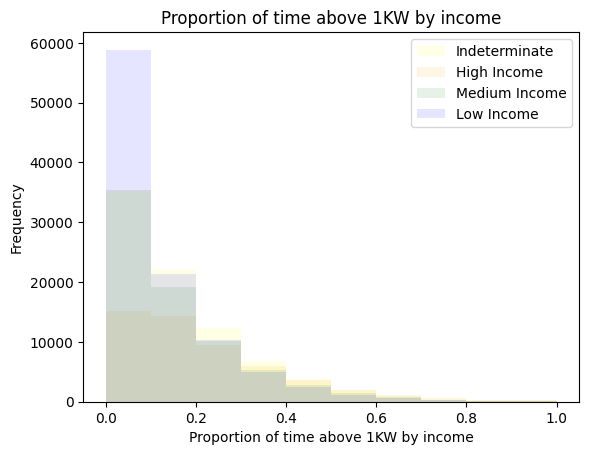

In [133]:
# Create list of data according to different accessibility index
#
x1 = list(data[data['income_range'] == "low income"]['t_above_one_kwh'])
x2 = list(data[data['income_range'] == "middle income"]['t_above_one_kwh'])
x3 = list(data[data['income_range'] == "high income"]['t_above_one_kwh'])
x4 = list(data[data['income_range'] == "indeterminate"]['t_above_one_kwh'])
 
# Setting colors and names
#
colors=['blue', 'green', 'orange', 'yellow']
names=['Low Income', 'Medium Income', 'High Income', 'Indeterminate']

min_list = [min(x1), min(x2), min(x3), min(x4)]
max_list = [max(x1), max(x2), max(x3), max(x4)]
 
# Creating plot with list values, colors and names (labels)
# Note the density value set as true which represents the
# probability distribution
# Note the parameter stacked = True which results in stacked histogram plot
#
plt.hist([x1, x2, x3, x4], align='mid', color=colors, label=names, histtype="stepfilled", alpha=0.1)
plt.legend()
plt.title('Proportion of time above 1KW by income')
plt.xlabel('Proportion of time above 1KW by income')
plt.ylabel('Frequency')

# print(round(min(min_list)), round(max(max_list)))

Text(0, 0.5, 'Frequency')

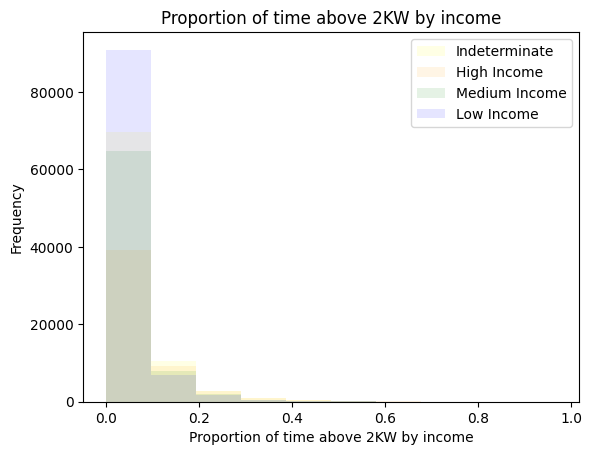

In [134]:
# Create list of data according to different accessibility index
#
x1 = list(data[data['income_range'] == "low income"]['t_above_two_kwh'])
x2 = list(data[data['income_range'] == "middle income"]['t_above_two_kwh'])
x3 = list(data[data['income_range'] == "high income"]['t_above_two_kwh'])
x4 = list(data[data['income_range'] == "indeterminate"]['t_above_two_kwh'])
 
# Setting colors and names
#
colors=['blue', 'green', 'orange', 'yellow']
names=['Low Income', 'Medium Income', 'High Income', 'Indeterminate']

min_list = [min(x1), min(x2), min(x3), min(x4)]
max_list = [max(x1), max(x2), max(x3), max(x4)]
 
# Creating plot with list values, colors and names (labels)
# Note the density value set as true which represents the
# probability distribution
# Note the parameter stacked = True which results in stacked histogram plot
#
plt.hist([x1, x2, x3, x4], align='mid', color=colors, label=names, histtype="stepfilled", alpha=0.1)
plt.legend()
plt.title('Proportion of time above 2KW by income')
plt.xlabel('Proportion of time above 2KW by income')
plt.ylabel('Frequency')

# print(round(min(min_list)), round(max(max_list)))

[Text(0.5, 0, 'r_noon_over_total'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'r_noon_over_total')]

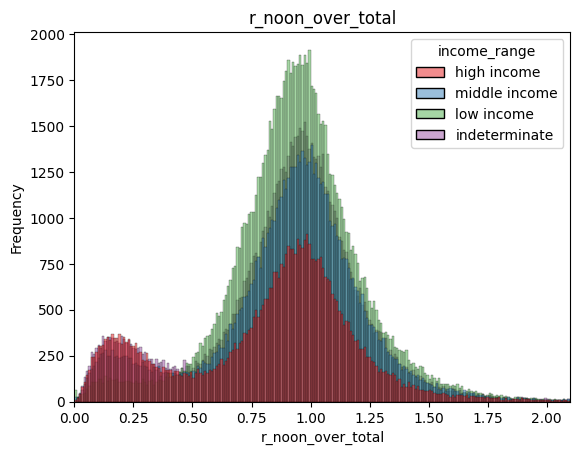

In [13]:
# Slide 100
plt.rcdefaults()
plt.xlim(0, 2.1)
hist = sns.histplot(data=data, x="r_noon_over_total", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="r_noon_over_total", ylabel = "Frequency", title ='r_noon_over_total')

In [19]:
data = data[np.abs(stats.zscore(data["r_evening_over_noon"], nan_policy='omit')) < 3]

[Text(0.5, 0, 'r_noon_over_total'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'r_noon_over_total')]

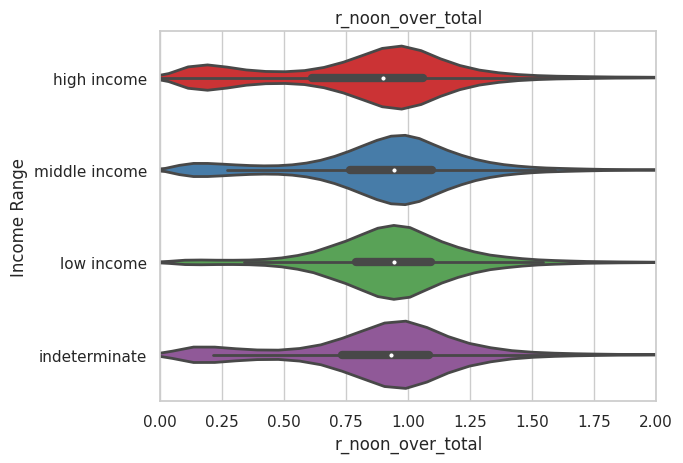

In [8]:
# Slide 100
sns.set(style="whitegrid")
plt.xlim(0, 2)
violin = sns.violinplot(x="r_noon_over_total",y="income_range", data=data, palette="Set1", inner="box", cut=1, linewidth=2, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="r_noon_over_total", ylabel = "Income Range", title ='r_noon_over_total')

In [ ]:
c_noon_summary = data['r_noon_over_total'].groupby(data['income_range']).describe()
c_noon_summary = c_noon_summary.sort_values(by='50%')
c_noon_summary

[Text(0.5, 0, 'r_mean_over_max'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'r_mean_over_max')]

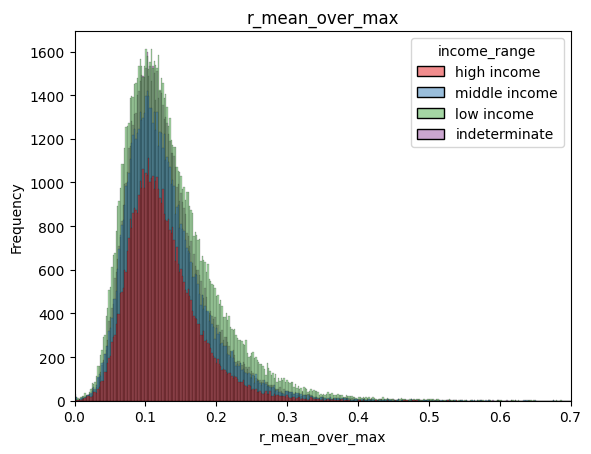

In [25]:
# Slide 101
plt.rcdefaults()
plt.xlim(0, 0.7)
hist = sns.histplot(data=data, x="r_mean_over_max", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="r_mean_over_max", ylabel = "Frequency", title ='r_mean_over_max')

In [ ]:
# Slide 102
plt.rcdefaults()
plt.xlim(0, 3)
hist = sns.histplot(data=data, x="r_night_over_day", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="c_total", ylabel = "Frequency", title ='Average Hourly Energy Usage (kWh)')

[Text(0.5, 0, 'r_min_over_mean'),
 Text(0, 0.5, 'Frequency'),
 Text(0.5, 1.0, 'r_min_over_mean')]

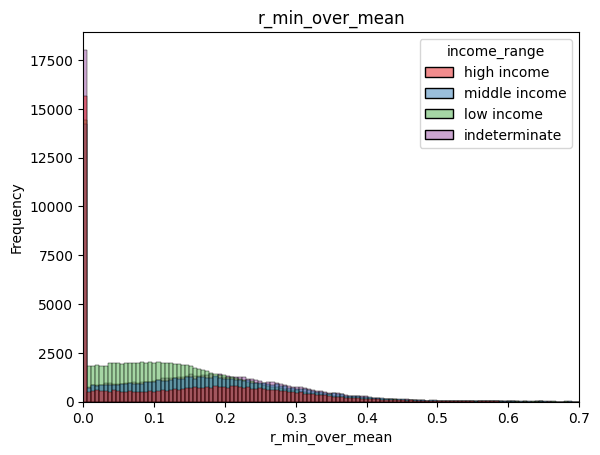

In [11]:
# Slide 103
plt.rcdefaults()
plt.xlim(0, 0.7)
hist = sns.histplot(data=data, x="r_min_over_mean", hue="income_range", palette="Set1", hue_order = ["high income", "middle income", "low income", "indeterminate"])
hist.set(xlabel ="r_min_over_mean", ylabel = "Frequency", title ='r_min_over_mean')

[Text(0.5, 0, 'r_min_over_mean'),
 Text(0, 0.5, 'Income Range'),
 Text(0.5, 1.0, 'Min over Mean energy usage')]

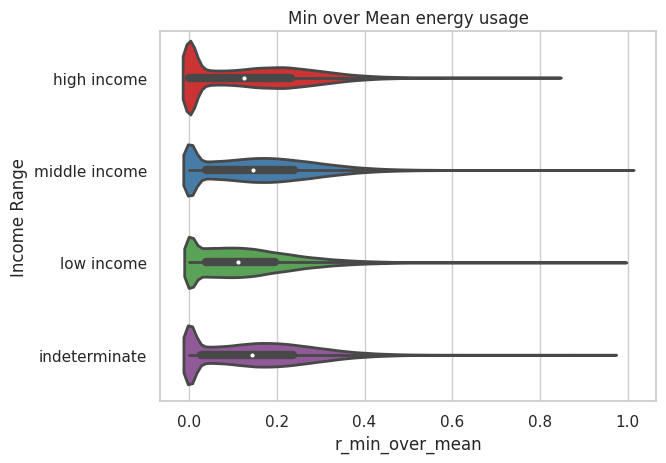

In [15]:
# Slide 103
sns.set(style="whitegrid")
violin = sns.violinplot(x="r_min_over_mean",y="income_range", data=data, palette="Set1", inner="box", cut=1, linewidth=2, order = ["high income", "middle income", "low income", "indeterminate"])
violin.set(xlabel ="r_min_over_mean", ylabel = "Income Range", title ='Min over Mean energy usage')